# **I. Preprocessing Data**

1. Import thư viện cần thiết

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, ttest_ind
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from prophet import Prophet
import seaborn as sns
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.pipeline import Pipeline
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [2]:
# Read data from CSV files
df_transaction = pd.read_csv("/content/transaction_data_2023_2024_updated.csv")
df_promotion = pd.read_csv("/content/promotion_data.csv")
df_store = pd.read_csv("/content/store_info_data_2023_2024_updated.csv")

In [3]:
df_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65674 entries, 0 to 65673
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Date               65674 non-null  object 
 1   Store_ID           65674 non-null  object 
 2   Store_Location     65674 non-null  object 
 3   Product_ID         65674 non-null  object 
 4   Product_Name       65674 non-null  object 
 5   Brand              65674 non-null  object 
 6   Quantity_Sold      65674 non-null  int64  
 7   Price              65674 non-null  float64
 8   Stock_Level        65674 non-null  int64  
 9   Reorder_Threshold  65674 non-null  int64  
 10  Revenue            65674 non-null  int64  
dtypes: float64(1), int64(4), object(6)
memory usage: 5.5+ MB


In [4]:
df_promotion.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Promo_ID    40 non-null     object
 1   Start_Date  40 non-null     object
 2   End_Date    40 non-null     object
 3   Budget      40 non-null     int64 
 4   Promo_Type  40 non-null     object
dtypes: int64(1), object(4)
memory usage: 1.7+ KB


In [5]:
df_store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55 entries, 0 to 54
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Store_ID          55 non-null     object 
 1   Store_Location    55 non-null     object 
 2   Store_Size        55 non-null     int64  
 3   Related_Store_ID  55 non-null     object 
 4   Distance          55 non-null     float64
 5   Transport_Cost    55 non-null     float64
dtypes: float64(2), int64(1), object(3)
memory usage: 2.7+ KB


2. Làm sạch dữ liệu cơ bản

In [6]:
# Remove duplicate rows from each table
df_transaction.drop_duplicates(inplace=True)
df_promotion.drop_duplicates(inplace=True)
df_store.drop_duplicates(inplace=True)

# Convert date columns to datetime format
df_transaction['Date'] = pd.to_datetime(df_transaction['Date'])
df_promotion['Start_Date'] = pd.to_datetime(df_promotion['Start_Date'])
df_promotion['End_Date'] = pd.to_datetime(df_promotion['End_Date'])

# Extract temporal features from the Date column
df_transaction['Year'] = df_transaction['Date'].dt.year
df_transaction['Month'] = df_transaction['Date'].dt.month
df_transaction['Quarter'] = df_transaction['Date'].dt.quarter

3. Xử lý dữ liệu khuyến mãi + join data promotion

In [7]:
# Standardize and encode Promo_Type column
df_promotion['Promo_Type'] = df_promotion['Promo_Type'].str.lower().str.strip()
promo_type_mapping = {
    'no promotion': 0,
    'discount': 1,
    'trade-in': 2,
}
df_promotion['Promo_Type_Code'] = df_promotion['Promo_Type'].map(promo_type_mapping)

# Initialize default promotion columns in transaction data
df_transaction['Promo_ID'] = None
df_transaction['Promo_Type_Code'] = 0
df_transaction['Promo_Budget'] = 0

# Assign promotion information based on date range
for _, promo_row in df_promotion.iterrows():
    mask = (df_transaction['Date'] >= promo_row['Start_Date']) & (df_transaction['Date'] <= promo_row['End_Date'])
    df_transaction.loc[mask, 'Promo_ID'] = promo_row['Promo_ID']
    df_transaction.loc[mask, 'Promo_Type_Code'] = promo_row['Promo_Type_Code']
    df_transaction.loc[mask, 'Promo_Budget'] = promo_row['Budget']

4. Join data store_info để hoàn thiện dataset

In [8]:
# Select 'Store_Size' column and remove duplicates
df_store_clean = df_store[['Store_ID', 'Store_Size']].drop_duplicates()

# Merge store information into transaction data
df_final = df_transaction.merge(df_store_clean, on='Store_ID', how='left')

# Handle missing values for Promo_ID and Store_Size
df_final['Promo_ID'] = df_final['Promo_ID'].fillna('No Promo')
df_final['Store_Size'] = df_final['Store_Size'].fillna(df_final['Store_Size'].median())

5. Kiểm tra và làm sạch data sau khi join


In [9]:
# Cleanse negative values in numerical columns
cols_to_clean = ['Quantity_Sold', 'Price', 'Stock_Level', 'Reorder_Threshold', 'Revenue']
for col in cols_to_clean:
    df_final[col] = df_final[col].apply(lambda x: x if x >= 0 else np.nan)

# Drop rows with critical missing values
df_final.dropna(subset=['Quantity_Sold', 'Price', 'Stock_Level'], inplace=True)

# Reset row index
df_final.reset_index(drop=True, inplace=True)

In [10]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65674 entries, 0 to 65673
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               65674 non-null  datetime64[ns]
 1   Store_ID           65674 non-null  object        
 2   Store_Location     65674 non-null  object        
 3   Product_ID         65674 non-null  object        
 4   Product_Name       65674 non-null  object        
 5   Brand              65674 non-null  object        
 6   Quantity_Sold      65674 non-null  int64         
 7   Price              65674 non-null  float64       
 8   Stock_Level        65674 non-null  int64         
 9   Reorder_Threshold  65674 non-null  int64         
 10  Revenue            65674 non-null  int64         
 11  Year               65674 non-null  int32         
 12  Month              65674 non-null  int32         
 13  Quarter            65674 non-null  int32         
 14  Promo_

In [11]:
df_final.head(10)

,Date,Store_ID,Store_Location,Product_ID,Product_Name,Brand,Quantity_Sold,Price,Stock_Level,Reorder_Threshold,Revenue,Year,Month,Quarter,Promo_ID,Promo_Type_Code,Promo_Budget,Store_Size
0,2023-01-01,HN01,Hoàn Kiếm,IPH14PM,iPhone 14 Pro Max,Apple,17,29.99,20,10,509830000,2023,1,1,No Promo,0,0,200
1,2023-01-01,HN01,Hoàn Kiếm,IPH14P,iPhone 14 Pro,Apple,20,24.99,20,10,499800000,2023,1,1,No Promo,0,0,200
2,2023-01-01,HN01,Hoàn Kiếm,IPH14,iPhone 14,Apple,19,19.99,20,10,379810000,2023,1,1,No Promo,0,0,200
3,2023-01-01,HN02,Đống Đa,IPH14PM,iPhone 14 Pro Max,Apple,8,29.99,12,10,239920000,2023,1,1,No Promo,0,0,160
4,2023-01-01,HN02,Đống Đa,IPH14P,iPhone 14 Pro,Apple,10,24.99,10,10,249900000,2023,1,1,No Promo,0,0,160
5,2023-01-01,HN02,Đống Đa,IPH14,iPhone 14,Apple,12,19.99,20,10,239880000,2023,1,1,No Promo,0,0,160
6,2023-01-01,HN03,Hai Bà Trưng,IPH14PM,iPhone 14 Pro Max,Apple,21,29.99,20,10,629790000,2023,1,1,No Promo,0,0,160
7,2023-01-01,HN03,Hai Bà Trưng,IPH14P,iPhone 14 Pro,Apple,19,24.99,20,10,474810000,2023,1,1,No Promo,0,0,160
8,2023-01-01,HN03,Hai Bà Trưng,IPH14,iPhone 14,Apple,16,19.99,20,10,319840000,2023,1,1,No Promo,0,0,160
9,2023-01-01,HN04,Ba Đình,IPH14PM,iPhone 14 Pro Max,Apple,19,29.99,20,10,569810000,2023,1,1,No Promo,0,0,170


In [13]:
# Save the final DataFrame to a CSV file
df_final.to_csv('final_dataset.csv', index=False)

# **II. Explotary Data Analysis**

    1. Sales Performance Analysis

    1.1. Store Performance Ranking by Units Sold

/tmp/ipython-input-14-582116270.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


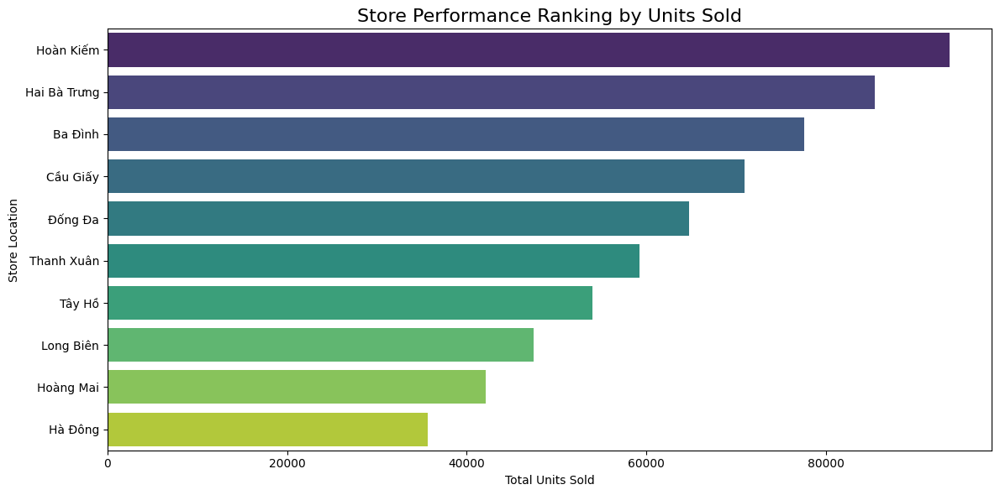

In [14]:
# Read data file
df = pd.read_csv('final_dataset.csv')

# Calculate total quantity sold per store (using Store_Location)
store_performance = df.groupby('Store_Location')['Quantity_Sold'].sum().sort_values(ascending=False)

# Plot ranking chart
plt.figure(figsize=(12, 6))
sns.barplot(
    x=store_performance.values,
    y=store_performance.index,
    palette='viridis'
)
plt.title('Store Performance Ranking by Units Sold', fontsize=16)
plt.xlabel('Total Units Sold')
plt.ylabel('Store Location')
plt.tight_layout()
plt.show()

    1.2. Monthly Revenue

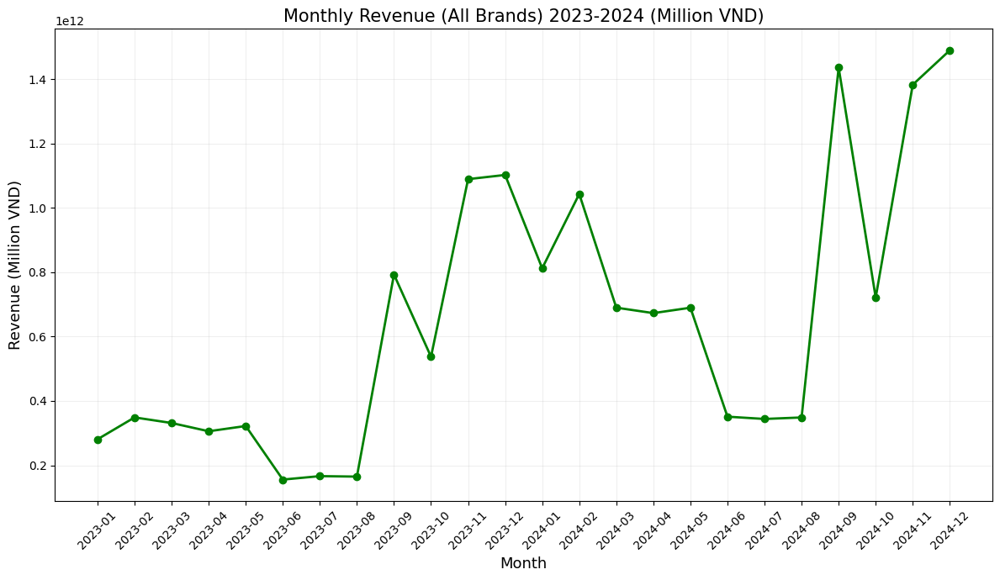

In [15]:
# Convert 'Date' column to datetime, if necessary
df['Date'] = pd.to_datetime(df['Date'])

# Create 'YearMonth' column
df['YearMonth'] = df['Date'].dt.to_period('M').astype(str)

# Calculate total monthly revenue
monthly_revenue = df.groupby('YearMonth')['Revenue'].sum().reset_index()

# Plot the line chart
plt.figure(figsize=(12, 7))
plt.plot(
    monthly_revenue['YearMonth'],
    monthly_revenue['Revenue'],
    marker='o',
    color='green',
    linewidth=2
)
plt.title('Monthly Revenue (All Brands) 2023-2024 (Million VND)', fontsize=15)
plt.xlabel('Month', fontsize=13)
plt.ylabel('Revenue (Million VND)', fontsize=13)
plt.xticks(rotation=45)
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

    1.3. Total Units Sold by Month

In [ ]:
monthly = df.groupby(['Year', 'Month'])['Quantity_Sold'].sum().reset_index()
monthly['YearMonth'] = monthly['Year'].astype(str) + '-' + monthly['Month'].astype(str).str.zfill(2)
plt.figure(figsize=(14, 5))
sns.lineplot(data=monthly, x='YearMonth', y='Quantity_Sold', marker='o', color='#0057B8')
plt.title('Total Units Sold by Month')
plt.ylabel('Units Sold')
plt.xlabel('Month')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


    1.4. Quantity Sold by Branch for each store

In [ ]:
# 1. Aggregate total Quantity_Sold by Store_ID and Brand
brand_store = (
    df_transaction
    .groupby(['Store_ID', 'Brand'])['Quantity_Sold']
    .sum()
    .unstack(fill_value=0)       # get one column per brand
    .loc[df_transaction['Store_ID'].unique()]  # preserve original store order if needed
)

# 2. Plot grouped bar chart
ax = brand_store.plot(
    kind='bar',
    figsize=(12, 6),
    width=0.8
)

# 3. Formatting
ax.set_xlabel('Store ID')
ax.set_ylabel('Quantity Sold')
ax.set_title('Quantity Sold by Brand for Each Store')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Brand')
plt.tight_layout()
plt.show()


    1.5. Total Units Sold of Apple vs Samsung by Year

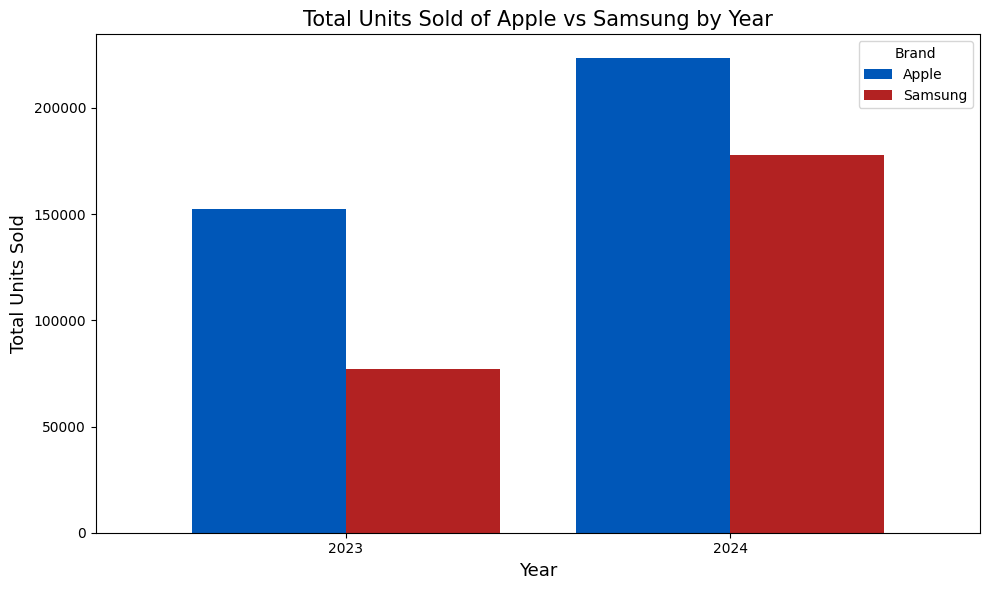

In [17]:
# Aggregate Quantity_Sold by Brand and Year
brand_year = df.groupby(['Year', 'Brand'])['Quantity_Sold'].sum().reset_index()

# Pivot for stacked or grouped bar chart
brand_year_pivot = brand_year.pivot(index='Year', columns='Brand', values='Quantity_Sold').fillna(0)

# Plot grouped bar chart
brand_year_pivot.plot(
    kind='bar',
    figsize=(10, 6),
    width=0.8,
    color=['#0057B8', '#B22222']  # Samsung - Blue, Apple - Red
)
plt.title('Total Units Sold of Apple vs Samsung by Year', fontsize=15)
plt.xlabel('Year', fontsize=13)
plt.ylabel('Total Units Sold', fontsize=13)
plt.xticks(rotation=0)
plt.legend(title='Brand')
plt.tight_layout()
plt.show()

    1.6. Monthly Units Sold Trend by Performance Tier

/tmp/ipython-input-18-3731180144.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  monthly_tier_trend = df.groupby(['YearMonth', 'Performance_Tier'])['Quantity_Sold'].sum().reset_index()


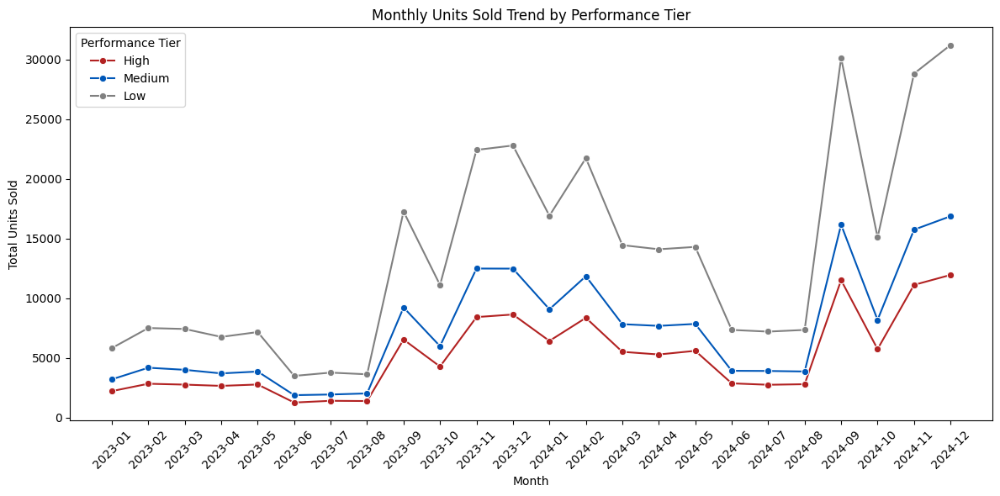

In [18]:
# Calculate total units sold for each store across the entire dataset
store_perf = df.groupby('Store_Location')['Quantity_Sold'].sum().sort_values(ascending=False)

# Rank performance into tiers (top 1/3: High, middle 1/3: Medium, bottom 1/3: Low)
tier_labels = ['High', 'Medium', 'Low']
store_perf_tier = pd.qcut(store_perf, q=3, labels=tier_labels)

# Map these tiers back to each row in the main DataFrame
df['Performance_Tier'] = df['Store_Location'].map(store_perf_tier)

# Convert date if not already done (be mindful of potential errors)
df['Date'] = pd.to_datetime(df['Date'])
df['YearMonth'] = df['Date'].dt.to_period('M')

# Group by YearMonth & Tier, then calculate total units sold
monthly_tier_trend = df.groupby(['YearMonth', 'Performance_Tier'])['Quantity_Sold'].sum().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(
    data=monthly_tier_trend,
    x=monthly_tier_trend['YearMonth'].astype(str), # Convert YearMonth to string
    y='Quantity_Sold',
    hue='Performance_Tier',
    marker='o',
    palette=['#B22222', '#0057B8', '#808080']  # High-Red, Medium-Blue, Low-Gray
)
plt.title('Monthly Units Sold Trend by Performance Tier')
plt.xlabel('Month')
plt.ylabel('Total Units Sold')
plt.xticks(rotation=45)
plt.legend(title='Performance Tier')
plt.tight_layout()
plt.show()

    1.7. Total Quantity Sold by Location Tier

  Location_Tier  Total_Quantity_Sold  Avg_Quantity_Sold
0       Central               321519          12.132335
1  Near_Central               184143           9.312851
2      Suburban               125190           6.453093


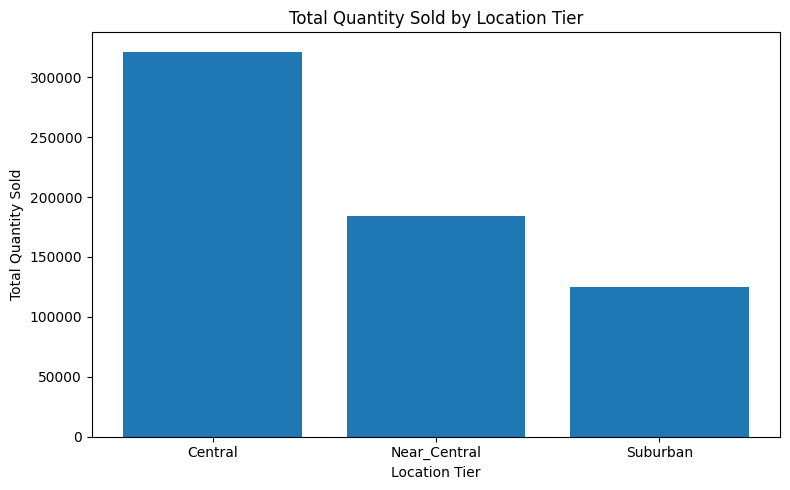

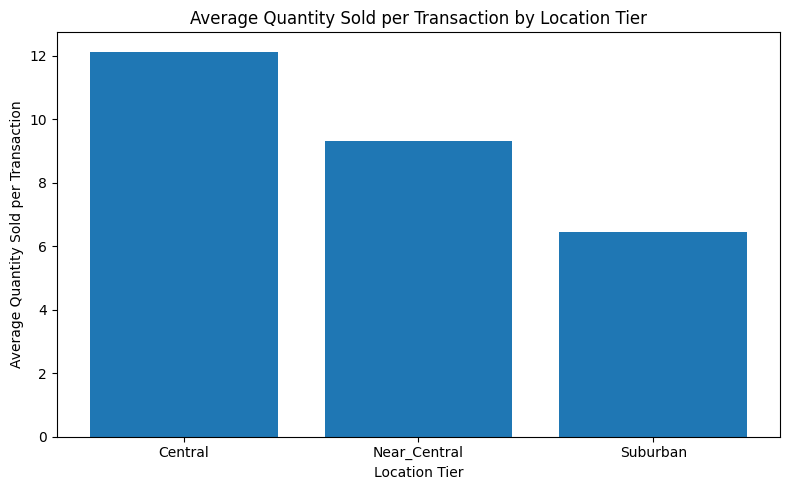

In [19]:
# 1. Define location tiers
central       = ['Hoàn Kiếm', 'Đống Đa', 'Hai Bà Trưng', 'Ba Đình']
near_central  = ['Cầu Giấy', 'Thanh Xuân', 'Tây Hồ']
suburban      = ['Long Biên', 'Hoàng Mai', 'Hà Đông']

# 2. Map each store to its tier
tier_map = {loc: 'Central' for loc in central}
tier_map.update({loc: 'Near_Central' for loc in near_central})
tier_map.update({loc: 'Suburban' for loc in suburban})

df_transaction['Location_Tier'] = df_transaction['Store_Location'].map(tier_map).fillna('Other')

# 3. Aggregate Quantity_Sold by Location_Tier
tier_summary = (
    df_transaction
    .groupby('Location_Tier')
    .agg(Total_Quantity_Sold=('Quantity_Sold', 'sum'),
         Avg_Quantity_Sold=('Quantity_Sold', 'mean'))
    .reset_index()
)

# Display the summary table
print(tier_summary)

# 4. Plot Total Quantity Sold by Location Tier
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 5))
plt.bar(tier_summary['Location_Tier'], tier_summary['Total_Quantity_Sold'])
plt.ylabel('Total Quantity Sold')
plt.xlabel('Location Tier')
plt.title('Total Quantity Sold by Location Tier')
plt.tight_layout()
plt.show()

# 5. Plot Average Quantity Sold by Location Tier
plt.figure(figsize=(8, 5))
plt.bar(tier_summary['Location_Tier'], tier_summary['Avg_Quantity_Sold'])
plt.ylabel('Average Quantity Sold per Transaction')
plt.xlabel('Location Tier')
plt.title('Average Quantity Sold per Transaction by Location Tier')
plt.tight_layout()
plt.show()


    1.8. Performance Tier Distribution by Location Tier

Spearman ρ between Performance and Location tiers: 0.83
Performance_Tier  Low    Medium      High
Location_Tier                            
Central           0.0  0.248896  0.751104
Near_Central      0.0  0.665402  0.334598
Suburban          1.0  0.000000  0.000000


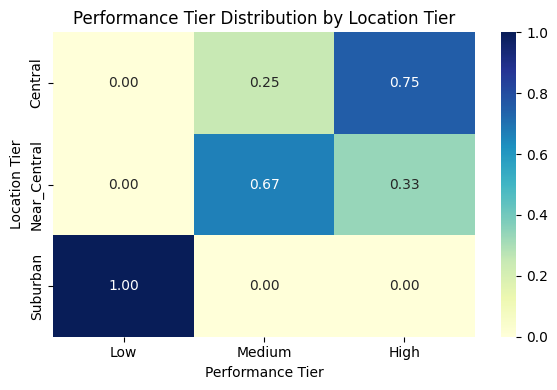

In [20]:
# 1. Compute each store’s total units sold
store_perf = df.groupby('Store_Location')['Quantity_Sold'] \
                           .sum() \
                           .sort_values(ascending=False)

# 2. Correctly bucket into Low/Medium/High
tier_labels     = ['Low','Medium','High']
store_perf_tier = pd.qcut(store_perf, q=3, labels=tier_labels)

# 3. Map back onto your full DataFrame
df['Performance_Tier'] = df['Store_Location'].map(store_perf_tier)

# 4. (Re)create Location_Tier if you haven’t already
loc_map = {**{loc:'Central'      for loc in central},
           **{loc:'Near_Central' for loc in near_central},
           **{loc:'Suburban'     for loc in suburban}}
df['Location_Tier'] = df['Store_Location'].map(loc_map)

# 5. Encode as numeric for Spearman
perf_map = {'Low':0,'Medium':1,'High':2}
loc_map_num = {'Suburban':0,'Near_Central':1,'Central':2}
df['Perf_Code'] = df['Performance_Tier'].map(perf_map)
df['Loc_Code']  = df['Location_Tier'].map(loc_map_num)

# 6. Spearman correlation
rho = df[['Perf_Code','Loc_Code']].corr(method='spearman').iloc[0,1]
print(f"Spearman ρ between Performance and Location tiers: {rho:.2f}")

# 7. Crosstab and heatmap
ct = pd.crosstab(df['Location_Tier'],
                 df['Performance_Tier'],
                 normalize='index')

print(ct)
plt.figure(figsize=(6,4))
sns.heatmap(ct, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Performance Tier Distribution by Location Tier")
plt.ylabel("Location Tier")
plt.xlabel("Performance Tier")
plt.tight_layout()
plt.show()

    2. Promotion Impact Analysis

    2.1. Promotion Activity Throughout the Year

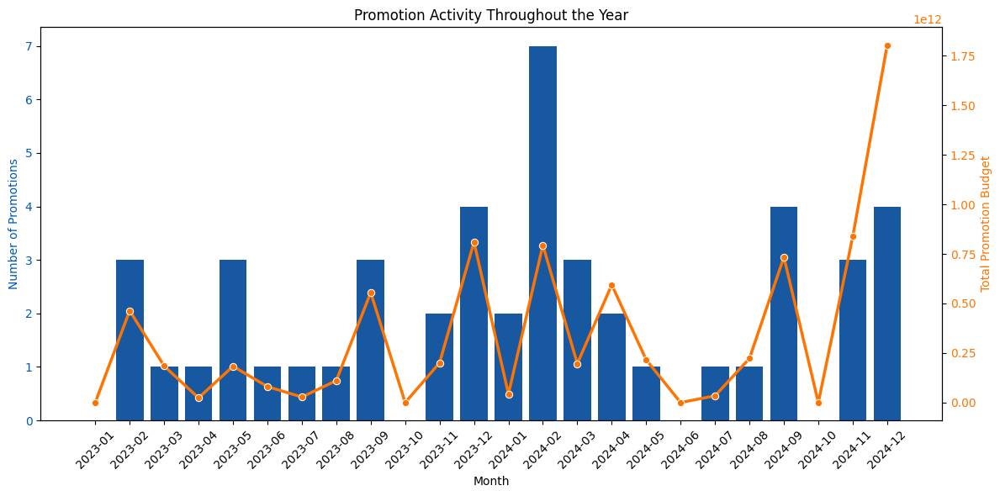

In [22]:
# Group by YearMonth to get the number of unique promotions and total budget
monthly_promo = df.groupby('YearMonth').agg(
    # Count unique Promo_ID, excluding 'No Promo' if it exists
    num_promotion=('Promo_ID', lambda x: x[x != 'No Promo'].nunique()),
    # Sum the total promotion budget
    total_budget=('Promo_Budget', 'sum')
).reset_index()

# Convert YearMonth to string for plotting on the x-axis
monthly_promo['YearMonth'] = monthly_promo['YearMonth'].astype(str)

# --- Your Plotting Code ---
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar for Number of Promotions (Dark Blue)
sns.barplot(
    x=monthly_promo['YearMonth'],
    y=monthly_promo['num_promotion'],
    color='#0057B8',  # Dark blue
    ax=ax1
)
ax1.set_xlabel('Month')
ax1.set_ylabel('Number of Promotions', color='#0057B8')
ax1.tick_params(axis='y', labelcolor='#0057B8')
plt.xticks(rotation=45)

# Line for Total Promotion Budget (Dark Orange)
ax2 = ax1.twinx()
sns.lineplot(
    x=monthly_promo['YearMonth'],
    y=monthly_promo['total_budget'],
    color='#FF7300',  # Dark orange
    marker='o',
    linewidth=2.5,
    ax=ax2
)
ax2.set_ylabel('Total Promotion Budget', color='#FF7300')
ax2.tick_params(axis='y', labelcolor='#FF7300')

plt.title('Promotion Activity Throughout the Year')
plt.tight_layout()
plt.show()

    2.2. Promotion Type Frequency by Brand

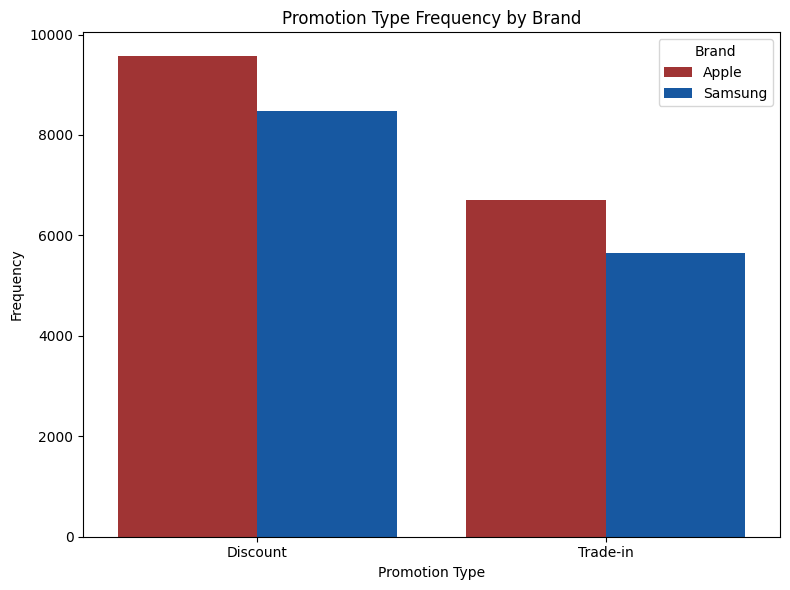

In [23]:
# Mapping code sang tên promotion (giả sử 1=Discount, 2=Trade-in)
promo_map = {1: 'Discount', 2: 'Trade-in'}
df['Promo_Type'] = df['Promo_Type_Code'].map(promo_map)

# Chỉ lấy những dòng có promotion (bỏ 0 và NaN)
promo_df = df[df['Promo_Type_Code'].isin([1,2])].copy()

# Đếm tần suất từng loại promotion theo từng brand
promo_brand_counts = promo_df.groupby(['Brand', 'Promo_Type']).size().reset_index(name='Count')

# Vẽ barplot
plt.figure(figsize=(8, 6))
sns.barplot(
    data=promo_brand_counts,
    x='Promo_Type', y='Count', hue='Brand',
    palette=['#B22222', '#0057B8']  # Apple - đỏ, Samsung - xanh
)
plt.title('Promotion Type Frequency by Brand')
plt.xlabel('Promotion Type')
plt.ylabel('Frequency')
plt.legend(title='Brand')
plt.tight_layout()
plt.show()


    2.3. Correlation: Monthly Promo Budget vs Unit Solds

Pearson’s r = 0.77
Average units sold when promotion: 27752.35
Average units sold when no promotion: 18951.25
T-test: t = 1.57, p-value = 0.1462
=> No statistically significant difference found between the two groups.


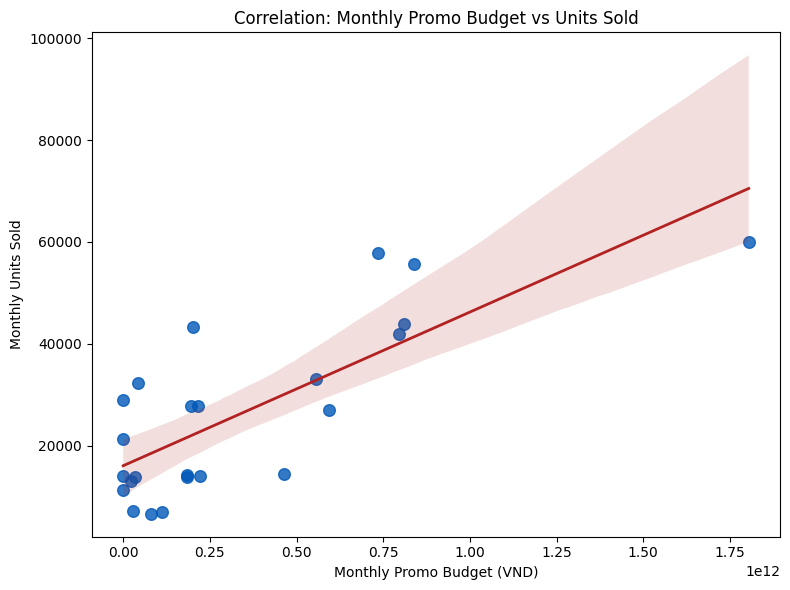

In [26]:
# 1. Ensure Date is datetime and extract YearMonth
df['Date'] = pd.to_datetime(df['Date'])
df['YearMonth'] = df['Date'].dt.to_period('M')

# 2. Monthly total units sold (all months)
monthly_all = (
    df
    .groupby('YearMonth')
    ['Quantity_Sold']
    .sum()
    .rename('monthly_units_sold')
)

# 3. Monthly promo budget (only months with promos)
monthly_budget = (
    df
    .groupby('YearMonth')
    ['Promo_Budget']
    .sum()
    .rename('monthly_promo_budget')
)

# 4. Combine into one DataFrame
monthly = (
    pd.concat([monthly_all, monthly_budget], axis=1)
      .fillna(0)  # months with no promos get budget = 0
      .reset_index()
)

# 5. Pearson’s r between monthly budget and units sold
r, _ = pearsonr(monthly['monthly_promo_budget'], monthly['monthly_units_sold'])
print(f"Pearson’s r = {r:.2f}")

# 6. Compute group means for months with vs. without any promo
with_promo    = monthly.loc[monthly['monthly_promo_budget'] > 0, 'monthly_units_sold']
without_promo = monthly.loc[monthly['monthly_promo_budget'] == 0, 'monthly_units_sold']
mean_with     = with_promo.mean()
mean_without  = without_promo.mean()
print(f"Average units sold when promotion: {mean_with:.2f}")
print(f"Average units sold when no promotion: {mean_without:.2f}")

# 7. Welch’s t-test
t_stat, p_value = ttest_ind(with_promo, without_promo, equal_var=False)
print(f"T-test: t = {t_stat:.2f}, p-value = {p_value:.4f}")
if p_value < 0.05:
    print("=> There is a statistically significant difference between the two groups.")
else:
    print("=> No statistically significant difference found between the two groups.")

# 8. Scatter plot with regression line
plt.figure(figsize=(8, 6))
sns.regplot(
    data=monthly,
    x='monthly_promo_budget',
    y='monthly_units_sold',
    scatter_kws={'s': 70, 'color': '#0057B8'},
    line_kws={'color': '#B22222', 'lw': 2}
)
plt.title('Correlation: Monthly Promo Budget vs Units Sold')
plt.xlabel('Monthly Promo Budget (VND)')
plt.ylabel('Monthly Units Sold')
plt.tight_layout()
plt.show()


    2.4.Correlation Heatmap

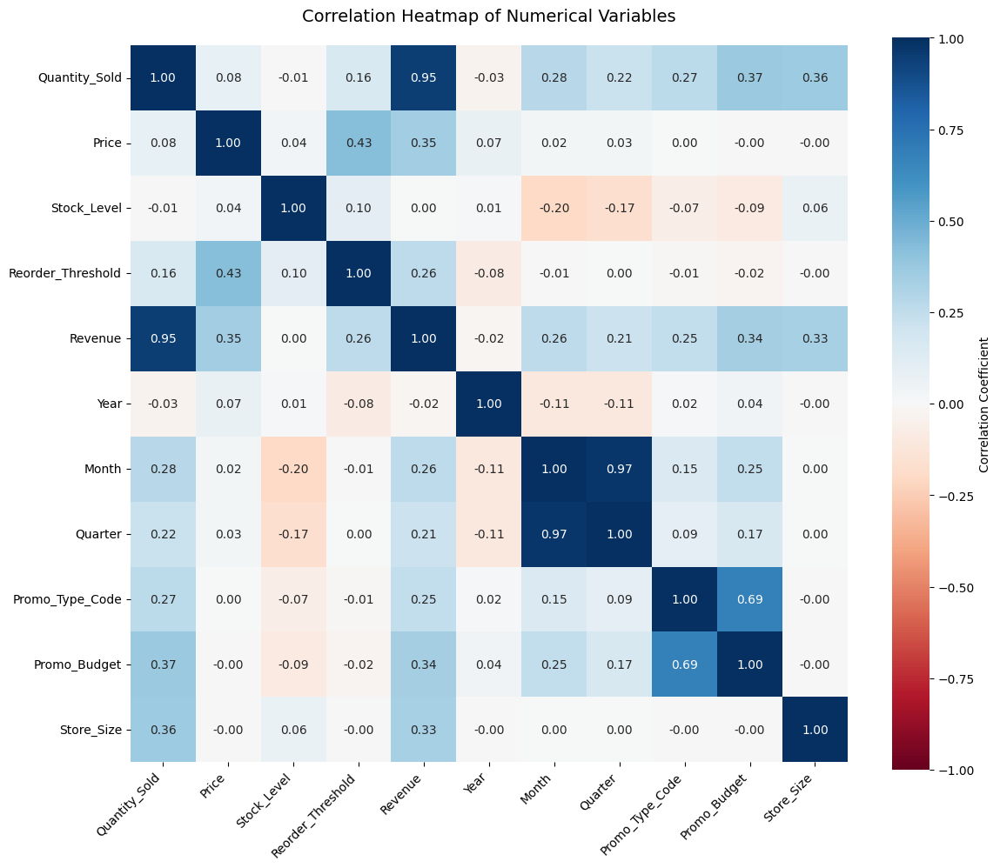

In [27]:
df = df_final.copy()
# Recompute Revenue as Quantity_Sold * Price for consistency
df['Revenue'] = df['Quantity_Sold'] * df['Price']
# Select numerical columns
numerical_columns = [
    'Quantity_Sold', 'Price', 'Stock_Level', 'Reorder_Threshold',
    'Revenue', 'Year', 'Month', 'Quarter', 'Promo_Type_Code',
    'Promo_Budget', 'Store_Size'
]
df_numeric = df[numerical_columns].copy()

# Handle missing or invalid values
df_numeric = df_numeric.dropna()
# Convert columns to numeric, coercing errors to NaN
for col in df_numeric.columns:
    df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')
df_numeric = df_numeric.dropna()

# Compute the correlation matrix
corr_matrix = df_numeric.corr(method='pearson')

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,  # Show correlation values
    cmap='RdBu',  # Diverging color scheme (red for negative, blue for positive)
    vmin=-1, vmax=1,  # Correlation range
    center=0,  # Center the colormap at 0
    square=True,  # Make cells square
    fmt='.2f',  # Format annotations to 2 decimal places
    annot_kws={'size': 10},  # Font size for annotations
    cbar_kws={'label': 'Correlation Coefficient'},  # Colorbar label
)
plt.title('Correlation Heatmap of Numerical Variables', fontsize=14, pad=20)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

# Save the heatmap
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

#**III. Model Evaluation**

In [32]:
import os

# Convert 'Date' column to datetime if not already done
df['Date'] = pd.to_datetime(df['Date'])

# Get all unique product names
unique_product_names = df['Product_Name'].unique()

# --- Create a directory to save the product-specific files ---
output_directory = 'product_data_files'
os.makedirs(output_directory, exist_ok=True) # Creates the directory if it doesn't exist

print(f"Saving data for {len(unique_product_names)} unique products into '{output_directory}' directory...")

# Loop through each unique product name
for product_name in unique_product_names:
    safe_product_name = "".join([c for c in product_name if c.isalnum() or c in [' ', '_', '-']]).strip()
    safe_product_name = safe_product_name.replace(' ', '_')

    # Create a sub-DataFrame for the current product
    product_df = df[df['Product_Name'] == product_name].copy()

    # Sort the data by date (good practice for time-series data)
    product_df.sort_values(by='Date', inplace=True)

    # Define the output file path
    file_path = os.path.join(output_directory, f"{safe_product_name}.csv")

    # Save the product_df to a CSV file
    product_df.to_csv(file_path, index=False)

    print(f"  Saved data for '{product_name}' to '{file_path}' ({len(product_df)} rows)")

print("\n--- All product data saved to separate files. ---")
print(f"You can find your files in the '{output_directory}' directory.")

Saving data for 12 unique products into 'product_data_files' directory...
  Saved data for 'iPhone 14 Pro Max' to 'product_data_files/iPhone_14_Pro_Max.csv' (7246 rows)
  Saved data for 'iPhone 14 Pro' to 'product_data_files/iPhone_14_Pro.csv' (7229 rows)
  Saved data for 'iPhone 14' to 'product_data_files/iPhone_14.csv' (7244 rows)
  Saved data for 'Samsung S23 Ultra' to 'product_data_files/Samsung_S23_Ultra.csv' (6721 rows)
  Saved data for 'Samsung S23 Pro' to 'product_data_files/Samsung_S23_Pro.csv' (6718 rows)
  Saved data for 'Samsung S23' to 'product_data_files/Samsung_S23.csv' (6705 rows)
  Saved data for 'iPhone 15 Pro Max' to 'product_data_files/iPhone_15_Pro_Max.csv' (4632 rows)
  Saved data for 'iPhone 15 Pro' to 'product_data_files/iPhone_15_Pro.csv' (4638 rows)
  Saved data for 'iPhone 15' to 'product_data_files/iPhone_15.csv' (4630 rows)
  Saved data for 'Samsung S24 Ultra' to 'product_data_files/Samsung_S24_Ultra.csv' (3305 rows)
  Saved data for 'Samsung S24 Pro' to 'p

**1. Linear Regression**

    1.1. Data Preparation

In [47]:
# Hàm tính MAPE (Mean Absolute Percentage Error)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_true = y_true != 0
    if not np.any(non_zero_true):
        return float('inf')
    return np.mean(np.abs((y_true[non_zero_true] - y_pred[non_zero_true]) / y_true[non_zero_true])) * 100

# --- Tải dữ liệu chính ---
print("Loading final_dataset.csv...")
df_final = pd.read_csv('final_dataset.csv')
df_final['Date'] = pd.to_datetime(df_final['Date']) # Đảm bảo cột Date là datetime

# --- Chọn MỘT sản phẩm để chạy pipeline ---
# Lấy sản phẩm đầu tiên trong danh sách (bạn có thể thay đổi để chọn sản phẩm khác)
product_to_analyze = df_final['Product_Name'].unique()[0]
print(f"--- Running pipeline for a single product: '{product_to_analyze}' ---")


Loading final_dataset.csv...
--- Running pipeline for a single product: 'iPhone 14 Pro Max' ---


In [89]:
df = df_final[df_final['Product_Name'] == product_to_analyze].copy()

print("\n--- 1.1. Data Preparation ---")

df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date').set_index('Date')

daily = df.resample('D').agg({
    'Quantity_Sold':'sum',
    'Price':'mean',
    'Stock_Level':'sum',
    'Reorder_Threshold':'mean',
    'Promo_Budget':'sum',
    'Store_Size':'mean',
    'Promo_Type_Code':'mean'
}).rename(columns={
    'Price':'Avg_Price',
    'Stock_Level':'Total_Stock',
    'Reorder_Threshold':'Avg_Reorder_Threshold',
    'Promo_Budget':'Total_Budget',
    'Store_Size':'Avg_Store_Size',
    'Promo_Type_Code':'Avg_Promo_Code'
}).copy()

daily.fillna({
    'Quantity_Sold': 0,
    'Total_Stock': 0,
    'Total_Budget': 0
}, inplace=True)

for col in ['Avg_Price','Avg_Reorder_Threshold','Avg_Store_Size','Avg_Promo_Code']:
    daily[col].fillna(method='ffill', inplace=True)
    daily[col].fillna(0, inplace=True) # Để xử lý các NaN ở đầu nếu ffill không có dữ liệu trước đó

print("Data Preparation Complete.")
print("Daily aggregated data head:")
print(daily.head())


--- 1.1. Data Preparation ---
Data Preparation Complete.
Daily aggregated data head:
            Quantity_Sold  Avg_Price  Total_Stock  Avg_Reorder_Threshold  \
Date                                                                       
2023-01-01            124      29.99          161                   10.0   
2023-01-02            121      29.99          191                   10.0   
2023-01-03            114      29.99          153                   10.0   
2023-01-04            139      29.99          200                   10.0   
2023-01-05            117      29.99          168                   10.0   

            Total_Budget  Avg_Store_Size  Avg_Promo_Code  
Date                                                      
2023-01-01             0           158.0             0.0  
2023-01-02             0           158.0             0.0  
2023-01-03             0           158.0             0.0  
2023-01-04             0           158.0             0.0  
2023-01-05             0   

/tmp/ipython-input-89-3514218966.py:32: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-89-3514218966.py:32: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-89-3514218966.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

    1.2. Feature Engineering for Modeling

In [90]:
print("\n--- 1.2. Feature Engineering for Modeling ---")

daily['t'] = np.arange(len(daily))

for p in [7,14,30,90,365]:
    daily[f'sin{p}'] = np.sin(2*np.pi*daily['t']/p)
    daily[f'cos{p}'] = np.cos(2*np.pi*daily['t']/p)

for lag in [1,2,3,7,14,30]:
    daily[f'lag_{lag}'] = daily['Quantity_Sold'].shift(lag).fillna(0)

for w in [3,7,14,30]:
    daily[f'roll_{w}'] = daily['Quantity_Sold'].shift(1).rolling(w).mean().fillna(0)

daily['dow'] = daily.index.dayofweek
daily['month'] = daily.index.month

daily = pd.concat([
    daily,
    pd.get_dummies(daily['dow'], prefix='dow'),
    pd.get_dummies(daily['month'], prefix='mon')
], axis=1).copy()

print("Feature Engineering Complete.")
print("Daily data with new features head:")
print(daily.head())


--- 1.2. Feature Engineering for Modeling ---
Feature Engineering Complete.
Daily data with new features head:
            Quantity_Sold  Avg_Price  Total_Stock  Avg_Reorder_Threshold  \
Date                                                                       
2023-01-01            124      29.99          161                   10.0   
2023-01-02            121      29.99          191                   10.0   
2023-01-03            114      29.99          153                   10.0   
2023-01-04            139      29.99          200                   10.0   
2023-01-05            117      29.99          168                   10.0   

            Total_Budget  Avg_Store_Size  Avg_Promo_Code  t      sin7  \
Date                                                                    
2023-01-01             0           158.0             0.0  0  0.000000   
2023-01-02             0           158.0             0.0  1  0.781831   
2023-01-03             0           158.0             0.0  2  0.

    1.3. Feature Selection and Dataset Splitting

In [91]:
print("\n--- 1.3. Feature Selection and Dataset Splitting ---")

features = ['t'] + \
           [f'sin{p}' for p in [7,14,30,90,365]] + \
           [f'cos{p}' for p in [7,14,30,90,365]] + \
           ['Avg_Price','Total_Stock','Avg_Reorder_Threshold','Total_Budget','Avg_Store_Size','Avg_Promo_Code'] + \
           [f'lag_{l}' for l in [1,2,3,7,14,30]] + \
           [f'roll_{w}' for w in [3,7,14,30]] + \
           [c for c in daily.columns if c.startswith('dow_') or c.startswith('mon_')]

features = [f for f in features if f in daily.columns]

daily.dropna(subset=features + ['Quantity_Sold'], inplace=True)

X = daily[features].copy()
y = daily['Quantity_Sold'].copy()

split = int(len(X)*0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

print(f"Train set size: {len(X_train)} | Test set size: {len(X_test)}")
print("Feature Selection and Dataset Splitting Complete.")


--- 1.3. Feature Selection and Dataset Splitting ---
Train set size: 584 | Test set size: 147
Feature Selection and Dataset Splitting Complete.


    1.4. Data Scaling and Model Training

In [92]:
print("\n--- 1.4. Data Scaling and Model Training ---")

scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_s, y_train)

y_pred = model.predict(X_test_s)

print("Data Scaling and Model Training Complete.")


--- 1.4. Data Scaling and Model Training ---
Data Scaling and Model Training Complete.


    1.5. Performance Evaluation & Visualization


--- 1.5. Performance Evaluation & Visualization ---
Test Set Performance for iPhone 14 Pro Max:
MAE  = 11.88
RMSE = 15.07
MAPE = 10.54%
R2   = 0.926


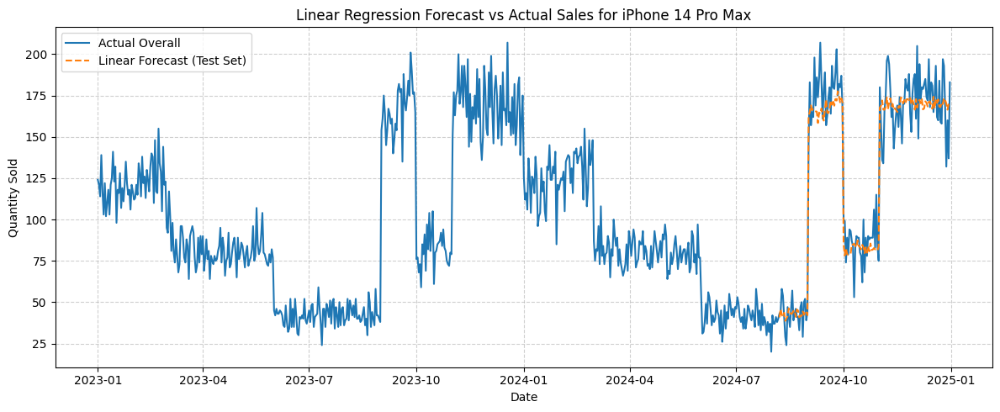

Performance Evaluation & Visualization Complete.


In [93]:
print("\n--- 1.5. Performance Evaluation & Visualization ---")

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test Set Performance for {product_to_analyze}:\n"
      f"MAE  = {mae:.2f}\n"
      f"RMSE = {rmse:.2f}\n"
      f"MAPE = {mape:.2f}%\n"
      f"R2   = {r2:.3f}")

plt.figure(figsize=(12,5))
plt.plot(daily.index, daily['Quantity_Sold'], label='Actual Overall')
plt.plot(daily.index[daily.index.isin(X_test.index)], y_pred, '--', label='Linear Forecast (Test Set)')
plt.title(f'Linear Regression Forecast vs Actual Sales for {product_to_analyze}')
plt.xlabel('Date')
plt.ylabel('Quantity Sold')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

print("Performance Evaluation & Visualization Complete.")

1.6. Model Forecast


--- 1.6. Forecasting Sales for 2025 ---
Đã tạo các đặc trưng cho dự báo năm 2025.
Dữ liệu dự báo đầu tiên:
              t          sin7         sin14         sin30     sin90    sin365  \
2025-01-01  731  4.338837e-01  9.749279e-01  7.431448e-01  0.694658  0.017213   
2025-01-02  732 -4.338837e-01  9.749279e-01  5.877853e-01  0.743145  0.034422   
2025-01-03  733 -9.749279e-01  7.818315e-01  4.067366e-01  0.788011  0.051620   
2025-01-04  734 -7.818315e-01  4.338837e-01  2.079117e-01  0.829038  0.068802   
2025-01-05  735  9.809554e-15 -4.904777e-15  1.665891e-14  0.866025  0.085965   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.900969  0.222521 -0.669131  0.719340  ...  False  False  False   
2025-01-02 -0.900969 -0.222521 -0.809017  0.669131  ...  False  False  False   
2025-01-03 -0.222521 -0.623490 -0.913545  0.615661  ...  False  False  False   
2025-01-04  0.623490 -0.900969 -0.978148  0.559193  ...  False  False  False   
2025-

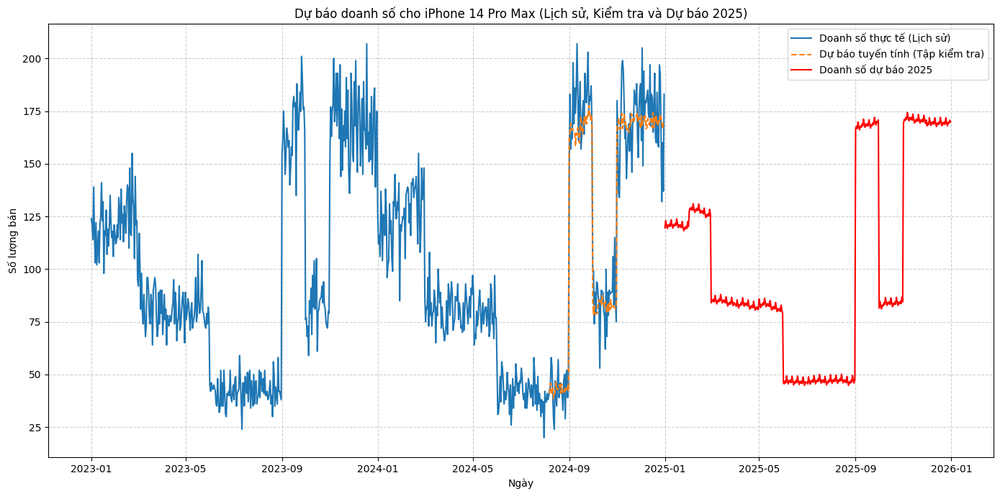

In [103]:
# --- Thêm đoạn code dự báo cho năm 2025 ---
print("\n--- 1.6. Forecasting Sales for 2025 ---")

last_date_in_data = daily.index.max()
forecast_start_date = pd.to_datetime('2025-01-01')
forecast_end_date = pd.to_datetime('2025-12-31')

# Điều chỉnh ngày bắt đầu dự báo nếu dữ liệu đã bao gồm 2025
if last_date_in_data >= forecast_end_date:
    print("Cảnh báo: Dữ liệu hiện có của bạn đã bao gồm hoặc vượt quá năm 2025. "
          "Dự báo sẽ bị trùng lặp hoặc không chính xác cho giai đoạn này.")
elif last_date_in_data.year >= 2025:
    forecast_start_date = last_date_in_data + pd.Timedelta(days=1)
    print(f"Điều chỉnh ngày bắt đầu dự báo thành {forecast_start_date.strftime('%Y-%m-%d')} "
          f"vì dữ liệu đã kéo dài đến năm {last_date_in_data.year}.")

# Tạo dải ngày cho dự báo
forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='D')
forecast_df = pd.DataFrame(index=forecast_dates)

# Điền các giá trị không đổi từ điểm dữ liệu cuối cùng có sẵn trong 'daily'
for col in ['Avg_Price', 'Avg_Reorder_Threshold', 'Avg_Store_Size', 'Avg_Promo_Code']:
    if col in daily.columns:
        forecast_df[col] = daily[col].iloc[-1]
    else:
        forecast_df[col] = 0 # Mặc định là 0 nếu không tìm thấy cột

# Đối với Total_Stock và Total_Budget, giả sử chúng giữ nguyên ở giá trị cuối cùng hoặc 0.
if 'Total_Stock' in daily.columns:
    forecast_df['Total_Stock'] = daily['Total_Stock'].iloc[-1]
else:
    forecast_df['Total_Stock'] = 0

if 'Total_Budget' in daily.columns:
    forecast_df['Total_Budget'] = daily['Total_Budget'].iloc[-1]
else:
    forecast_df['Total_Budget'] = 0

# Tạo 't' cho dữ liệu dự báo, tiếp tục từ giá trị cuối cùng của X
last_t_value = X['t'].max()
forecast_df['t'] = np.arange(last_t_value + 1, last_t_value + 1 + len(forecast_df))

# Tạo các đặc trưng theo chu kỳ
for p in [7,14,30,90,365]:
    forecast_df[f'sin{p}'] = np.sin(2*np.pi*forecast_df['t']/p)
    forecast_df[f'cos{p}'] = np.cos(2*np.pi*forecast_df['t']/p)

# Tạo đặc trưng ngày trong tuần và tháng
forecast_df['dow'] = forecast_df.index.dayofweek
forecast_df['month'] = forecast_df.index.month

# One-hot encode dow và month cho dữ liệu dự báo
dow_dummies_forecast = pd.get_dummies(forecast_df['dow'], prefix='dow')
mon_dummies_forecast = pd.get_dummies(forecast_df['month'], prefix='mon')

# Đảm bảo tất cả các cột từ dữ liệu huấn luyện đều có mặt, điền 0 nếu thiếu
for col in [c for c in X_train.columns if c.startswith('dow_')]:
    if col not in dow_dummies_forecast.columns:
        dow_dummies_forecast[col] = 0
for col in [c for c in X_train.columns if c.startswith('mon_')]:
    if col not in mon_dummies_forecast.columns:
        mon_dummies_forecast[col] = 0

forecast_df = pd.concat([forecast_df, dow_dummies_forecast, mon_dummies_forecast], axis=1).copy()

# Điền các đặc trưng lag và rolling mean từ các giá trị cuối cùng của dữ liệu lịch sử.
for lag in [1,2,3,7,14,30]:
    if f'lag_{lag}' in features:
        if len(daily['Quantity_Sold']) >= lag:
            forecast_df[f'lag_{lag}'] = daily['Quantity_Sold'].iloc[-lag]
        else:
            forecast_df[f'lag_{lag}'] = 0

for w in [3,7,14,30]:
    if f'roll_{w}' in features:
        if len(daily['Quantity_Sold']) >= w + 1:
            forecast_df[f'roll_{w}'] = daily['Quantity_Sold'].rolling(w).mean().iloc[-1]
        else:
            forecast_df[f'roll_{w}'] = 0

X_forecast = forecast_df[features].copy()

print("Đã tạo các đặc trưng cho dự báo năm 2025.")
print("Dữ liệu dự báo đầu tiên:")
print(X_forecast.head())

X_forecast_s = scaler.transform(X_forecast)

y_forecast_2025 = model.predict(X_forecast_s)
# Đảm bảo không có giá trị âm cho dự báo doanh số
y_forecast_2025[y_forecast_2025 < 0] = 0

forecast_results = pd.DataFrame(y_forecast_2025, index=forecast_dates, columns=['Forecasted_Quantity_Sold'])

print("\nĐã hoàn thành dự báo cho năm 2025.")
print(forecast_results.head())

plt.figure(figsize=(14, 7))
plt.plot(daily.index, daily['Quantity_Sold'], label='Doanh số thực tế (Lịch sử)')
plt.plot(daily.index[daily.index.isin(X_test.index)], y_pred, '--', label='Dự báo tuyến tính (Tập kiểm tra)')
plt.plot(forecast_results.index, forecast_results['Forecasted_Quantity_Sold'], 'r-', label='Doanh số dự báo 2025')
plt.title(f'Dự báo doanh số cho {product_to_analyze} (Lịch sử, Kiểm tra và Dự báo 2025)')
plt.xlabel('Ngày')
plt.ylabel('Số lượng bán')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


**DỰ ĐOÁN CHO TẤT CẢ SẢN PHẨM**

Loading final_dataset.csv...

--- Starting Linear Regression modeling for 12 products ---

--- Processing Product: 'iPhone 14 Pro Max' ---
  Test Set Performance for 'iPhone 14 Pro Max':
    MAE  = 11.88
    RMSE = 15.07
    MAPE = 10.54%
    R2   = 0.926


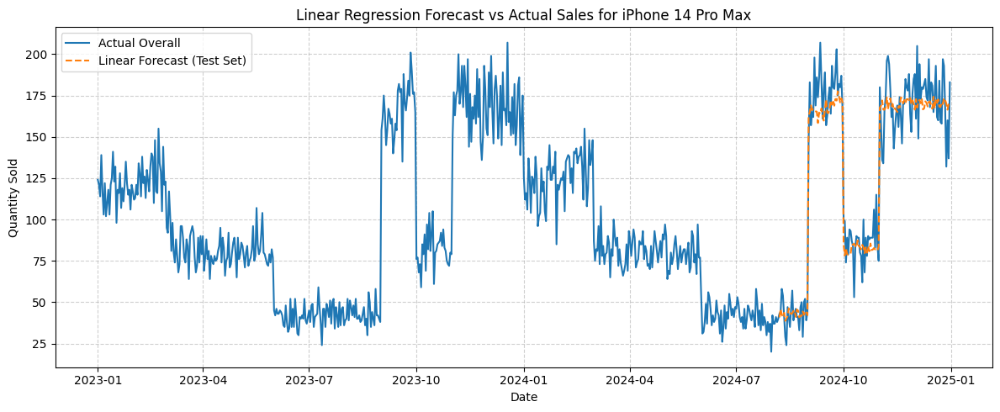

--- 2. Forecasting for 'iPhone 14 Pro Max' (2025) ---
  Features for 'iPhone 14 Pro Max' 2025 forecast created.
  Forecast data head for 'iPhone 14 Pro Max':
              t          sin7         sin14         sin30     sin90    sin365  \
2025-01-01  731  4.338837e-01  9.749279e-01  7.431448e-01  0.694658  0.017213   
2025-01-02  732 -4.338837e-01  9.749279e-01  5.877853e-01  0.743145  0.034422   
2025-01-03  733 -9.749279e-01  7.818315e-01  4.067366e-01  0.788011  0.051620   
2025-01-04  734 -7.818315e-01  4.338837e-01  2.079117e-01  0.829038  0.068802   
2025-01-05  735  9.809554e-15 -4.904777e-15  1.665891e-14  0.866025  0.085965   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.900969  0.222521 -0.669131  0.719340  ...  False  False  False   
2025-01-02 -0.900969 -0.222521 -0.809017  0.669131  ...  False  False  False   
2025-01-03 -0.222521 -0.623490 -0.913545  0.615661  ...  False  False  False   
2025-01-04  0.623490 -0.900969 -0.9

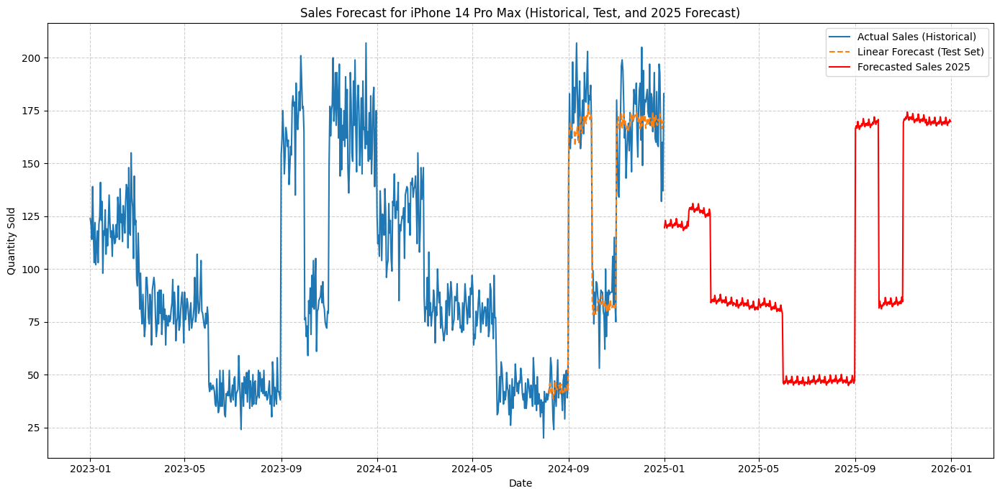

  Forecast Visualization for 'iPhone 14 Pro Max' Complete.

--- Processing Product: 'iPhone 14 Pro' ---
  Test Set Performance for 'iPhone 14 Pro':
    MAE  = 11.59
    RMSE = 14.96
    MAPE = 10.03%
    R2   = 0.926


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

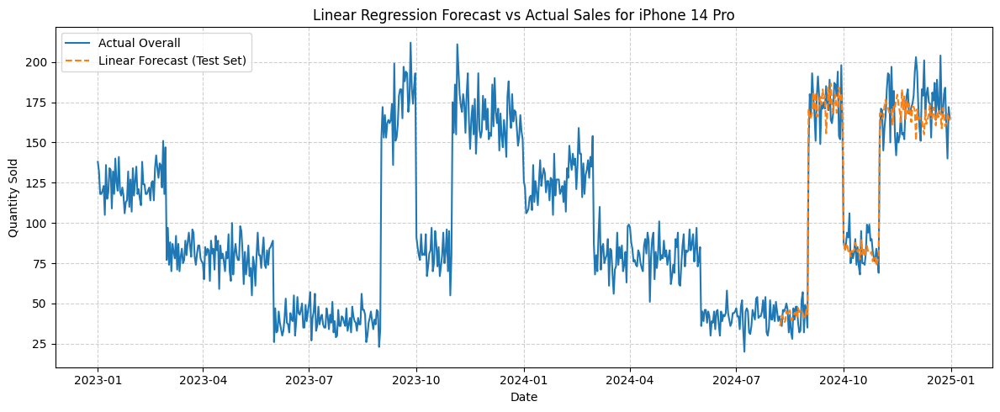

--- 2. Forecasting for 'iPhone 14 Pro' (2025) ---
  Features for 'iPhone 14 Pro' 2025 forecast created.
  Forecast data head for 'iPhone 14 Pro':
              t          sin7         sin14         sin30     sin90    sin365  \
2025-01-01  731  4.338837e-01  9.749279e-01  7.431448e-01  0.694658  0.017213   
2025-01-02  732 -4.338837e-01  9.749279e-01  5.877853e-01  0.743145  0.034422   
2025-01-03  733 -9.749279e-01  7.818315e-01  4.067366e-01  0.788011  0.051620   
2025-01-04  734 -7.818315e-01  4.338837e-01  2.079117e-01  0.829038  0.068802   
2025-01-05  735  9.809554e-15 -4.904777e-15  1.665891e-14  0.866025  0.085965   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.900969  0.222521 -0.669131  0.719340  ...  False  False  False   
2025-01-02 -0.900969 -0.222521 -0.809017  0.669131  ...  False  False  False   
2025-01-03 -0.222521 -0.623490 -0.913545  0.615661  ...  False  False  False   
2025-01-04  0.623490 -0.900969 -0.978148  0.559

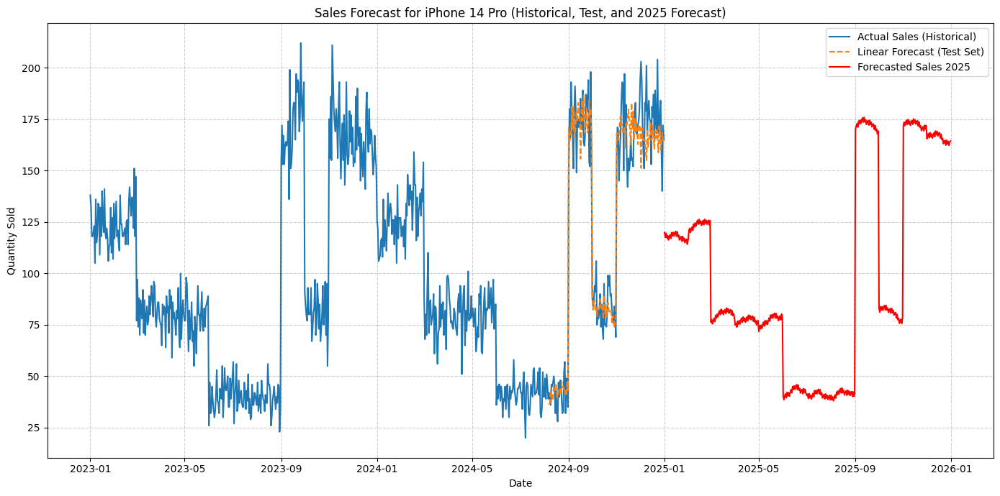

  Forecast Visualization for 'iPhone 14 Pro' Complete.

--- Processing Product: 'iPhone 14' ---


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

  Test Set Performance for 'iPhone 14':
    MAE  = 9.81
    RMSE = 13.20
    MAPE = 8.51%
    R2   = 0.946


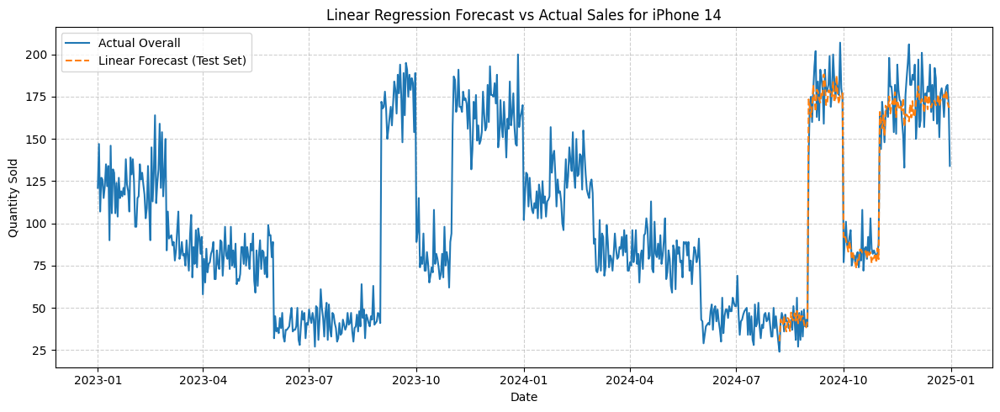

--- 2. Forecasting for 'iPhone 14' (2025) ---
  Features for 'iPhone 14' 2025 forecast created.
  Forecast data head for 'iPhone 14':
              t          sin7         sin14         sin30     sin90    sin365  \
2025-01-01  731  4.338837e-01  9.749279e-01  7.431448e-01  0.694658  0.017213   
2025-01-02  732 -4.338837e-01  9.749279e-01  5.877853e-01  0.743145  0.034422   
2025-01-03  733 -9.749279e-01  7.818315e-01  4.067366e-01  0.788011  0.051620   
2025-01-04  734 -7.818315e-01  4.338837e-01  2.079117e-01  0.829038  0.068802   
2025-01-05  735  9.809554e-15 -4.904777e-15  1.665891e-14  0.866025  0.085965   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.900969  0.222521 -0.669131  0.719340  ...  False  False  False   
2025-01-02 -0.900969 -0.222521 -0.809017  0.669131  ...  False  False  False   
2025-01-03 -0.222521 -0.623490 -0.913545  0.615661  ...  False  False  False   
2025-01-04  0.623490 -0.900969 -0.978148  0.559193  ...  Fa

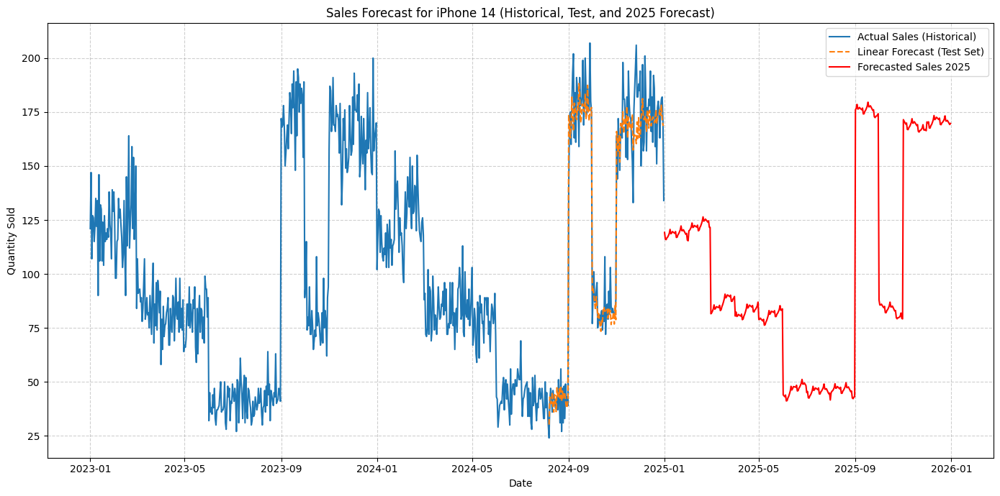

  Forecast Visualization for 'iPhone 14' Complete.

--- Processing Product: 'Samsung S23 Ultra' ---
  Test Set Performance for 'Samsung S23 Ultra':
    MAE  = 9.48
    RMSE = 12.58
    MAPE = 9.17%
    R2   = 0.913


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

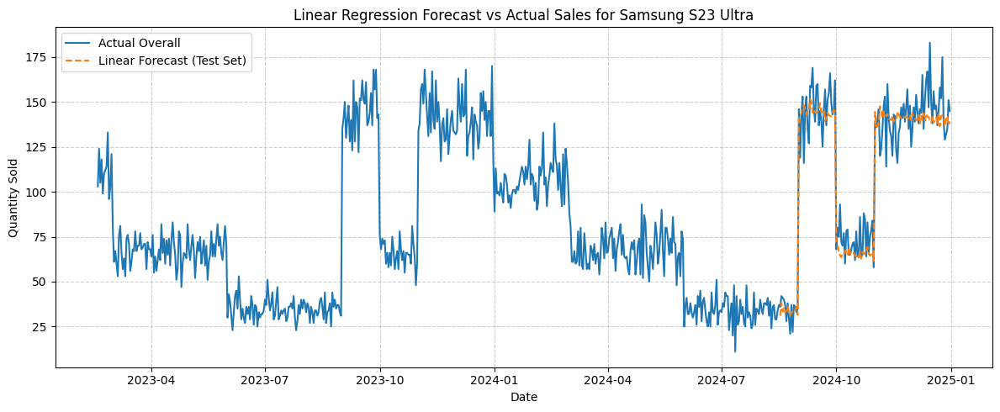

--- 2. Forecasting for 'Samsung S23 Ultra' (2025) ---
  Features for 'Samsung S23 Ultra' 2025 forecast created.
  Forecast data head for 'Samsung S23 Ultra':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  684 -9.749279e-01 -7.818315e-01 -0.951057 -0.587785 -0.711657   
2025-01-02  685 -7.818315e-01 -4.338837e-01 -0.866025 -0.642788 -0.699458   
2025-01-03  686  4.705120e-14  2.352560e-14 -0.743145 -0.694658 -0.687053   
2025-01-04  687  7.818315e-01  4.338837e-01 -0.587785 -0.743145 -0.674444   
2025-01-05  688  9.749279e-01  7.818315e-01 -0.406737 -0.788011 -0.661635   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.222521  0.623490  0.309017 -0.809017  ...  False  False  False   
2025-01-02  0.623490  0.900969  0.500000 -0.766044  ...  False  False  False   
2025-01-03  1.000000  1.000000  0.669131 -0.719340  ...  False  False  False   
2025-01-04  0.623490  0.900969  0.809017 -0.669131  ...  Fa

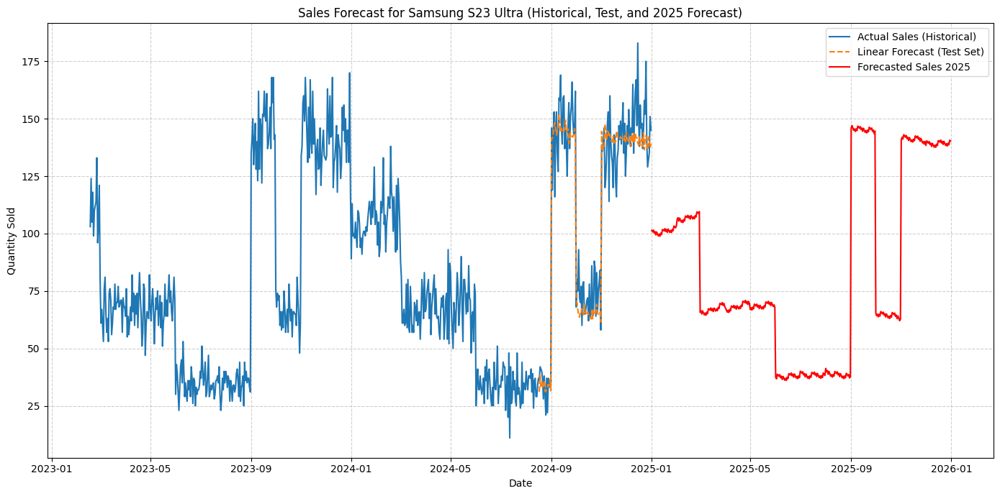

  Forecast Visualization for 'Samsung S23 Ultra' Complete.

--- Processing Product: 'Samsung S23 Pro' ---
  Test Set Performance for 'Samsung S23 Pro':
    MAE  = 9.59
    RMSE = 12.22
    MAPE = 9.59%
    R2   = 0.917


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

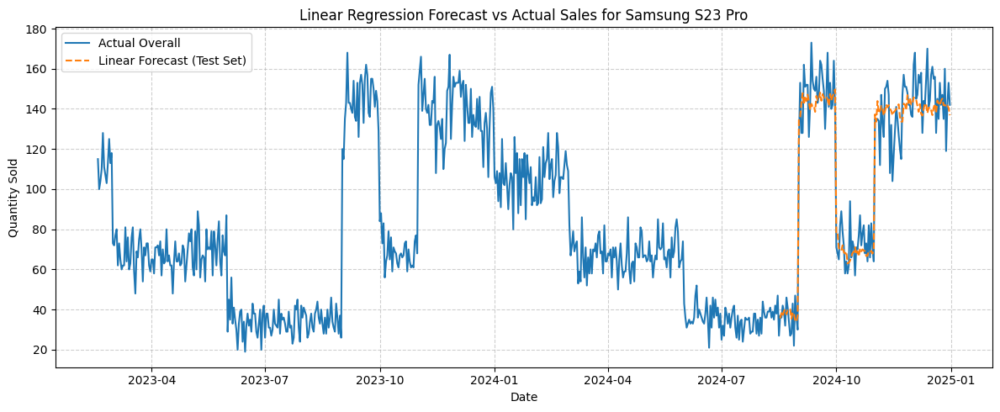

--- 2. Forecasting for 'Samsung S23 Pro' (2025) ---
  Features for 'Samsung S23 Pro' 2025 forecast created.
  Forecast data head for 'Samsung S23 Pro':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  684 -9.749279e-01 -7.818315e-01 -0.951057 -0.587785 -0.711657   
2025-01-02  685 -7.818315e-01 -4.338837e-01 -0.866025 -0.642788 -0.699458   
2025-01-03  686  4.705120e-14  2.352560e-14 -0.743145 -0.694658 -0.687053   
2025-01-04  687  7.818315e-01  4.338837e-01 -0.587785 -0.743145 -0.674444   
2025-01-05  688  9.749279e-01  7.818315e-01 -0.406737 -0.788011 -0.661635   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.222521  0.623490  0.309017 -0.809017  ...  False  False  False   
2025-01-02  0.623490  0.900969  0.500000 -0.766044  ...  False  False  False   
2025-01-03  1.000000  1.000000  0.669131 -0.719340  ...  False  False  False   
2025-01-04  0.623490  0.900969  0.809017 -0.669131  ...  False  F

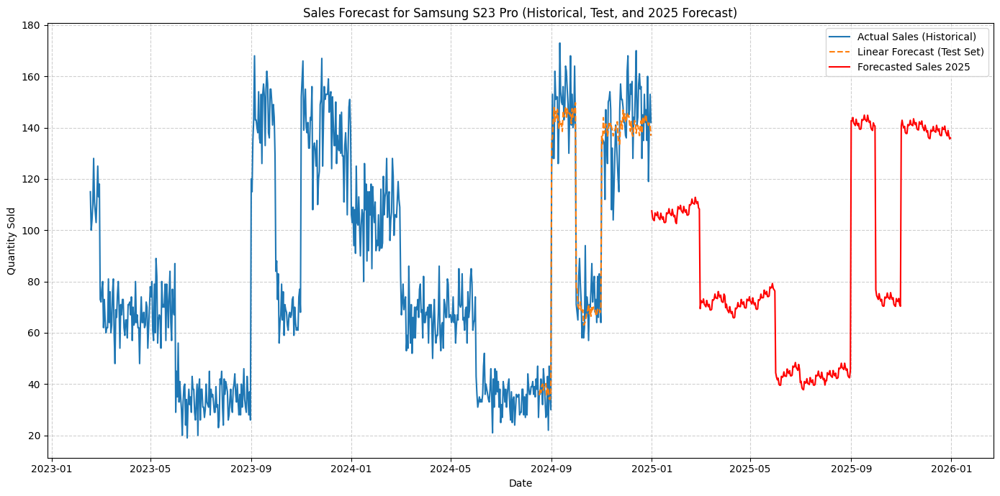

  Forecast Visualization for 'Samsung S23 Pro' Complete.

--- Processing Product: 'Samsung S23' ---
  Test Set Performance for 'Samsung S23':
    MAE  = 10.90
    RMSE = 13.75
    MAPE = 10.02%
    R2   = 0.902


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

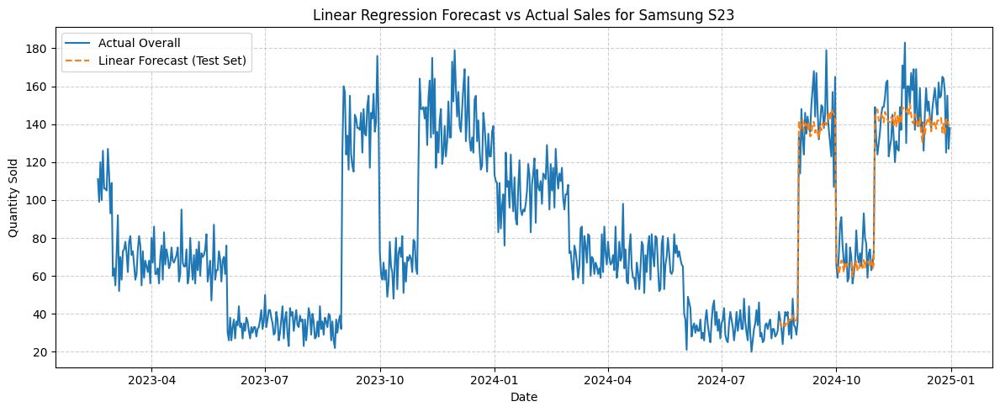

--- 2. Forecasting for 'Samsung S23' (2025) ---
  Features for 'Samsung S23' 2025 forecast created.
  Forecast data head for 'Samsung S23':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  684 -9.749279e-01 -7.818315e-01 -0.951057 -0.587785 -0.711657   
2025-01-02  685 -7.818315e-01 -4.338837e-01 -0.866025 -0.642788 -0.699458   
2025-01-03  686  4.705120e-14  2.352560e-14 -0.743145 -0.694658 -0.687053   
2025-01-04  687  7.818315e-01  4.338837e-01 -0.587785 -0.743145 -0.674444   
2025-01-05  688  9.749279e-01  7.818315e-01 -0.406737 -0.788011 -0.661635   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.222521  0.623490  0.309017 -0.809017  ...  False  False  False   
2025-01-02  0.623490  0.900969  0.500000 -0.766044  ...  False  False  False   
2025-01-03  1.000000  1.000000  0.669131 -0.719340  ...  False  False  False   
2025-01-04  0.623490  0.900969  0.809017 -0.669131  ...  False  False  False 

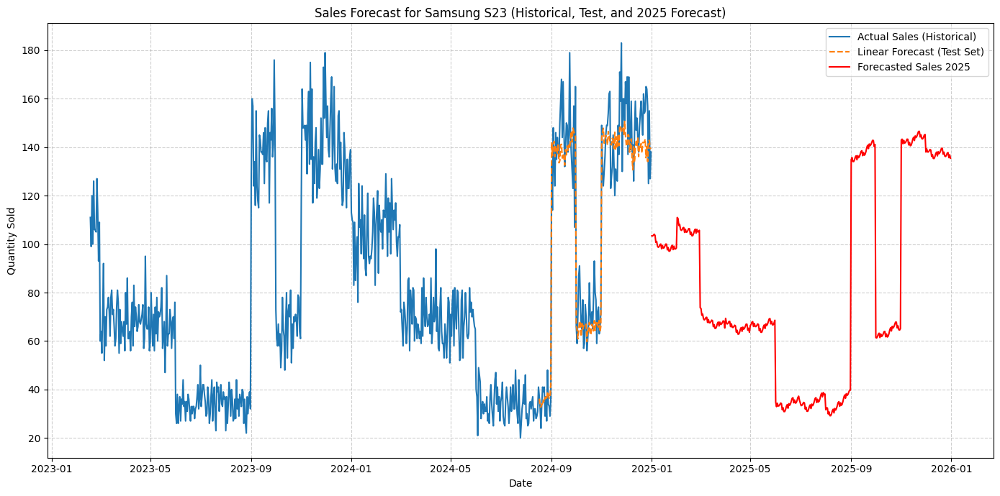

  Forecast Visualization for 'Samsung S23' Complete.

--- Processing Product: 'iPhone 15 Pro Max' ---
  Test Set Performance for 'iPhone 15 Pro Max':
    MAE  = 11.51
    RMSE = 15.11
    MAPE = 8.15%
    R2   = 0.879


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

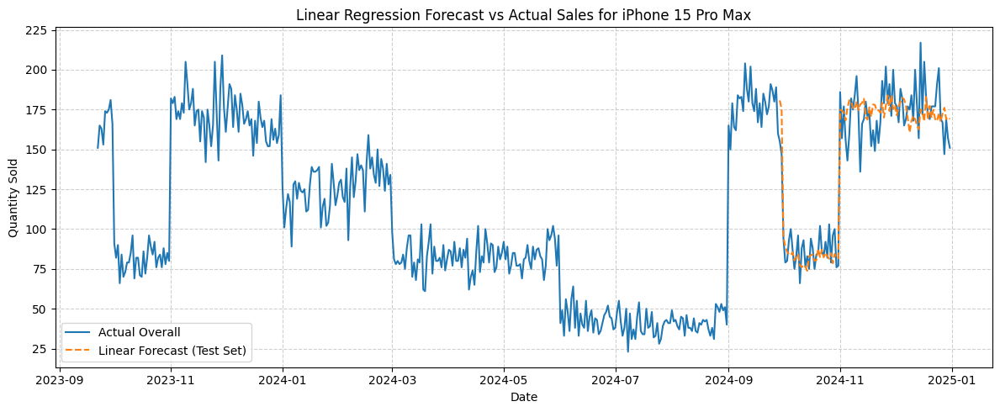

--- 2. Forecasting for 'iPhone 15 Pro Max' (2025) ---
  Features for 'iPhone 15 Pro Max' 2025 forecast created.
  Forecast data head for 'iPhone 15 Pro Max':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  467 -9.749279e-01  7.818315e-01 -0.406737  0.927184  0.982927   
2025-01-02  468 -7.818315e-01  4.338837e-01 -0.587785  0.951057  0.979614   
2025-01-03  469 -2.351569e-14  1.175785e-14 -0.743145  0.970296  0.976011   
2025-01-04  470  7.818315e-01 -4.338837e-01 -0.866025  0.984808  0.972118   
2025-01-05  471  9.749279e-01 -7.818315e-01 -0.951057  0.994522  0.967938   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.222521 -0.623490 -0.913545  0.374607  ...  False  False  False   
2025-01-02  0.623490 -0.900969 -0.809017  0.309017  ...  False  False  False   
2025-01-03  1.000000 -1.000000 -0.669131  0.241922  ...  False  False  False   
2025-01-04  0.623490 -0.900969 -0.500000  0.173648  ...  Fa

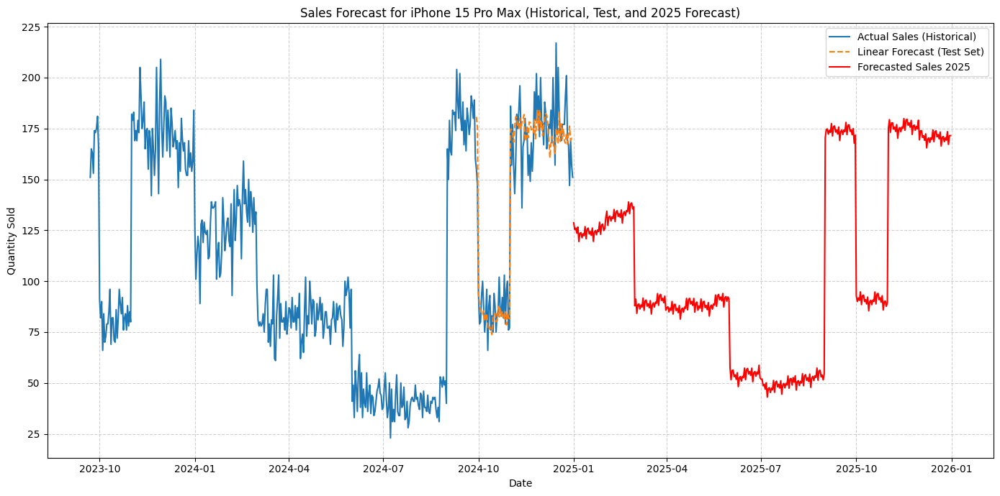

  Forecast Visualization for 'iPhone 15 Pro Max' Complete.

--- Processing Product: 'iPhone 15 Pro' ---
  Test Set Performance for 'iPhone 15 Pro':
    MAE  = 28.60
    RMSE = 31.61
    MAPE = 20.86%
    R2   = 0.469


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

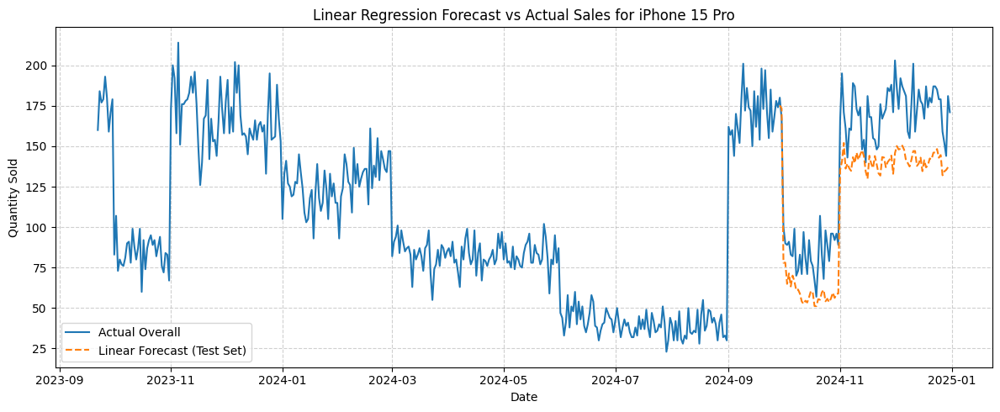

--- 2. Forecasting for 'iPhone 15 Pro' (2025) ---
  Features for 'iPhone 15 Pro' 2025 forecast created.
  Forecast data head for 'iPhone 15 Pro':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  467 -9.749279e-01  7.818315e-01 -0.406737  0.927184  0.982927   
2025-01-02  468 -7.818315e-01  4.338837e-01 -0.587785  0.951057  0.979614   
2025-01-03  469 -2.351569e-14  1.175785e-14 -0.743145  0.970296  0.976011   
2025-01-04  470  7.818315e-01 -4.338837e-01 -0.866025  0.984808  0.972118   
2025-01-05  471  9.749279e-01 -7.818315e-01 -0.951057  0.994522  0.967938   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.222521 -0.623490 -0.913545  0.374607  ...  False  False  False   
2025-01-02  0.623490 -0.900969 -0.809017  0.309017  ...  False  False  False   
2025-01-03  1.000000 -1.000000 -0.669131  0.241922  ...  False  False  False   
2025-01-04  0.623490 -0.900969 -0.500000  0.173648  ...  False  False  

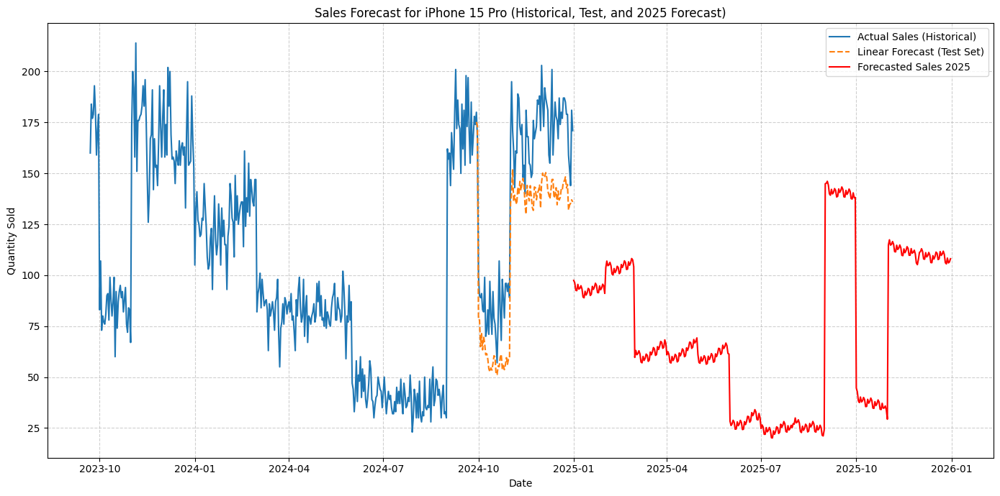

  Forecast Visualization for 'iPhone 15 Pro' Complete.

--- Processing Product: 'iPhone 15' ---
  Test Set Performance for 'iPhone 15':
    MAE  = 24.01
    RMSE = 27.06
    MAPE = 18.61%
    R2   = 0.622


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

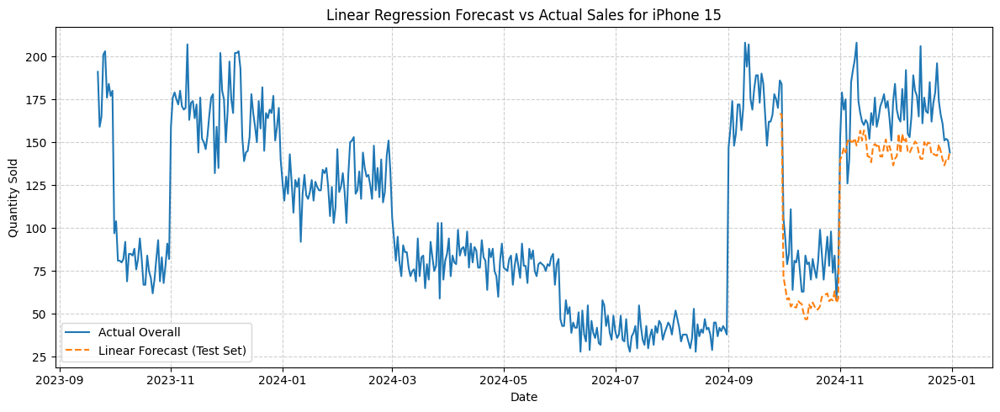

--- 2. Forecasting for 'iPhone 15' (2025) ---
  Features for 'iPhone 15' 2025 forecast created.
  Forecast data head for 'iPhone 15':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  467 -9.749279e-01  7.818315e-01 -0.406737  0.927184  0.982927   
2025-01-02  468 -7.818315e-01  4.338837e-01 -0.587785  0.951057  0.979614   
2025-01-03  469 -2.351569e-14  1.175785e-14 -0.743145  0.970296  0.976011   
2025-01-04  470  7.818315e-01 -4.338837e-01 -0.866025  0.984808  0.972118   
2025-01-05  471  9.749279e-01 -7.818315e-01 -0.951057  0.994522  0.967938   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01 -0.222521 -0.623490 -0.913545  0.374607  ...  False  False  False   
2025-01-02  0.623490 -0.900969 -0.809017  0.309017  ...  False  False  False   
2025-01-03  1.000000 -1.000000 -0.669131  0.241922  ...  False  False  False   
2025-01-04  0.623490 -0.900969 -0.500000  0.173648  ...  False  False  False   
202

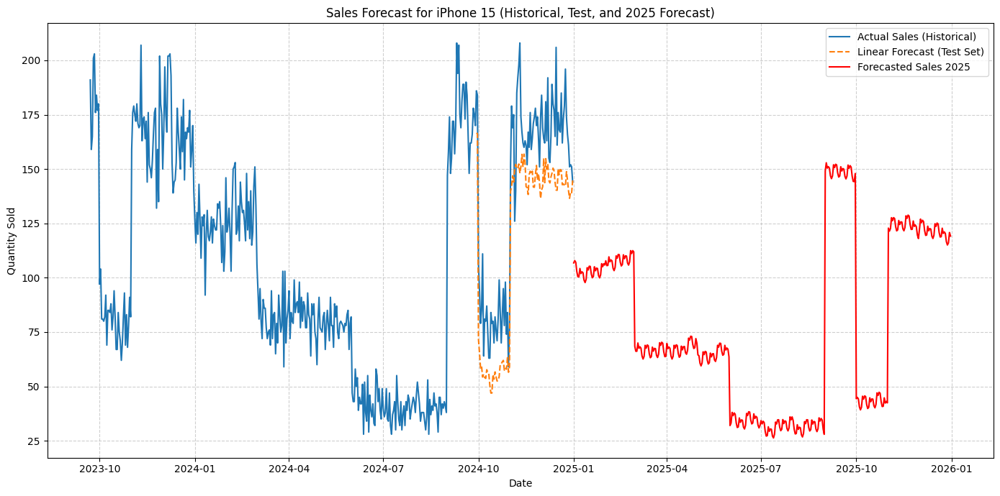

  Forecast Visualization for 'iPhone 15' Complete.

--- Processing Product: 'Samsung S24 Ultra' ---
  Test Set Performance for 'Samsung S24 Ultra':
    MAE  = 50.19
    RMSE = 53.21
    MAPE = 35.03%
    R2   = -3.858


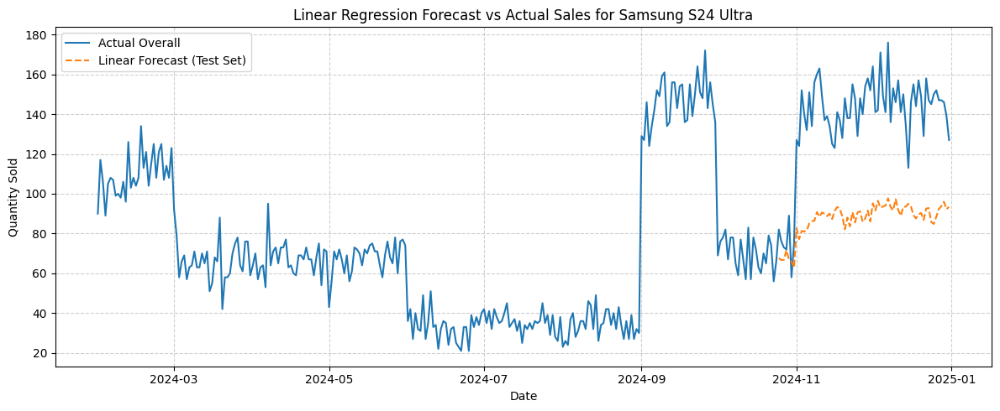

--- 2. Forecasting for 'Samsung S24 Ultra' (2025) ---
  Features for 'Samsung S24 Ultra' 2025 forecast created.
  Forecast data head for 'Samsung S24 Ultra':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  336 -1.175661e-14 -5.878305e-15  0.951057 -0.994522 -0.478734   
2025-01-02  337  7.818315e-01  4.338837e-01  0.994522 -0.999391 -0.463550   
2025-01-03  338  9.749279e-01  7.818315e-01  0.994522 -0.999391 -0.448229   
2025-01-04  339  4.338837e-01  9.749279e-01  0.951057 -0.994522 -0.432776   
2025-01-05  340 -4.338837e-01  9.749279e-01  0.866025 -0.984808 -0.417194   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01  1.000000  1.000000  0.309017 -0.104528  ...  False  False  False   
2025-01-02  0.623490  0.900969  0.104528 -0.034899  ...  False  False  False   
2025-01-03 -0.222521  0.623490 -0.104528  0.034899  ...  False  False  False   
2025-01-04 -0.900969  0.222521 -0.309017  0.104528  ...  Fa

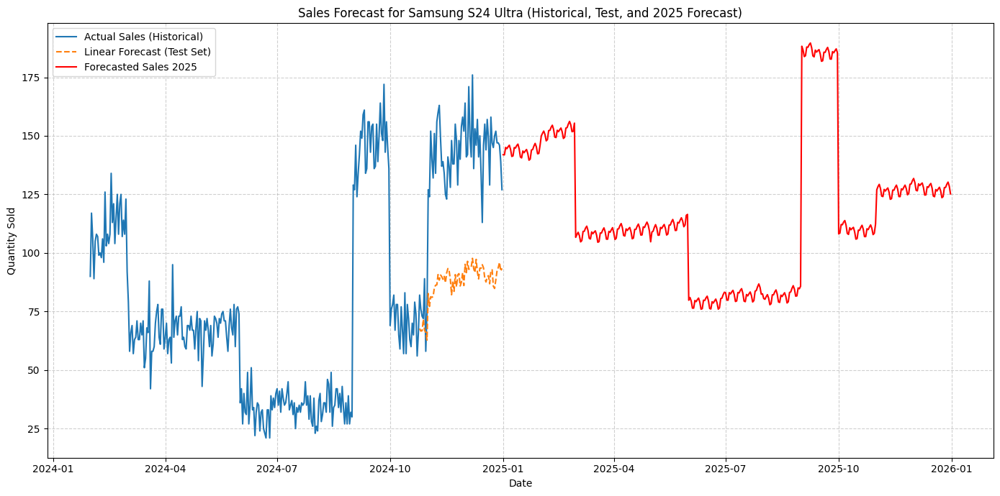

  Forecast Visualization for 'Samsung S24 Ultra' Complete.

--- Processing Product: 'Samsung S24 Pro' ---
  Test Set Performance for 'Samsung S24 Pro':
    MAE  = 70.45
    RMSE = 74.95
    MAPE = 49.86%
    R2   = -7.752


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

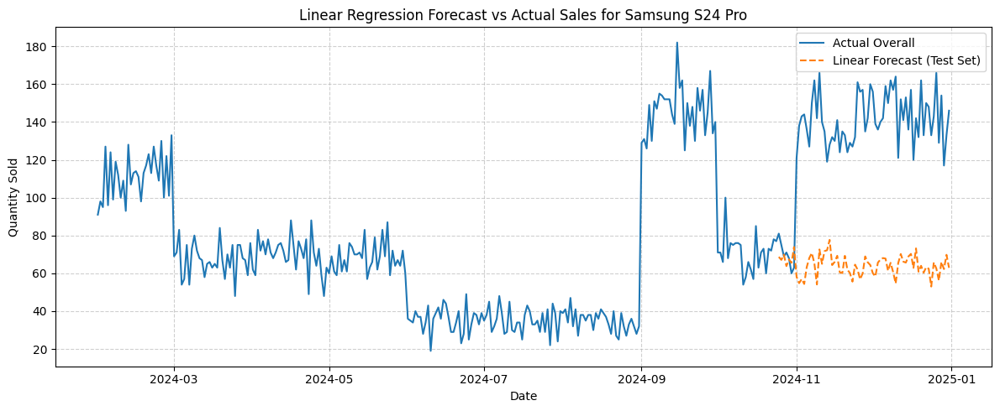

--- 2. Forecasting for 'Samsung S24 Pro' (2025) ---
  Features for 'Samsung S24 Pro' 2025 forecast created.
  Forecast data head for 'Samsung S24 Pro':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  336 -1.175661e-14 -5.878305e-15  0.951057 -0.994522 -0.478734   
2025-01-02  337  7.818315e-01  4.338837e-01  0.994522 -0.999391 -0.463550   
2025-01-03  338  9.749279e-01  7.818315e-01  0.994522 -0.999391 -0.448229   
2025-01-04  339  4.338837e-01  9.749279e-01  0.951057 -0.994522 -0.432776   
2025-01-05  340 -4.338837e-01  9.749279e-01  0.866025 -0.984808 -0.417194   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01  1.000000  1.000000  0.309017 -0.104528  ...  False  False  False   
2025-01-02  0.623490  0.900969  0.104528 -0.034899  ...  False  False  False   
2025-01-03 -0.222521  0.623490 -0.104528  0.034899  ...  False  False  False   
2025-01-04 -0.900969  0.222521 -0.309017  0.104528  ...  False  F

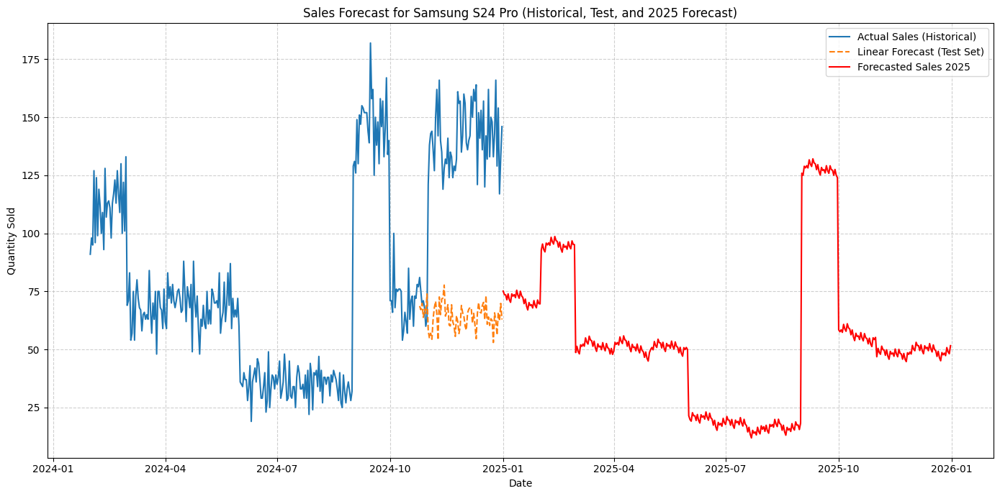

  Forecast Visualization for 'Samsung S24 Pro' Complete.

--- Processing Product: 'Samsung S24' ---
  Test Set Performance for 'Samsung S24':
    MAE  = 51.64
    RMSE = 55.03
    MAPE = 35.32%
    R2   = -3.306


/tmp/ipython-input-106-3480607750.py:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:68: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-106-3480607750.py:69: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
Th

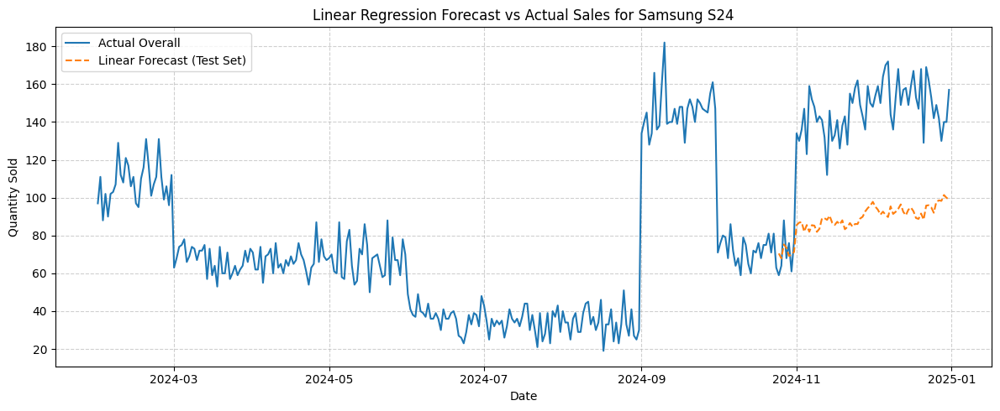

--- 2. Forecasting for 'Samsung S24' (2025) ---
  Features for 'Samsung S24' 2025 forecast created.
  Forecast data head for 'Samsung S24':
              t          sin7         sin14     sin30     sin90    sin365  \
2025-01-01  336 -1.175661e-14 -5.878305e-15  0.951057 -0.994522 -0.478734   
2025-01-02  337  7.818315e-01  4.338837e-01  0.994522 -0.999391 -0.463550   
2025-01-03  338  9.749279e-01  7.818315e-01  0.994522 -0.999391 -0.448229   
2025-01-04  339  4.338837e-01  9.749279e-01  0.951057 -0.994522 -0.432776   
2025-01-05  340 -4.338837e-01  9.749279e-01  0.866025 -0.984808 -0.417194   

                cos7     cos14     cos30     cos90  ...  mon_3  mon_4  mon_5  \
2025-01-01  1.000000  1.000000  0.309017 -0.104528  ...  False  False  False   
2025-01-02  0.623490  0.900969  0.104528 -0.034899  ...  False  False  False   
2025-01-03 -0.222521  0.623490 -0.104528  0.034899  ...  False  False  False   
2025-01-04 -0.900969  0.222521 -0.309017  0.104528  ...  False  False  False 

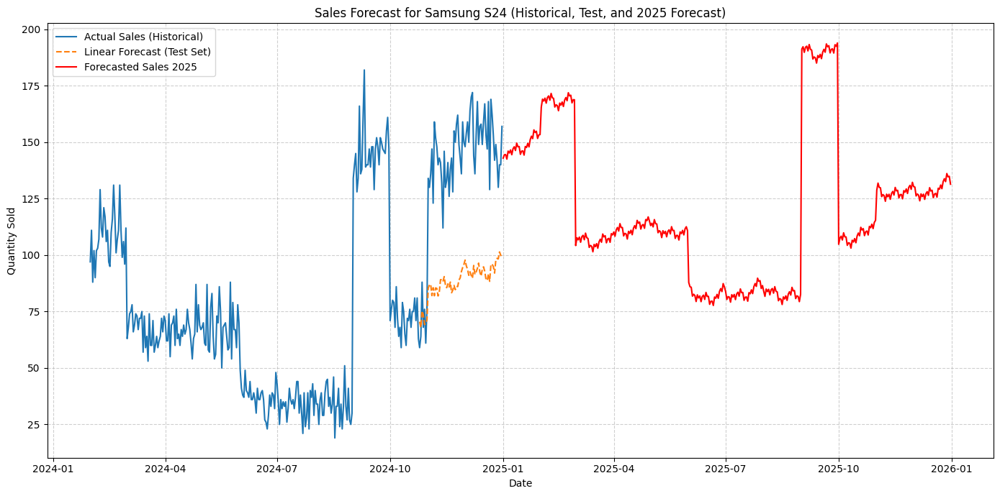

  Forecast Visualization for 'Samsung S24' Complete.

--- Finished Linear Regression modeling for all products ---


In [106]:
# Function to calculate Mean Absolute Percentage Error (MAPE)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_true = y_true != 0
    # Handle case where y_true might be all zeros to avoid division by zero
    if not np.any(non_zero_true):
        return float('inf')
    return np.mean(np.abs((y_true[non_zero_true] - y_pred[non_zero_true]) / y_true[non_zero_true])) * 100

def run_full_linear_regression_pipeline_for_product(df_product_original, product_name):
    """
    Executes the entire Linear Regression forecasting pipeline for a specific product.
    Includes: Data Preparation, Feature Engineering, Feature Selection & Splitting,
    Scaling & Model Training, Performance Evaluation & Visualization, and 2025 Forecasting.

    Args:
        df_product_original (pd.DataFrame): Raw DataFrame containing data for a specific Product_Name.
        product_name (str): The name of the product being processed (used for plot titles/prints).
    """
    print(f"\n--- Processing Product: '{product_name}' ---")

    # --- 1.1. Data Preparation ---
    # Create a copy of the original product's data for this run
    df = df_product_original.copy()

    # Basic check for empty DataFrame, crucial for looping over many products
    if df.empty:
        print(f"  Warning: Data for '{product_name}' is empty. Skipping.")
        return

    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date').set_index('Date')

    # Aggregate data to daily level
    daily = df.resample('D').agg({
        'Quantity_Sold':'sum',
        'Price':'mean',
        'Stock_Level':'sum',
        'Reorder_Threshold':'mean',
        'Promo_Budget':'sum',
        'Store_Size':'mean',
        'Promo_Type_Code':'mean'
    }).rename(columns={
        'Price':'Avg_Price',
        'Stock_Level':'Total_Stock',
        'Reorder_Threshold':'Avg_Reorder_Threshold',
        'Promo_Budget':'Total_Budget',
        'Store_Size':'Avg_Store_Size',
        'Promo_Type_Code':'Avg_Promo_Code'
    }).copy()

    # Handle missing values after resampling
    daily.fillna({
        'Quantity_Sold': 0,
        'Total_Stock': 0,
        'Total_Budget': 0
    }, inplace=True)

    for col in ['Avg_Price','Avg_Reorder_Threshold','Avg_Store_Size','Avg_Promo_Code']:
        daily[col].fillna(method='ffill', inplace=True)
        daily[col].fillna(0, inplace=True) # Fill any remaining NaNs at the beginning

    # --- 1.2. Feature Engineering for Modeling ---
    daily['t'] = np.arange(len(daily))

    # Cyclical time features for seasonality
    for p in [7,14,30,90,365]:
        daily[f'sin{p}'] = np.sin(2*np.pi*daily['t']/p)
        daily[f'cos{p}'] = np.cos(2*np.pi*daily['t']/p)

    # Lag features
    for lag in [1,2,3,7,14,30]:
        daily[f'lag_{lag}'] = daily['Quantity_Sold'].shift(lag).fillna(0)

    # Rolling mean features
    for w in [3,7,14,30]:
        daily[f'roll_{w}'] = daily['Quantity_Sold'].shift(1).rolling(w).mean().fillna(0)

    # Day-of-week and Month categorical features
    daily['dow'] = daily.index.dayofweek
    daily['month'] = daily.index.month

    daily = pd.concat([
        daily,
        pd.get_dummies(daily['dow'], prefix='dow'),
        pd.get_dummies(daily['month'], prefix='mon')
    ], axis=1).copy()

    # --- 1.3. Feature Selection and Dataset Splitting ---
    features = ['t'] + \
               [f'sin{p}' for p in [7,14,30,90,365]] + \
               [f'cos{p}' for p in [7,14,30,90,365]] + \
               ['Avg_Price','Total_Stock','Avg_Reorder_Threshold','Total_Budget','Avg_Store_Size','Avg_Promo_Code'] + \
               [f'lag_{l}' for l in [1,2,3,7,14,30]] + \
               [f'roll_{w}' for w in [3,7,14,30]] + \
               [c for c in daily.columns if c.startswith('dow_') or c.startswith('mon_')]

    # Filter features to only include those present in the daily DataFrame
    features = [f for f in features if f in daily.columns]

    # Drop rows with any NaN values after feature creation (e.g., from lags)
    daily.dropna(subset=features + ['Quantity_Sold'], inplace=True)

    # Robustness check: Ensure enough data remains for modeling after processing
    if daily.empty or len(daily) < len(features) + 2 or len(daily) < 2:
        print(f"  Warning: Not enough clean data for '{product_name}' after feature engineering/dropna. Skipping model training.")
        return

    X = daily[features].copy()
    y = daily['Quantity_Sold'].copy()

    # Time-series split: 80% for training, 20% for testing
    split = int(len(X)*0.8)
    if split == 0 or split == len(X) or split < 2 or (len(X) - split) < 2: # Ensure both train and test sets have data
        print(f"  Warning: Not enough data for '{product_name}' to create meaningful train/test sets. Skipping model training.")
        return

    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # --- 1.4. Data Scaling and Model Training ---
    scaler = StandardScaler()
    X_train_s = scaler.fit_transform(X_train)
    X_test_s = scaler.transform(X_test)

    model = LinearRegression()
    model.fit(X_train_s, y_train)

    y_pred = model.predict(X_test_s)

    # --- 1.5. Performance Evaluation & Visualization ---
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"  Test Set Performance for '{product_name}':\n"
          f"    MAE  = {mae:.2f}\n"
          f"    RMSE = {rmse:.2f}\n"
          f"    MAPE = {mape:.2f}%\n"
          f"    R2   = {r2:.3f}")

    plt.figure(figsize=(12,5))
    plt.plot(daily.index, daily['Quantity_Sold'], label='Actual Overall')
    # Plot forecast for the test set, aligning with its corresponding dates
    plt.plot(daily.index[daily.index.isin(X_test.index)], y_pred, '--', label='Linear Forecast (Test Set)')
    plt.title(f'Linear Regression Forecast vs Actual Sales for {product_name}')
    plt.xlabel('Date')
    plt.ylabel('Quantity Sold')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # --- 2. Forecasting Sales for 2025 ---
    print(f"--- 2. Forecasting for '{product_name}' (2025) ---")

    # 2.1. Create time frame for 2025
    last_date_in_data = daily.index.max()
    forecast_start_date = pd.to_datetime('2025-01-01')
    forecast_end_date = pd.to_datetime('2025-12-31')

    # Adjust forecast start date if existing data already covers or extends into 2025
    if last_date_in_data >= forecast_end_date:
        print(f"  Warning for '{product_name}': Your existing data already covers or goes beyond 2025. "
              "Forecasting for this period might be redundant or inaccurate.")
        pass
    elif last_date_in_data.year >= 2025: # If data extends into 2025 but not fully
        forecast_start_date = last_date_in_data + pd.Timedelta(days=1)
        print(f"  Adjusting forecast start date for '{product_name}' to {forecast_start_date.strftime('%Y-%m-%d')} "
              f"as data already extends into {last_date_in_data.year}.")

    # Generate dates for the forecast period
    # Ensure forecast_start_date is not after forecast_end_date
    if forecast_start_date > forecast_end_date:
        print(f"  Warning for '{product_name}': Forecast start date {forecast_start_date.strftime('%Y-%m-%d')} "
              f"is after forecast end date {forecast_end_date.strftime('%Y-%m-%d')}. Skipping 2025 forecast.")
        return

    forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='D')
    forecast_df = pd.DataFrame(index=forecast_dates)

    # 2.2. Create features for the forecast data
    # Fill constant values from the last available data point in 'daily' for relevant columns
    for col in ['Avg_Price', 'Avg_Reorder_Threshold', 'Avg_Store_Size', 'Avg_Promo_Code']:
        if col in daily.columns:
            forecast_df[col] = daily[col].iloc[-1]
        else:
            forecast_df[col] = 0 # Default to 0 if column not found

    # For Total_Stock and Total_Budget, assume they remain constant at their last observed value or 0.
    if 'Total_Stock' in daily.columns:
        forecast_df['Total_Stock'] = daily['Total_Stock'].iloc[-1]
    else:
        forecast_df['Total_Stock'] = 0

    if 'Total_Budget' in daily.columns:
        forecast_df['Total_Budget'] = daily['Total_Budget'].iloc[-1]
    else:
        forecast_df['Total_Budget'] = 0

    # Create 't' (time index) for forecast data, continuing from the last value of X
    last_t_value = X['t'].max()
    forecast_df['t'] = np.arange(last_t_value + 1, last_t_value + 1 + len(forecast_df))

    # Create cyclical time features for seasonality
    for p in [7,14,30,90,365]:
        forecast_df[f'sin{p}'] = np.sin(2*np.pi*forecast_df['t']/p)
        forecast_df[f'cos{p}'] = np.cos(2*np.pi*forecast_df['t']/p)

    # Create day-of-week and month categorical features
    forecast_df['dow'] = forecast_df.index.dayofweek
    forecast_df['month'] = forecast_df.index.month

    # One-hot encode dow and month for forecast data
    dow_dummies_forecast = pd.get_dummies(forecast_df['dow'], prefix='dow')
    mon_dummies_forecast = pd.get_dummies(forecast_df['month'], prefix='mon')

    # Reindex dummies to ensure all columns from training data are present, filling with 0 if missing
    # This is CRUCIAL for consistency with the scaler and model
    for col in [c for c in X_train.columns if c.startswith('dow_')]:
        if col not in dow_dummies_forecast.columns:
            dow_dummies_forecast[col] = 0
    for col in [c for c in X_train.columns if c.startswith('mon_')]:
        if col not in mon_dummies_forecast.columns:
            mon_dummies_forecast[col] = 0

    forecast_df = pd.concat([forecast_df, dow_dummies_forecast, mon_dummies_forecast], axis=1).copy()


    # For lag and rolling mean features, fill with the last observed values from historical data.
    # IMPORTANT: This is a simplification. For truly accurate long-term forecasts with
    # lag/rolling features, you'd ideally use a recursive forecasting approach where
    # you forecast one day, then use that forecast to calculate the lag/roll for the next.
    # For a direct forecast, using last historical values is a common, though less accurate, approach.
    for lag in [1,2,3,7,14,30]:
        lag_col_name = f'lag_{lag}'
        if lag_col_name in features: # Only process if feature was used in training
            if len(daily['Quantity_Sold']) >= lag:
                forecast_df[lag_col_name] = daily['Quantity_Sold'].iloc[-lag]
            else:
                forecast_df[lag_col_name] = 0 # Not enough history, fill with 0

    for w in [3,7,14,30]:
        roll_col_name = f'roll_{w}'
        if roll_col_name in features: # Only process if feature was used in training
            if len(daily['Quantity_Sold']) >= w + 1: # need at least w+1 for a rolling mean
                forecast_df[roll_col_name] = daily['Quantity_Sold'].rolling(w).mean().iloc[-1]
            else:
                forecast_df[roll_col_name] = 0

    # Ensure the order of columns and the columns themselves match X_train
    # This is critical for the scaler and model to work correctly
    X_forecast = forecast_df[features].copy()

    print(f"  Features for '{product_name}' 2025 forecast created.")
    print(f"  Forecast data head for '{product_name}':")
    print(X_forecast.head())

    # 2.3. Scale the forecast data using the *trained* scaler
    X_forecast_s = scaler.transform(X_forecast)

    # 2.4. Make predictions for 2025
    y_forecast_2025 = model.predict(X_forecast_s)
    # Ensure no negative values for forecasted sales
    y_forecast_2025[y_forecast_2025 < 0] = 0

    forecast_results = pd.DataFrame(y_forecast_2025, index=forecast_dates, columns=['Forecasted_Quantity_Sold'])

    print(f"\n  Forecast for '{product_name}' (2025) complete.")
    print(forecast_results.head())

    # 2.5. Visualize the forecast results
    plt.figure(figsize=(14, 7))
    plt.plot(daily.index, daily['Quantity_Sold'], label='Actual Sales (Historical)')
    plt.plot(daily.index[daily.index.isin(X_test.index)], y_pred, '--', label='Linear Forecast (Test Set)')
    plt.plot(forecast_results.index, forecast_results['Forecasted_Quantity_Sold'], 'r-', label='Forecasted Sales 2025')
    plt.title(f'Sales Forecast for {product_name} (Historical, Test, and 2025 Forecast)')
    plt.xlabel('Date')
    plt.ylabel('Quantity Sold')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    print(f"  Forecast Visualization for '{product_name}' Complete.")


# --- Main Program: Load data and iterate through products ---

# Load the main dataset (run this only once)
print("Loading final_dataset.csv...")
df_final = pd.read_csv('final_dataset.csv')
df_final['Date'] = pd.to_datetime(df_final['Date'])

# Get list of unique product names
unique_product_names = df_final['Product_Name'].unique()

print(f"\n--- Starting Linear Regression modeling for {len(unique_product_names)} products ---")

# Iterate through each unique product and run the pipeline
for p_name in unique_product_names:
    df_product_data = df_final[df_final['Product_Name'] == p_name].copy()
    run_full_linear_regression_pipeline_for_product(df_product_data, p_name)

print("\n--- Finished Linear Regression modeling for all products ---")

**2. Prophet**

    2.1. Data Preparation

In [108]:
# Hàm tính MAPE (Mean Absolute Percentage Error)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_true = y_true != 0
    if not np.any(non_zero_true):
        return float('inf') # Tránh chia cho 0 nếu tất cả y_true đều là 0
    return np.mean(np.abs((y_true[non_zero_true] - y_pred[non_zero_true]) / y_true[non_zero_true])) * 100

# --- Tải dữ liệu chính ---
print("Loading final_dataset.csv...")
df_final = pd.read_csv('final_dataset.csv')
df_final['Date'] = pd.to_datetime(df_final['Date']) # Đảm bảo cột Date là datetime

# --- Chọn MỘT sản phẩm để chạy pipeline ---
# Lấy sản phẩm đầu tiên trong danh sách (bạn có thể thay đổi để chọn sản phẩm khác)
product_to_analyze = df_final['Product_Name'].unique()[0]
print(f"--- Running Prophet pipeline for a single product: '{product_to_analyze}' ---")

Loading final_dataset.csv...
--- Running Prophet pipeline for a single product: 'iPhone 14 Pro Max' ---


In [100]:
pip install prophet

In [109]:
print("\n--- 2.1. Data Preparation for Prophet ---")

# Lấy dữ liệu cho sản phẩm đã chọn và tạo bản sao để làm việc
df = df_final[df_final['Product_Name'] == product_to_analyze].copy()

# Kiểm tra nếu df rỗng sau khi lọc
if df.empty:
    print(f"  Warning: Data for '{product_to_analyze}' is empty. Cannot proceed.")
    df_daily = None
else:
    df_daily = df.groupby('Date')['Quantity_Sold'].sum().reset_index()
    df_daily = df_daily.rename(columns={'Date': 'ds', 'Quantity_Sold': 'y'}).copy()

print("Data Preparation Complete.")
if df_daily is not None:
    print("Prepared daily data head (for Prophet):")
    print(df_daily.head())


--- 2.1. Data Preparation for Prophet ---
Data Preparation Complete.
Prepared daily data head (for Prophet):
          ds    y
0 2023-01-01  124
1 2023-01-02  121
2 2023-01-03  114
3 2023-01-04  139
4 2023-01-05  117


    2.2. Model Building

In [110]:
if 'df_daily' in locals() and df_daily is not None and not df_daily.empty:
    print("\n--- 2.2. Prophet Model Building ---")
    model = Prophet(daily_seasonality=True)
    model.fit(df_daily)
    future = model.make_future_dataframe(periods=365)

    # Generate the forecast
    forecast = model.predict(future)

    print("Prophet Model Building and Forecasting Complete.")
    print("Forecast head:")
    print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())
else:
    print("Skipping 2.2 Prophet Model Building: Daily data (df_daily) is not available.")
    # Đặt forecast thành None để các khối sau có thể kiểm tra
    forecast = None

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/2sltm84k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/pw21dsw6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83391', 'data', 'file=/tmp/tmp3_cetcno/2sltm84k.json', 'init=/tmp/tmp3_cetcno/pw21dsw6.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_modelekjje28h/prophet_model-20250703042446.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:24:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:24:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



--- 2.2. Prophet Model Building ---
Prophet Model Building and Forecasting Complete.
Forecast head:
          ds        yhat  yhat_lower  yhat_upper
0 2023-01-01  139.892543  118.703715  161.633504
1 2023-01-02  134.627688  112.158854  155.301168
2 2023-01-03  133.307601  111.335758  154.444084
3 2023-01-04  129.672331  108.151699  151.159113
4 2023-01-05  128.947644  106.909376  148.704041


    2.3. Model Evaluation and Visualization + Forecast



--- 2.3. Prophet Model Evaluation and Visualization ---
Model Evaluation for 'iPhone 14 Pro Max' (Historical Range):
  MAE: 12.44
  RMSE: 16.76
  MAPE: 14.50%
  R²: 0.89


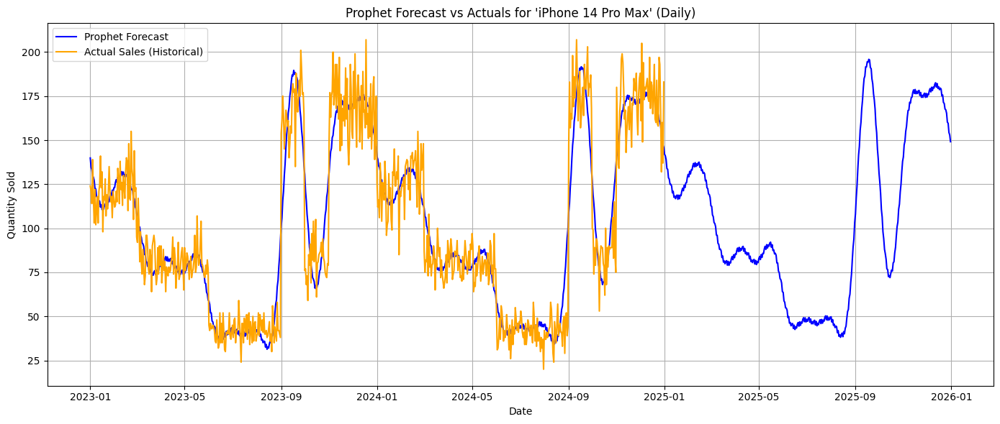

Model Evaluation and Visualization Complete.


In [111]:
# Kiểm tra nếu forecast và df_daily có sẵn
if 'forecast' in locals() and forecast is not None and \
   'df_daily' in locals() and df_daily is not None and not df_daily.empty:
    print("\n--- 2.3. Prophet Model Evaluation and Visualization ---")

    # Merge actual historical data with forecast's historical predictions (yhat)
    merged = df_daily.merge(forecast[['ds', 'yhat']], on='ds', how='left')

    # Filter out NaNs if any (shouldn't be many if merge is correct)
    merged.dropna(inplace=True)

    # Extract true values and predicted values for evaluation
    y_true = merged['y']
    y_pred = merged['yhat']

    # Ensure there's enough data for evaluation after merging and dropping NaNs
    if len(y_true) == 0:
        print("  Warning: No overlapping data points for evaluation. Skipping evaluation and visualization.")
    else:
        # Evaluate performance on historical data
        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        mape = mean_absolute_percentage_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        print(f"Model Evaluation for '{product_to_analyze}' (Historical Range):")
        print(f"  MAE: {mae:.2f}")
        print(f"  RMSE: {rmse:.2f}")
        print(f"  MAPE: {mape:.2f}%")
        print(f"  R²: {r2:.2f}")

        # Visualize full forecast
        plt.figure(figsize=(14, 6))
        plt.plot(forecast['ds'], forecast['yhat'], label='Prophet Forecast', color='blue')
        plt.plot(df_daily['ds'], df_daily['y'], label='Actual Sales (Historical)', color='orange')

        # plt.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], color='blue', alpha=0.2, label='Forecast Uncertainty')

        plt.title(f"Prophet Forecast vs Actuals for '{product_to_analyze}' (Daily)")
        plt.xlabel("Date")
        plt.ylabel("Quantity Sold")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    print("Model Evaluation and Visualization Complete.")
else:
    print("Skipping 2.3 Prophet Model Evaluation and Visualization: Forecast or daily data is not available.")

**DỰ ĐOÁN CHO TẤT CẢ SẢN PHẨM**

Loading final_dataset.csv...


DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/qbsdjfwp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/7cnu3_w2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63382', 'data', 'file=/tmp/tmp3_cetcno/qbsdjfwp.json', 'init=/tmp/tmp3_cetcno/7cnu3_w2.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_modely1_blupt/prophet_model-20250703031433.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']



--- Starting Prophet modeling for 12 products ---

--- Processing Product: 'iPhone 14 Pro Max' with Prophet ---


03:14:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


  Model Evaluation for 'iPhone 14 Pro Max' (Historical Range):
    MAE: 12.44
    RMSE: 16.76
    MAPE: 14.50%
    R²: 0.89


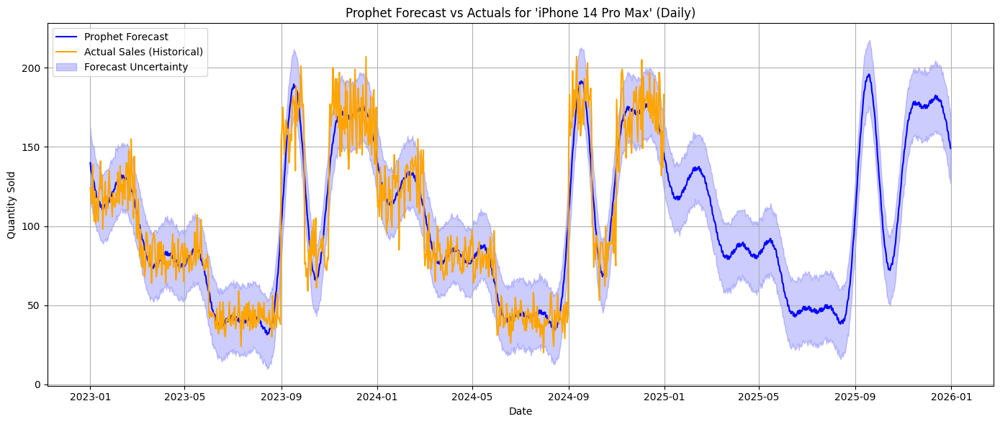

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/213z9fbg.json



--- Processing Product: 'iPhone 14 Pro' with Prophet ---


DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/emg9b1k3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30339', 'data', 'file=/tmp/tmp3_cetcno/213z9fbg.json', 'init=/tmp/tmp3_cetcno/emg9b1k3.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_modelcl5bi5k9/prophet_model-20250703031435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


  Model Evaluation for 'iPhone 14 Pro' (Historical Range):
    MAE: 12.35
    RMSE: 16.96
    MAPE: 15.00%
    R²: 0.88


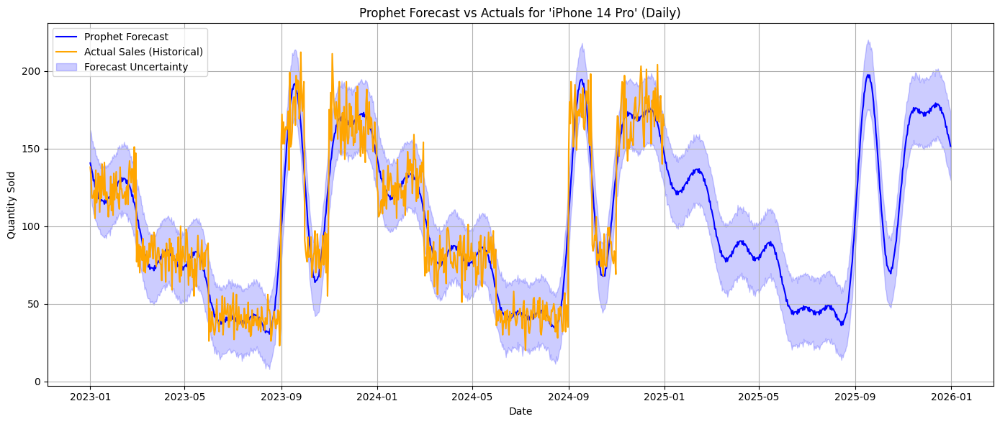

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/dvd7yjr_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/00d_kp95.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65903', 'data', 'file=/tmp/tmp3_cetcno/dvd7yjr_.json', 'init=/tmp/tmp3_cetcno/00d_kp95.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_modelb23vli3m/prophet_model-20250703031437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing



--- Processing Product: 'iPhone 14' with Prophet ---


03:14:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


  Model Evaluation for 'iPhone 14' (Historical Range):
    MAE: 12.32
    RMSE: 16.82
    MAPE: 14.55%
    R²: 0.89


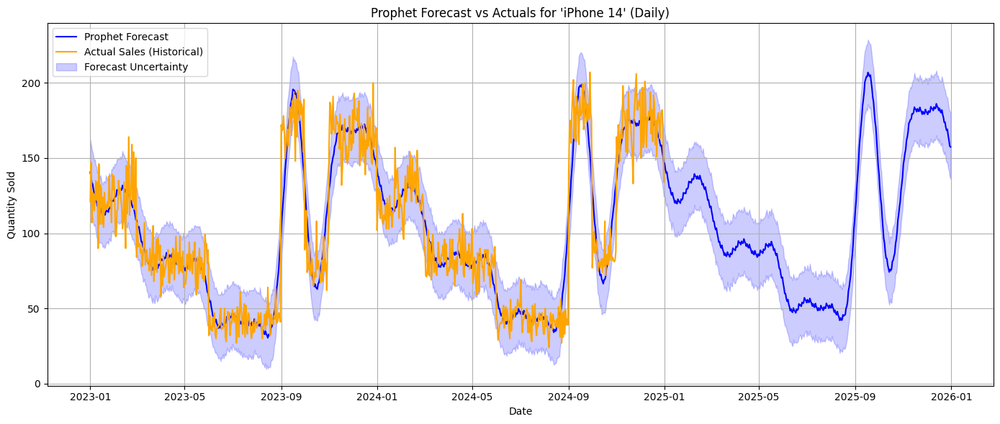

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/aik7y_zv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/nw8h2zee.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9040', 'data', 'file=/tmp/tmp3_cetcno/aik7y_zv.json', 'init=/tmp/tmp3_cetcno/nw8h2zee.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_modelsbughf8g/prophet_model-20250703031437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



--- Processing Product: 'Samsung S23 Ultra' with Prophet ---
  Model Evaluation for 'Samsung S23 Ultra' (Historical Range):
    MAE: 10.56
    RMSE: 14.46
    MAPE: 15.68%
    R²: 0.89


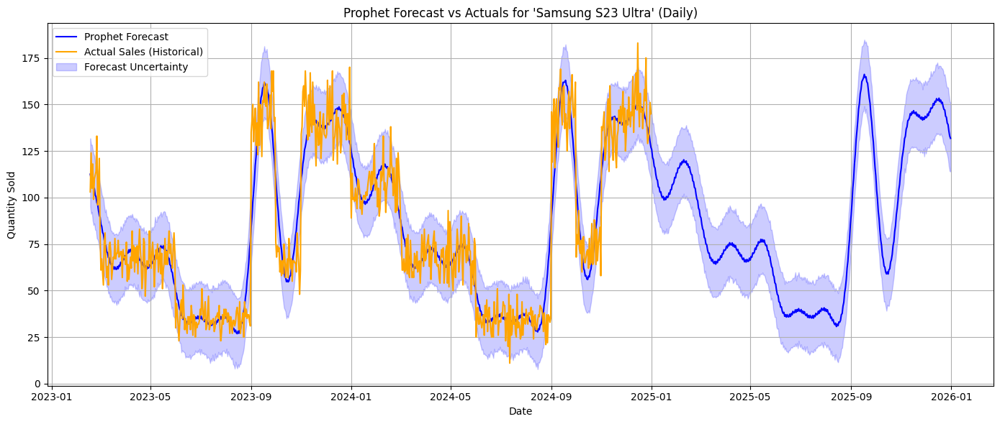

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/cjhwamup.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/wtcw0wq3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74715', 'data', 'file=/tmp/tmp3_cetcno/cjhwamup.json', 'init=/tmp/tmp3_cetcno/wtcw0wq3.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_model7rpyn6k_/prophet_model-20250703031438.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing



--- Processing Product: 'Samsung S23 Pro' with Prophet ---


03:14:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


  Model Evaluation for 'Samsung S23 Pro' (Historical Range):
    MAE: 10.40
    RMSE: 13.99
    MAPE: 15.06%
    R²: 0.89


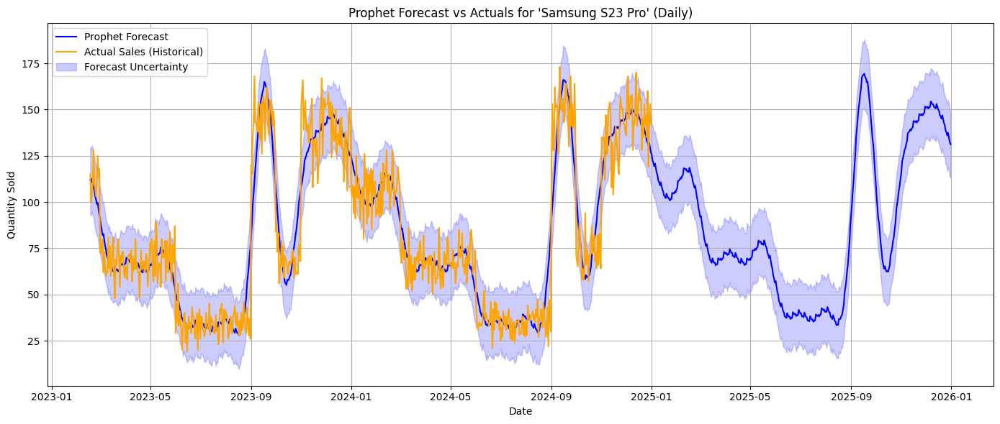

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/zdbgkwbe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/1k65an5o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61160', 'data', 'file=/tmp/tmp3_cetcno/zdbgkwbe.json', 'init=/tmp/tmp3_cetcno/1k65an5o.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_model7y0jilsx/prophet_model-20250703031439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



--- Processing Product: 'Samsung S23' with Prophet ---
  Model Evaluation for 'Samsung S23' (Historical Range):
    MAE: 10.91
    RMSE: 14.82
    MAPE: 15.68%
    R²: 0.88


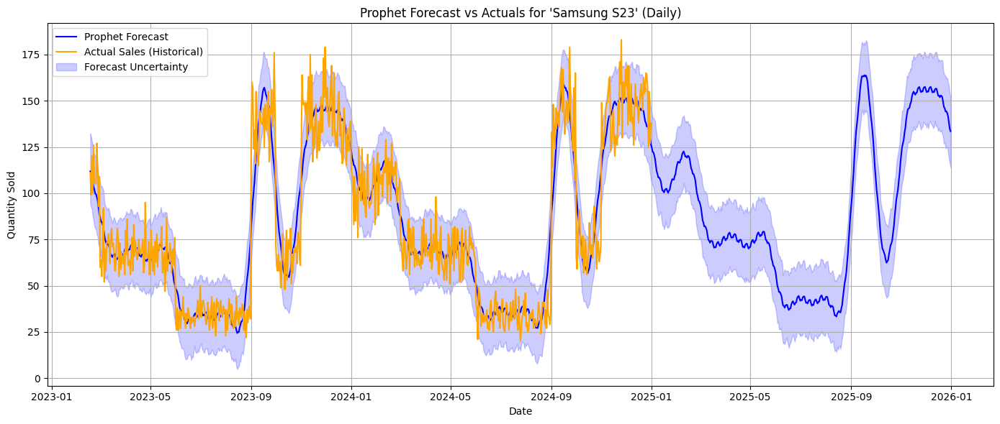

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/uftvlgda.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/_74nm_l7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95673', 'data', 'file=/tmp/tmp3_cetcno/uftvlgda.json', 'init=/tmp/tmp3_cetcno/_74nm_l7.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_model_q6jjqpd/prophet_model-20250703031440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



--- Processing Product: 'iPhone 15 Pro Max' with Prophet ---
  Model Evaluation for 'iPhone 15 Pro Max' (Historical Range):
    MAE: 12.80
    RMSE: 16.95
    MAPE: 13.80%
    R²: 0.89


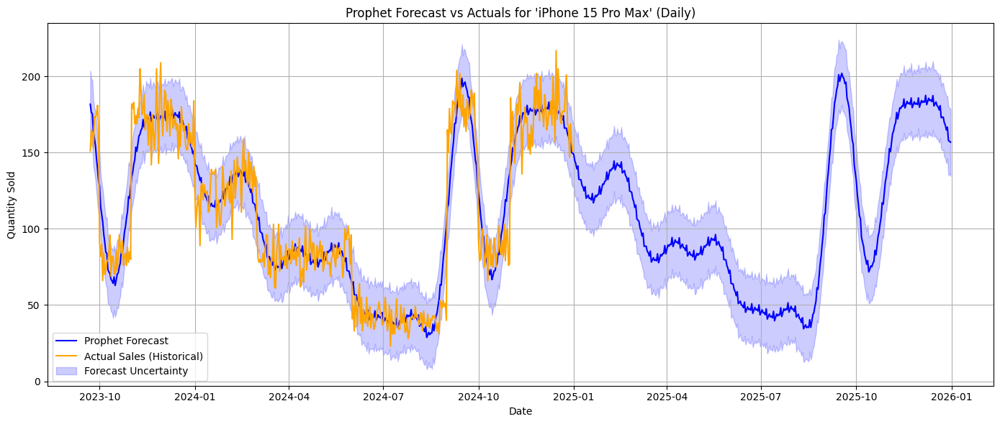

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/mzx1cxsl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/io4ufyjv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43705', 'data', 'file=/tmp/tmp3_cetcno/mzx1cxsl.json', 'init=/tmp/tmp3_cetcno/io4ufyjv.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_modelj6c6icmg/prophet_model-20250703031441.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



--- Processing Product: 'iPhone 15 Pro' with Prophet ---
  Model Evaluation for 'iPhone 15 Pro' (Historical Range):
    MAE: 12.93
    RMSE: 17.57
    MAPE: 13.98%
    R²: 0.88


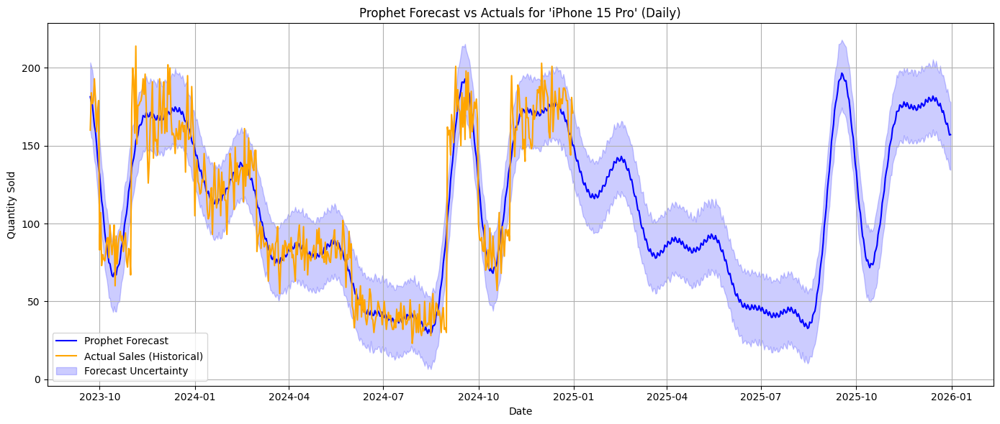

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/kfwo_r_f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/8n0ymgo9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98935', 'data', 'file=/tmp/tmp3_cetcno/kfwo_r_f.json', 'init=/tmp/tmp3_cetcno/8n0ymgo9.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_model56gddper/prophet_model-20250703031441.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing



--- Processing Product: 'iPhone 15' with Prophet ---


03:14:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


  Model Evaluation for 'iPhone 15' (Historical Range):
    MAE: 12.48
    RMSE: 16.81
    MAPE: 13.31%
    R²: 0.89


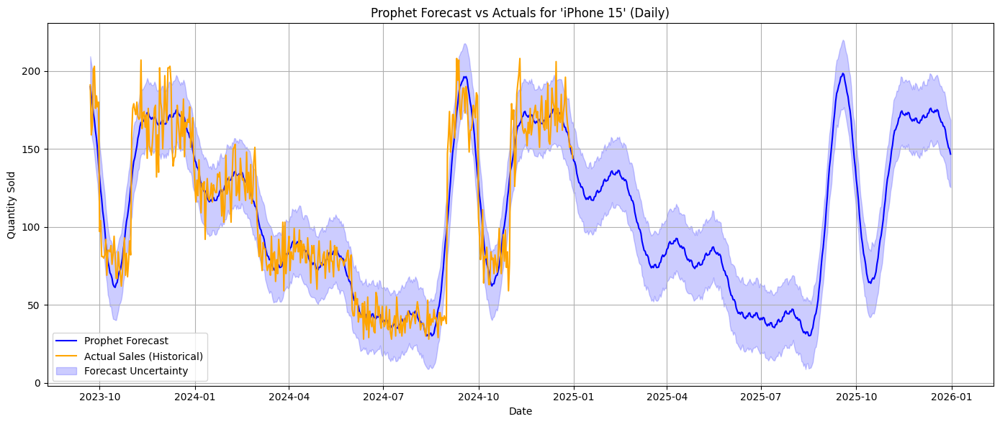

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/wvas3lyv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/dlw2auy2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64800', 'data', 'file=/tmp/tmp3_cetcno/wvas3lyv.json', 'init=/tmp/tmp3_cetcno/dlw2auy2.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_modellv8unee0/prophet_model-20250703031442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



--- Processing Product: 'Samsung S24 Ultra' with Prophet ---
  Model Evaluation for 'Samsung S24 Ultra' (Historical Range):
    MAE: 9.63
    RMSE: 13.23
    MAPE: 14.32%
    R²: 0.91


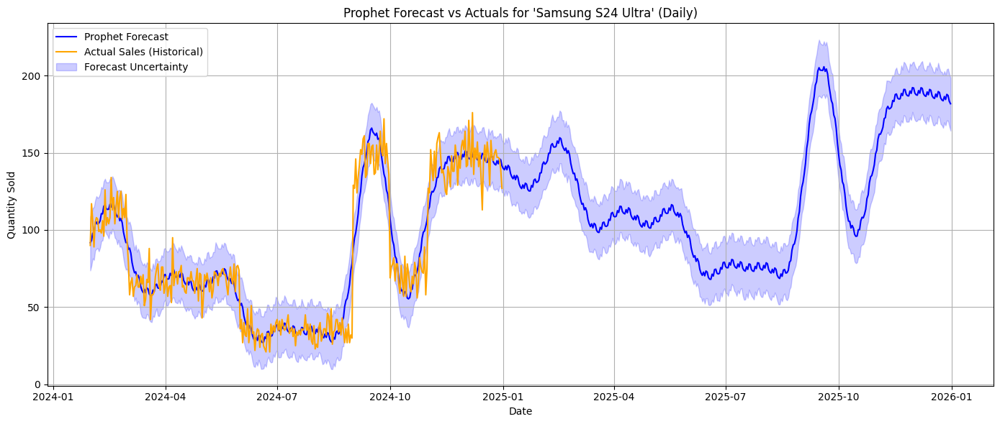

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/ma2e_cl7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/v64s1219.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62080', 'data', 'file=/tmp/tmp3_cetcno/ma2e_cl7.json', 'init=/tmp/tmp3_cetcno/v64s1219.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_model6jrg7vnr/prophet_model-20250703031443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



--- Processing Product: 'Samsung S24 Pro' with Prophet ---
  Model Evaluation for 'Samsung S24 Pro' (Historical Range):
    MAE: 10.13
    RMSE: 13.81
    MAPE: 14.84%
    R²: 0.90


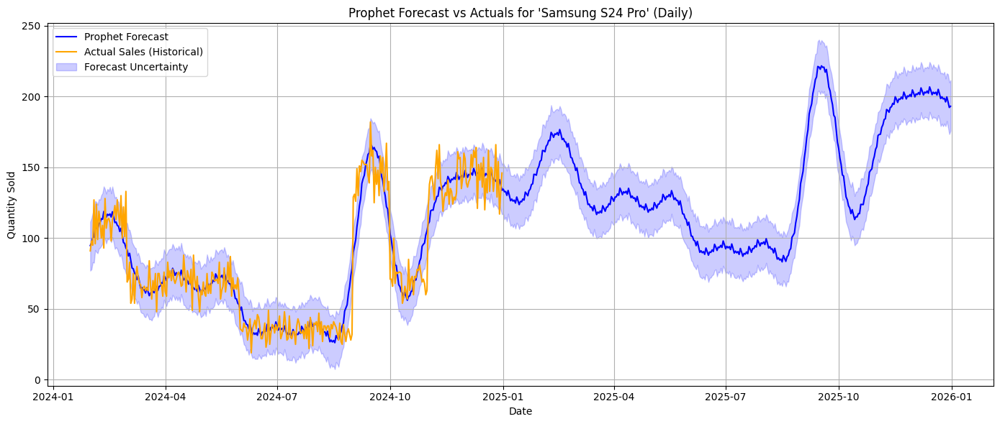

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/e5dl3ofn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3_cetcno/hnszcbgd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20948', 'data', 'file=/tmp/tmp3_cetcno/e5dl3ofn.json', 'init=/tmp/tmp3_cetcno/hnszcbgd.json', 'output', 'file=/tmp/tmp3_cetcno/prophet_modell_xwjq0g/prophet_model-20250703031444.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:14:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:14:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



--- Processing Product: 'Samsung S24' with Prophet ---
  Model Evaluation for 'Samsung S24' (Historical Range):
    MAE: 9.56
    RMSE: 13.41
    MAPE: 14.30%
    R²: 0.91


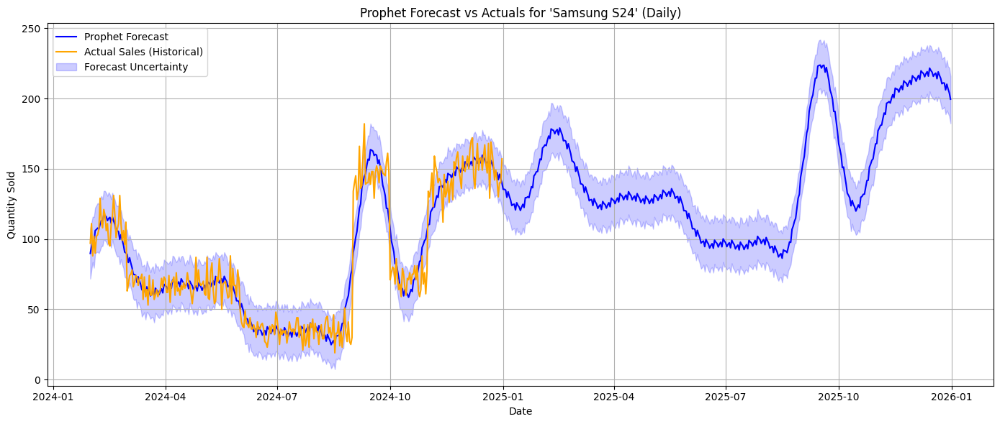


--- Finished Prophet modeling for all products ---


In [60]:
# Hàm tính MAPE (Mean Absolute Percentage Error)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_true = y_true != 0
    if not np.any(non_zero_true):
        return float('inf')
    return np.mean(np.abs((y_true[non_zero_true] - y_pred[non_zero_true]) / y_true[non_zero_true])) * 100

def run_prophet_pipeline_for_product(df_product_original, product_name):
    """
    Runs the full Prophet forecasting pipeline for a single product.

    Args:
        df_product_original (pd.DataFrame): The raw DataFrame for a specific product.
        product_name (str): The name of the product.
    """
    print(f"\n--- Processing Product: '{product_name}' with Prophet ---")

    # 2.1. Data Preparation
    df = df_product_original.copy()

    if df.empty:
        print(f"  Warning: Data for '{product_name}' is empty. Skipping.")
        return

    df['Date'] = pd.to_datetime(df['Date']) # Ensure Date is datetime

    # Aggregate to daily sales (ds, y format for Prophet)
    df_daily = df.groupby('Date')['Quantity_Sold'].sum().reset_index()
    df_daily = df_daily.rename(columns={'Date': 'ds', 'Quantity_Sold': 'y'}).copy()

    # Basic check for enough data points for Prophet
    if len(df_daily) < 2: # Prophet needs at least 2 data points
        print(f"  Warning: Not enough daily data points ({len(df_daily)}) for '{product_name}' to train Prophet. Skipping.")
        return

    # 2.2. Model Building
    try:
        model = Prophet(daily_seasonality=True, # Enable daily seasonality
                        weekly_seasonality=True, # Enable weekly seasonality
                        yearly_seasonality=True) # Enable yearly seasonality

        # Prophet handles holidays and external regressors if provided, not used here
        model.fit(df_daily)

        future = model.make_future_dataframe(periods=365) # Forecast for next 365 days
        forecast = model.predict(future)

    except Exception as e:
        print(f"  Error building/fitting Prophet model for '{product_name}': {e}")
        return

    # 2.3. Model Evaluation and Visualization
    # Evaluate on historical range
    merged = df_daily.merge(forecast[['ds', 'yhat']], on='ds', how='left')
    merged.dropna(inplace=True) # Drop any rows where merge failed (shouldn't happen for historical)

    if len(merged) == 0:
        print(f"  Warning: No overlapping historical data for evaluation for '{product_name}'. Skipping evaluation.")
    else:
        y_true = merged['y']
        y_pred = merged['yhat']

        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        mape = mean_absolute_percentage_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        print(f"  Model Evaluation for '{product_name}' (Historical Range):")
        print(f"    MAE: {mae:.2f}")
        print(f"    RMSE: {rmse:.2f}")
        print(f"    MAPE: {mape:.2f}%")
        print(f"    R²: {r2:.2f}")

    # Visualize full forecast
    plt.figure(figsize=(14, 6))
    plt.plot(forecast['ds'], forecast['yhat'], label='Prophet Forecast', color='blue')
    plt.plot(df_daily['ds'], df_daily['y'], label='Actual Sales (Historical)', color='orange')

    # Optionally plot uncertainty intervals
    plt.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], color='blue', alpha=0.2, label='Forecast Uncertainty')

    plt.title(f"Prophet Forecast vs Actuals for '{product_name}' (Daily)")
    plt.xlabel("Date")
    plt.ylabel("Quantity Sold")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --- Main Program: Load data and iterate through products ---

# Load the main dataset (run this only once)
print("Loading final_dataset.csv...")
df_final = pd.read_csv('final_dataset.csv')
df_final['Date'] = pd.to_datetime(df_final['Date'])

# Get list of unique product names
unique_product_names = df_final['Product_Name'].unique()

print(f"\n--- Starting Prophet modeling for {len(unique_product_names)} products ---")

# Iterate through each unique product and run the pipeline
for p_name in unique_product_names:
    df_product_data = df_final[df_final['Product_Name'] == p_name].copy()
    run_prophet_pipeline_for_product(df_product_data, p_name)

print("\n--- Finished Prophet modeling for all products ---")

**3. LSTM**

    3.1. Import Required Libraries

In [61]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

    3.2. Data Preparation

In [62]:
# Hàm tính MAPE (Mean Absolute Percentage Error)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_true = y_true != 0
    if not np.any(non_zero_true):
        return float('inf') # Tránh chia cho 0 nếu tất cả y_true đều là 0
    return np.mean(np.abs((y_true[non_zero_true] - y_pred[non_zero_true]) / y_true[non_zero_true])) * 100

# Hàm tạo chuỗi dữ liệu cho LSTM
def create_sequences(data, seq_length=30):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

# --- Tải dữ liệu chính ---
print("Loading final_dataset.csv...")
df_final = pd.read_csv('final_dataset.csv')
df_final['Date'] = pd.to_datetime(df_final['Date']) # Đảm bảo cột Date là datetime

# --- Chọn MỘT sản phẩm để chạy pipeline ---
# Lấy sản phẩm đầu tiên trong danh sách (bạn có thể thay đổi để chọn sản phẩm khác)
product_to_analyze = df_final['Product_Name'].unique()[0]
print(f"--- Running LSTM pipeline for a single product: '{product_to_analyze}' ---")

Loading final_dataset.csv...
--- Running LSTM pipeline for a single product: 'iPhone 14 Pro Max' ---


In [63]:
print("\n--- 3.2. Data Preparation for LSTM ---")

# Lấy dữ liệu cho sản phẩm đã chọn và tạo bản sao để làm việc
df = df_final[df_final['Product_Name'] == product_to_analyze].copy()

# Kiểm tra nếu df rỗng sau khi lọc
if df.empty:
    print(f"  Warning: Data for '{product_to_analyze}' is empty. Cannot proceed.")
    df_daily = None
else:
    df['Date'] = pd.to_datetime(df['Date']) # Đảm bảo cột Date là datetime
    df = df.sort_values('Date').reset_index(drop=True) # Sắp xếp và reset index nếu cần

    # Aggregate sales to daily level
    df_daily = df.groupby('Date')['Quantity_Sold'].sum().reset_index()
    df_daily = df_daily.set_index('Date').sort_index().copy() # Đảm bảo đây là bản sao

print("Data Preparation Complete.")
if 'df_daily' in locals() and df_daily is not None:
    print("Prepared daily data head:")
    print(df_daily.head())


--- 3.2. Data Preparation for LSTM ---
Data Preparation Complete.
Prepared daily data head:
            Quantity_Sold
Date                     
2023-01-01            124
2023-01-02            121
2023-01-03            114
2023-01-04            139
2023-01-05            117


    3.3. Normalize and Prepare Sequences

In [64]:
# Kiểm tra nếu df_daily rỗng hoặc không được định nghĩa
if 'df_daily' in locals() and df_daily is not None and not df_daily.empty:
    print("\n--- 3.3. Normalize and Prepare Sequences ---")

    # Scale quantity sold to [0, 1]
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df_daily[['Quantity_Sold']])

    # Create LSTM input sequences
    SEQ_LEN = 30 # Độ dài của chuỗi đầu vào (ví dụ: dùng 30 ngày trước để dự đoán ngày tiếp theo)

    # Đảm bảo có đủ dữ liệu để tạo ít nhất 1 chuỗi
    if len(scaled_data) < SEQ_LEN + 1:
        print(f"  Warning: Not enough data points ({len(scaled_data)}) for '{product_to_analyze}' to create sequences of length {SEQ_LEN}. Skipping.")
        X, y = None, None
    else:
        X, y = create_sequences(scaled_data, SEQ_LEN)

    print(f"Sequences created. X shape: {X.shape}, y shape: {y.shape}")
else:
    print("Skipping 3.3 Normalize and Prepare Sequences: Daily data (df_daily) is not available.")
    X, y = None, None


--- 3.3. Normalize and Prepare Sequences ---
Sequences created. X shape: (701, 30, 1), y shape: (701, 1)


    3.4. Data Split

In [65]:
# Kiểm tra nếu X và y có sẵn và không rỗng
if 'X' in locals() and X is not None and len(X) > 0:
    print("\n--- 3.4. Data Split ---")

    # Train-test split (80% train, 20% test)
    split = int(0.8 * len(X))

    # Đảm bảo có ít nhất 1 mẫu trong mỗi tập
    if split == 0 or split == len(X):
        print(f"  Warning: Not enough sequences ({len(X)}) for '{product_to_analyze}' to create meaningful train/test sets. Skipping.")
        X_train, X_test, y_train, y_test = None, None, None, None
    else:
        X_train, X_test = X[:split], X[split:]
        y_train, y_test = y[:split], y[split:]

    print(f"Train set shape: {X_train.shape}, Test set shape: {X_test.shape}")
else:
    print("Skipping 3.4 Data Split: Sequences (X, y) are not available.")
    X_train, X_test, y_train, y_test = None, None, None, None


--- 3.4. Data Split ---
Train set shape: (560, 30, 1), Test set shape: (141, 30, 1)


    3.5. Model Building

In [66]:
# Kiểm tra nếu X_train có sẵn để xác định input_shape
if 'X_train' in locals() and X_train is not None and len(X_train) > 0:
    print("\n--- 3.5. Model Building ---")

    model = Sequential()
    # input_shape: (SEQ_LEN, 1) vì mỗi sequence có SEQ_LEN bước, mỗi bước có 1 đặc trưng (Quantity_Sold)
    model.add(LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(32))
    model.add(Dropout(0.2))
    model.add(Dense(1)) # Output là một giá trị duy nhất (lượng bán ngày tiếp theo)

    model.compile(optimizer='adam', loss='mean_squared_error')

    print("Model Building Complete. Model summary:")
    model.summary()
else:
    print("Skipping 3.5 Model Building: Training data (X_train) is not available.")
    model = None # Đặt model thành None để các bước sau kiểm tra


--- 3.5. Model Building ---
Model Building Complete. Model summary:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 64)         │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 30, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,345 (114.63 KB)

 Trainable params: 29,345 (114.63 KB)

 Non-trainable params: 0 (0.00 B)

    3.6. Train Model

In [68]:
if 'model' in locals() and model is not None and \
   'X_train' in locals() and X_train is not None and len(X_train) > 0 and \
   'y_train' in locals() and y_train is not None and len(y_train) > 0:
    print("\n--- 3.6. Train Model ---")

    # Huấn luyện mô hình
    history = model.fit(
        X_train, y_train,
        epochs=20, # Số epoch huấn luyện
        batch_size=32, # Kích thước batch
        validation_split=0.1, # Tách 10% tập train làm tập validation
        verbose=1 # Hiển thị tiến trình huấn luyện
    )

    print("Model Training Complete.")
else:
    print("Skipping 3.6 Train Model: Model or training data is not available or is empty.")


--- 3.6. Train Model ---
Epoch 1/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1035 - val_loss: 0.0068
Epoch 2/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0278 - val_loss: 0.0105
Epoch 3/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0227 - val_loss: 0.0045
Epoch 4/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0173 - val_loss: 0.0035
Epoch 5/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0150 - val_loss: 0.0020
Epoch 6/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0165 - val_loss: 0.0021
Epoch 7/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0170 - val_loss: 0.0026
Epoch 8/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0158 - val_loss: 0.0028
Epoch 9/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0169 - val_loss: 0.0020
Epoch 10/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0162 - val_loss: 0.0019
Epoch 11/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0139 - val_loss: 0.0027
Epoch 12/20
16/16 ━━━━━━━━━━━━━━━━━━━

    3.7. Performance Evaluation & Visualize


--- 3.7. Performance Evaluation & Visualize ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step
Test Set Performance for 'iPhone 14 Pro Max':
  MAE: 17.56
  RMSE: 26.23
  MAPE: 15.36%
  R²: 0.76


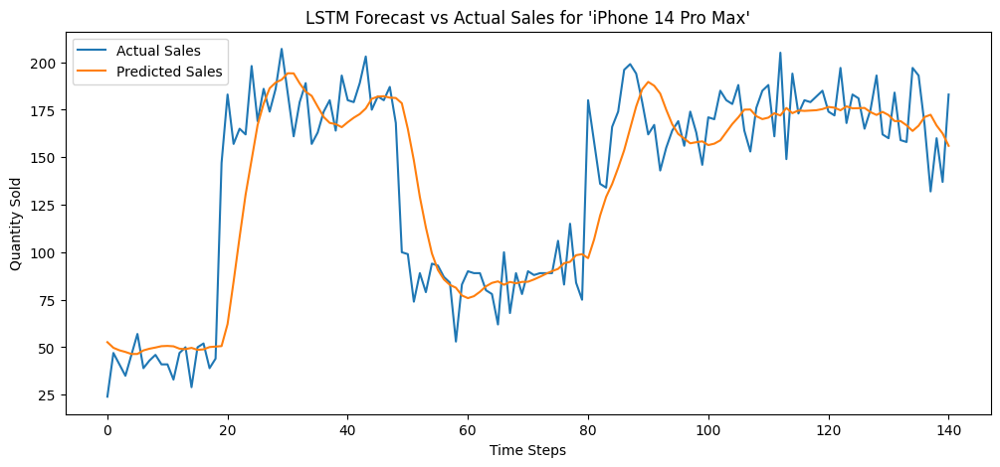

Performance Evaluation & Visualization Complete.


In [69]:
if 'model' in locals() and model is not None and \
   'X_test' in locals() and X_test is not None and len(X_test) > 0 and \
   'y_test' in locals() and y_test is not None and len(y_test) > 0 and \
   'scaler' in locals() and scaler is not None:

    print("\n--- 3.7. Performance Evaluation & Visualize ---")

    # Dự đoán trên tập kiểm tra
    y_pred_scaled = model.predict(X_test)

    # Chuyển đổi ngược về thang đo gốc
    y_pred = scaler.inverse_transform(y_pred_scaled)
    y_test_inv = scaler.inverse_transform(y_test)

    # Đánh giá hiệu suất
    mae = mean_absolute_error(y_test_inv, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred))
    mape = mean_absolute_percentage_error(y_test_inv, y_pred)
    r2 = r2_score(y_test_inv, y_pred)

    print(f"Test Set Performance for '{product_to_analyze}':")
    print(f"  MAE: {mae:.2f}")
    print(f"  RMSE: {rmse:.2f}")
    print(f"  MAPE: {mape:.2f}%")
    print(f"  R²: {r2:.2f}")

    # Trực quan hóa kết quả
    plt.figure(figsize=(12, 5))
    plt.plot(y_test_inv, label='Actual Sales')
    plt.plot(y_pred, label='Predicted Sales')
    plt.title(f"LSTM Forecast vs Actual Sales for '{product_to_analyze}'")
    plt.xlabel("Time Steps")
    plt.ylabel("Quantity Sold")
    plt.legend()
    plt.show()

    print("Performance Evaluation & Visualization Complete.")
else:
    print("Skipping 3.7 Performance Evaluation & Visualize: Model or test data is not available or is empty.")

**DỰ ĐOÁN CHO TOÀN SẢN PHẨM**

Loading final_dataset.csv...

--- Starting LSTM modeling for 12 products ---

--- Processing Product: 'iPhone 14 Pro Max' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 221ms/step
  Test Set Performance for 'iPhone 14 Pro Max':
    MAE: 17.80
    RMSE: 26.68
    MAPE: 14.83%
    R²: 0.750


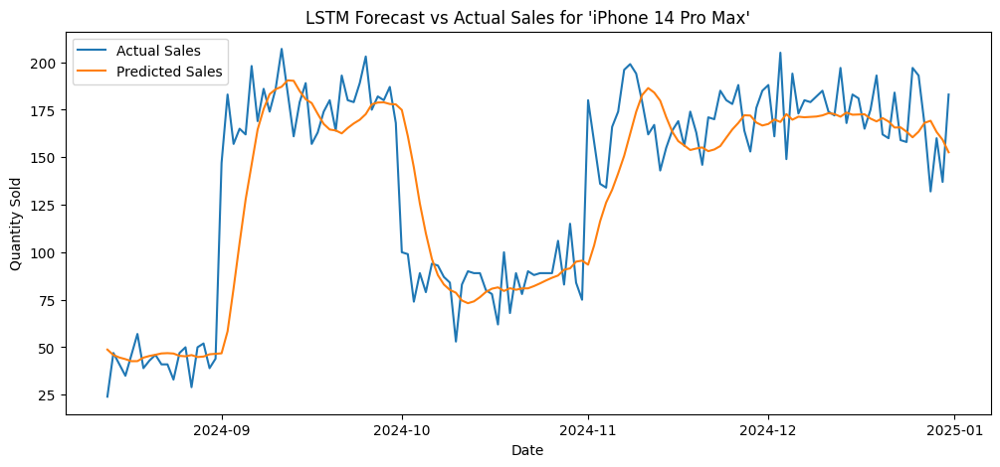


--- Processing Product: 'iPhone 14 Pro' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/5 ━━━━━━━━━━━━━━━━━━━━ 1s 289ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step
  Test Set Performance for 'iPhone 14 Pro':
    MAE: 18.95
    RMSE: 27.76
    MAPE: 14.99%
    R²: 0.726


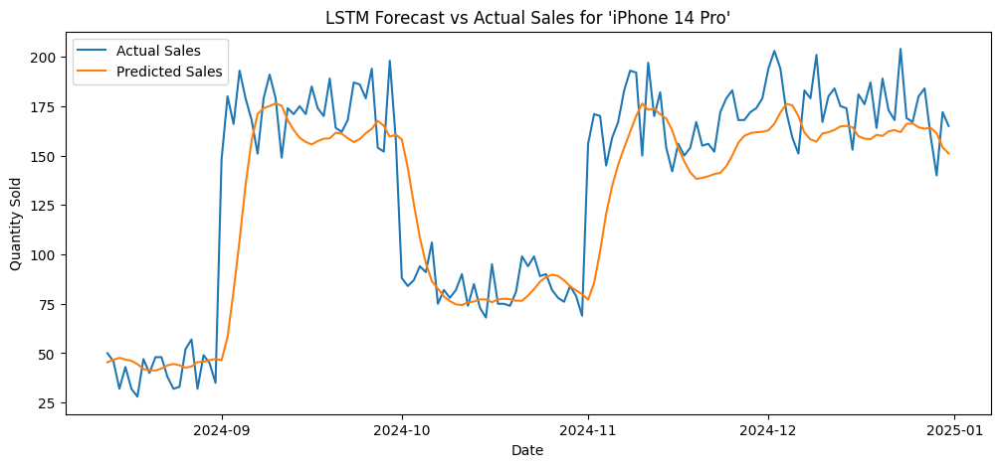


--- Processing Product: 'iPhone 14' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step
  Test Set Performance for 'iPhone 14':
    MAE: 16.52
    RMSE: 26.29
    MAPE: 13.76%
    R²: 0.766


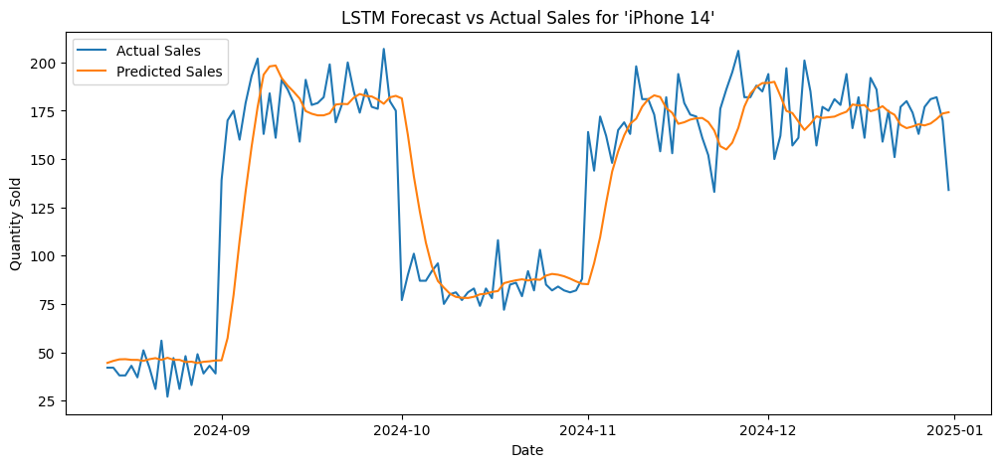


--- Processing Product: 'Samsung S23 Ultra' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step
  Test Set Performance for 'Samsung S23 Ultra':
    MAE: 15.44
    RMSE: 23.49
    MAPE: 14.90%
    R²: 0.655


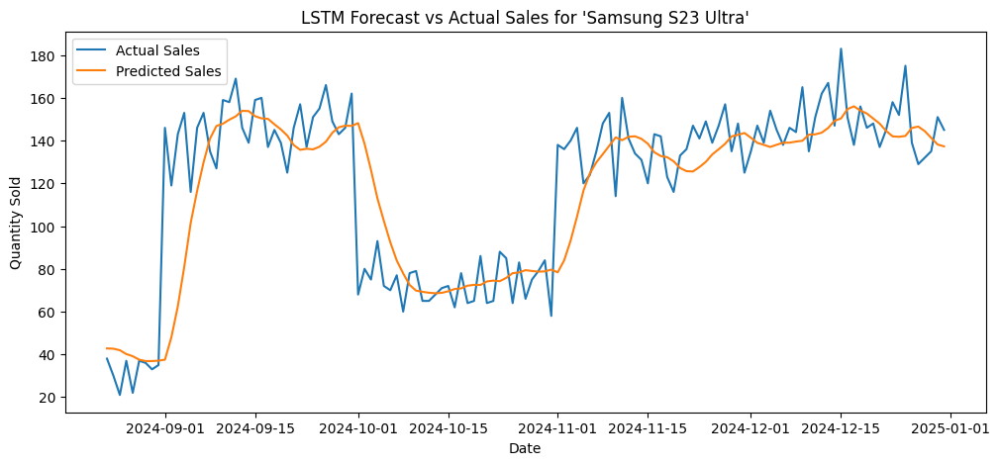


--- Processing Product: 'Samsung S23 Pro' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step
  Test Set Performance for 'Samsung S23 Pro':
    MAE: 14.94
    RMSE: 23.18
    MAPE: 14.27%
    R²: 0.664


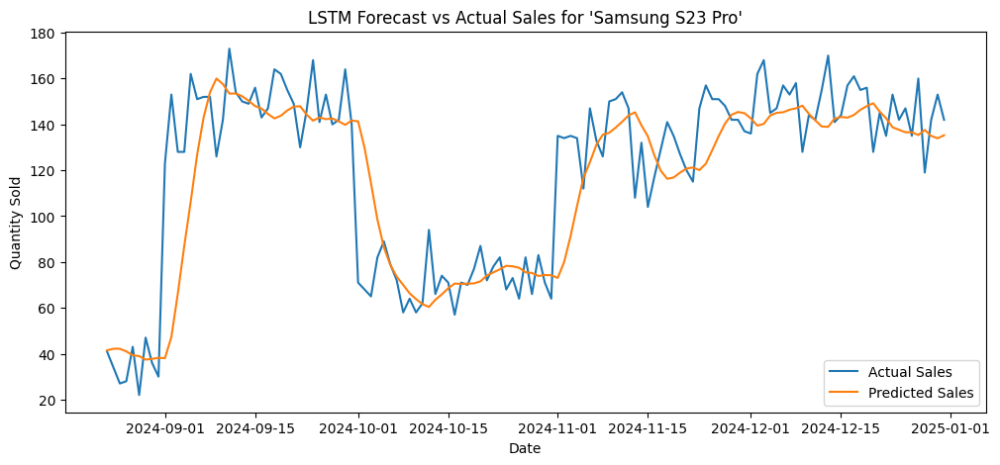


--- Processing Product: 'Samsung S23' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step
  Test Set Performance for 'Samsung S23':
    MAE: 15.45
    RMSE: 22.69
    MAPE: 14.56%
    R²: 0.696


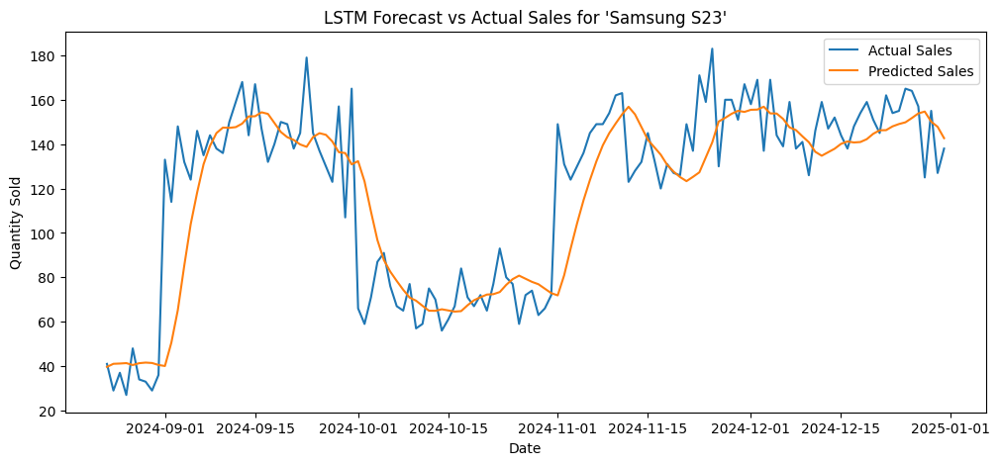


--- Processing Product: 'iPhone 15 Pro Max' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step
  Test Set Performance for 'iPhone 15 Pro Max':
    MAE: 15.89
    RMSE: 22.38
    MAPE: 11.28%
    R²: 0.729


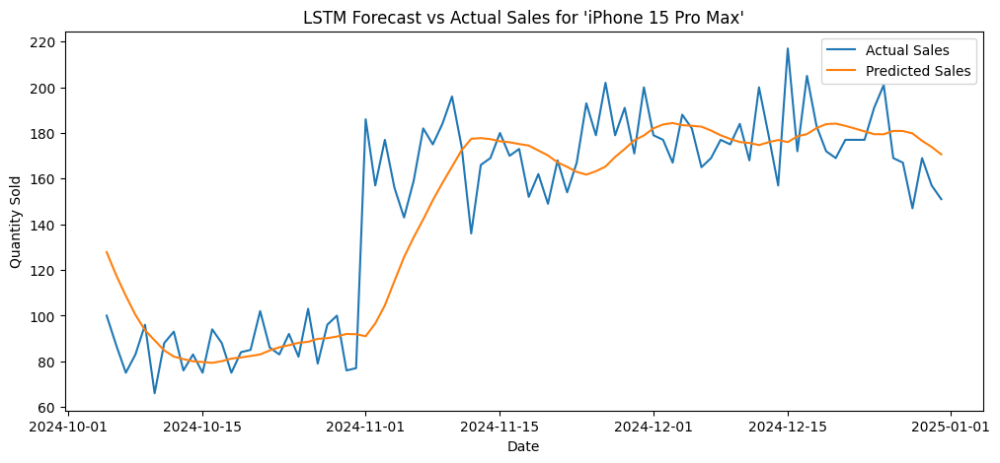


--- Processing Product: 'iPhone 15 Pro' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step
  Test Set Performance for 'iPhone 15 Pro':
    MAE: 16.42
    RMSE: 23.04
    MAPE: 12.36%
    R²: 0.716


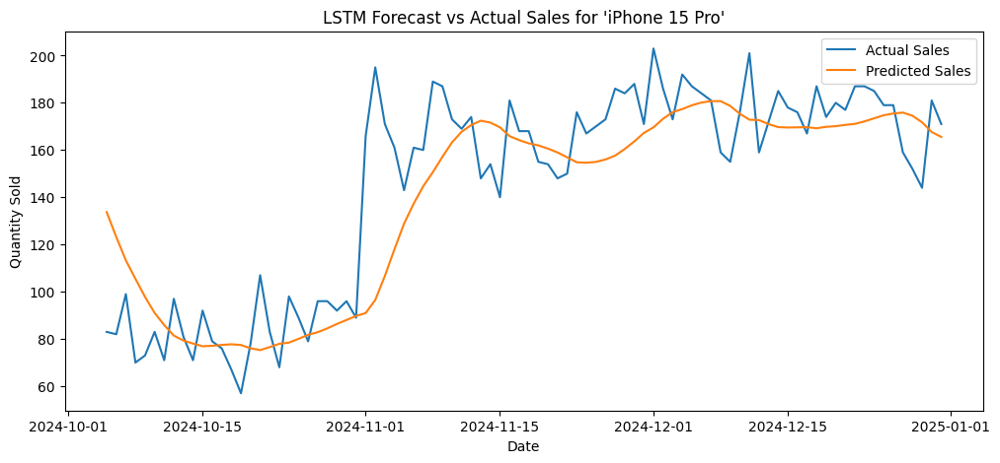


--- Processing Product: 'iPhone 15' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step
  Test Set Performance for 'iPhone 15':
    MAE: 15.78
    RMSE: 23.32
    MAPE: 12.13%
    R²: 0.714


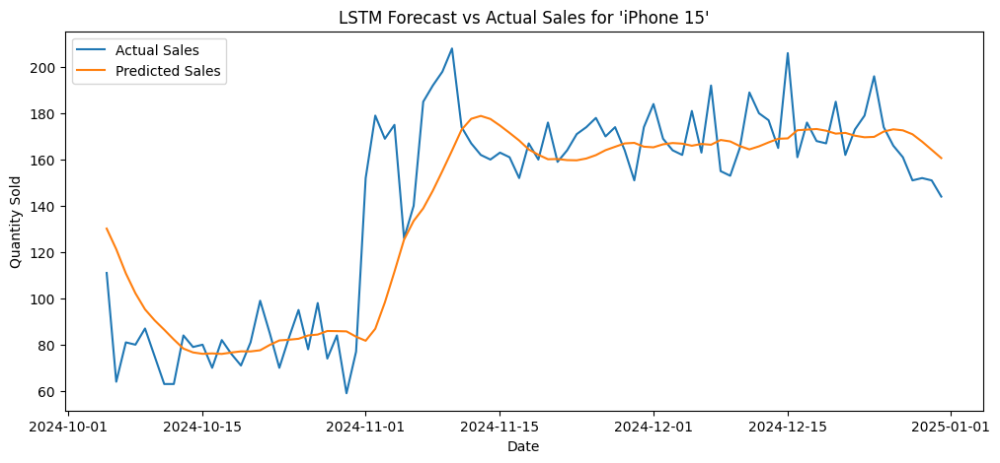


--- Processing Product: 'Samsung S24 Ultra' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 480ms/step
  Test Set Performance for 'Samsung S24 Ultra':
    MAE: 21.80
    RMSE: 25.72
    MAPE: 14.92%
    R²: -2.033


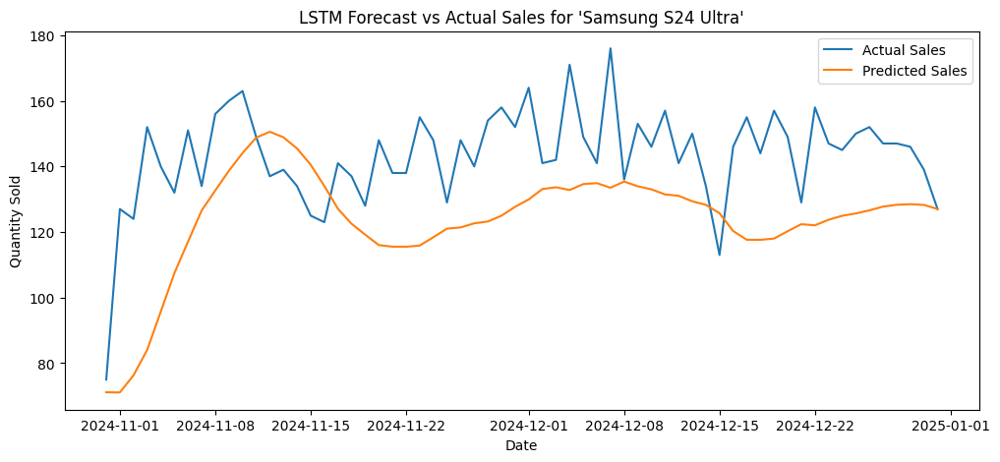


--- Processing Product: 'Samsung S24 Pro' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 472ms/step
  Test Set Performance for 'Samsung S24 Pro':
    MAE: 22.30
    RMSE: 27.09
    MAPE: 15.49%
    R²: -1.711


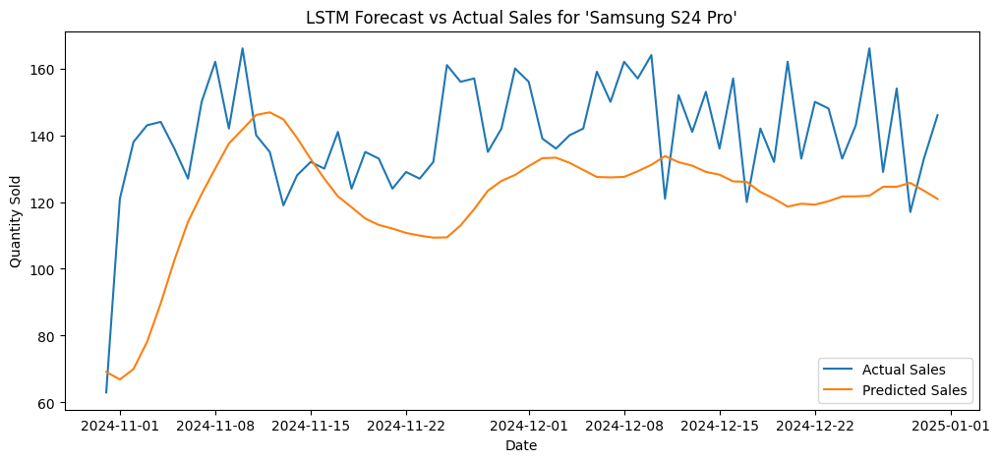


--- Processing Product: 'Samsung S24' with LSTM ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 387ms/step
  Test Set Performance for 'Samsung S24':
    MAE: 22.01
    RMSE: 26.49
    MAPE: 14.80%
    R²: -1.906


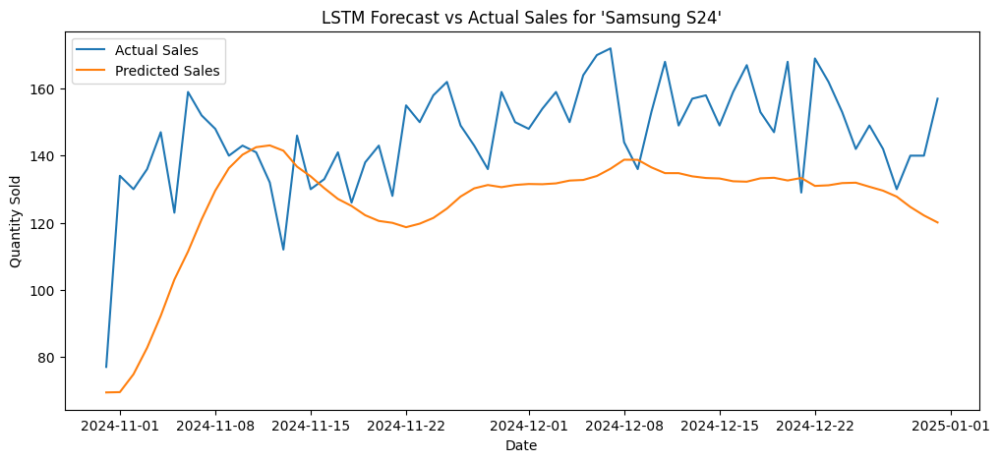


--- Finished LSTM modeling for all products ---


In [70]:
# Hàm tính MAPE (Mean Absolute Percentage Error)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_true = y_true != 0
    if not np.any(non_zero_true):
        return float('inf') # Tránh chia cho 0 nếu tất cả y_true đều là 0
    return np.mean(np.abs((y_true[non_zero_true] - y_pred[non_zero_true]) / y_true[non_zero_true])) * 100

# Hàm tạo chuỗi dữ liệu cho LSTM
def create_sequences(data, seq_length=30):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

def run_full_lstm_pipeline_for_product(df_product_original, product_name, SEQ_LEN=30):
    """
    Executes the entire LSTM forecasting pipeline for a specific product.
    Includes: Data Preparation, Normalization, Sequence Creation, Data Split,
    Model Building, Training, Evaluation, and Visualization.

    Args:
        df_product_original (pd.DataFrame): Raw DataFrame containing data for a specific Product_Name.
        product_name (str): The name of the product being processed (used for plot titles/prints).
        SEQ_LEN (int): The length of the input sequences for the LSTM model.
    """
    print(f"\n--- Processing Product: '{product_name}' with LSTM ---")

    df = df_product_original.copy()

    if df.empty:
        print(f"  Warning: Data for '{product_name}' is empty. Skipping.")
        return

    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date').reset_index(drop=True)

    df_daily = df.groupby('Date')['Quantity_Sold'].sum().reset_index()
    df_daily = df_daily.set_index('Date').sort_index().copy()

    if df_daily.empty:
        print(f"  Warning: Daily data for '{product_name}' is empty. Skipping.")
        return
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df_daily[['Quantity_Sold']])

    if len(scaled_data) < SEQ_LEN + 1:
        print(f"  Warning: Not enough daily data points ({len(scaled_data)}) for '{product_name}' to create sequences of length {SEQ_LEN}. Skipping.")
        return

    X, y = create_sequences(scaled_data, SEQ_LEN)

    if X.size == 0 or y.size == 0: # Check if sequences are empty
        print(f"  Warning: No sequences created for '{product_name}'. Skipping.")
        return
    split = int(0.8 * len(X))

    if split == 0 or split == len(X):
        print(f"  Warning: Not enough sequences ({len(X)}) for '{product_name}' to create meaningful train/test sets. Skipping.")
        return

    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]
    model = Sequential()
    model.add(LSTM(64, return_sequences=True, input_shape=(SEQ_LEN, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(32))
    model.add(Dropout(0.2))
    model.add(Dense(1))

    model.compile(optimizer='adam', loss='mean_squared_error')

    try:
        history = model.fit(
            X_train, y_train,
            epochs=20,
            batch_size=32,
            validation_split=0.1,
            verbose=0 # Set to 0 to suppress training output for cleaner console
        )
    except Exception as e:
        print(f"  Error during model training for '{product_name}': {e}")
        return

    if X_test.size == 0 or y_test.size == 0:
        print(f"  Warning: Test set is empty for '{product_name}'. Skipping evaluation.")
        return

    y_pred_scaled = model.predict(X_test)
    y_pred = scaler.inverse_transform(y_pred_scaled)
    y_test_inv = scaler.inverse_transform(y_test)

    mae = mean_absolute_error(y_test_inv, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred))
    mape = mean_absolute_percentage_error(y_test_inv, y_pred)
    r2 = r2_score(y_test_inv, y_pred)

    print(f"  Test Set Performance for '{product_name}':")
    print(f"    MAE: {mae:.2f}")
    print(f"    RMSE: {rmse:.2f}")
    print(f"    MAPE: {mape:.2f}%")
    print(f"    R²: {r2:.3f}")

    plt.figure(figsize=(12, 5))

    test_dates = df_daily.index[len(df_daily) - len(y_test_inv):] # Dates corresponding to the test set

    plt.plot(test_dates, y_test_inv, label='Actual Sales')
    plt.plot(test_dates, y_pred, label='Predicted Sales')
    plt.title(f"LSTM Forecast vs Actual Sales for '{product_name}'")
    plt.xlabel("Date")
    plt.ylabel("Quantity Sold")
    plt.legend()
    plt.show()

# --- Main Program: Load data and iterate through products ---

# Load the main dataset (run this only once)
print("Loading final_dataset.csv...")
df_final = pd.read_csv('final_dataset.csv')
df_final['Date'] = pd.to_datetime(df_final['Date'])

# Get list of unique product names
unique_product_names = df_final['Product_Name'].unique()

print(f"\n--- Starting LSTM modeling for {len(unique_product_names)} products ---")

# Iterate through each unique product and run the pipeline
# SEQ_LEN (sequence length) for LSTM can be adjusted here if needed for all products
DEFAULT_SEQ_LEN = 30
for p_name in unique_product_names:
    df_product_data = df_final[df_final['Product_Name'] == p_name].copy()
    run_full_lstm_pipeline_for_product(df_product_data, p_name, SEQ_LEN=DEFAULT_SEQ_LEN)

print("\n--- Finished LSTM modeling for all products ---")

**4. LightGBM**

    4.1. Data Preparation

In [72]:
# Hàm tính MAPE (Mean Absolute Percentage Error)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_true = y_true != 0
    if not np.any(non_zero_true):
        return float('inf') # Tránh chia cho 0 nếu tất cả y_true đều là 0
    return np.mean(np.abs((y_true[non_zero_true] - y_pred[non_zero_true]) / y_true[non_zero_true])) * 100

# --- Tải dữ liệu chính ---
print("Loading final_dataset.csv...")
df_final = pd.read_csv('final_dataset.csv')
df_final['Date'] = pd.to_datetime(df_final['Date']) # Đảm bảo cột Date là datetime

# --- Chọn MỘT sản phẩm để chạy pipeline ---
# Lấy sản phẩm đầu tiên trong danh sách (bạn có thể thay đổi để chọn sản phẩm khác)
product_to_analyze = df_final['Product_Name'].unique()[0]
print(f"--- Running LightGBM pipeline for a single product: '{product_to_analyze}' ---")

Loading final_dataset.csv...
--- Running LightGBM pipeline for a single product: 'iPhone 14 Pro Max' ---


In [73]:
print("\n--- 4.1. Data Preparation for LightGBM ---")

# Lấy dữ liệu cho sản phẩm đã chọn và tạo bản sao để làm việc
df = df_final[df_final['Product_Name'] == product_to_analyze].copy()

if df.empty:
    print(f"  Warning: Data for '{product_to_analyze}' is empty. Cannot proceed.")
    daily = None # Đặt daily thành None để các khối sau kiểm tra và dừng
else:
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date').set_index('Date')

    # Aggregate data to daily level (consistent with previous models)
    daily = df.resample('D').agg({
        'Quantity_Sold':'sum',
        'Price':'mean',
        'Stock_Level':'sum',
        'Reorder_Threshold':'mean',
        'Promo_Budget':'sum',
        'Store_Size':'mean',
        'Promo_Type_Code':'mean'
    }).rename(columns={
        'Price':'Avg_Price',
        'Stock_Level':'Total_Stock',
        'Reorder_Threshold':'Avg_Reorder_Threshold',
        'Promo_Budget':'Total_Budget',
        'Store_Size':'Avg_Store_Size',
        'Promo_Type_Code':'Avg_Promo_Code'
    }).copy()

    daily.fillna({
        'Quantity_Sold': 0,
        'Total_Stock': 0,
        'Total_Budget': 0
    }, inplace=True)

    for col in ['Avg_Price','Avg_Reorder_Threshold','Avg_Store_Size','Avg_Promo_Code']:
        daily[col].fillna(method='ffill', inplace=True)
        daily[col].fillna(0, inplace=True) # Fill any remaining NaNs at the beginning

print("Data Preparation Complete.")
if 'daily' in locals() and daily is not None:
    print("Prepared daily data head:")
    print(daily.head())


--- 4.1. Data Preparation for LightGBM ---
Data Preparation Complete.
Prepared daily data head:
            Quantity_Sold  Avg_Price  Total_Stock  Avg_Reorder_Threshold  \
Date                                                                       
2023-01-01            124      29.99          161                   10.0   
2023-01-02            121      29.99          191                   10.0   
2023-01-03            114      29.99          153                   10.0   
2023-01-04            139      29.99          200                   10.0   
2023-01-05            117      29.99          168                   10.0   

            Total_Budget  Avg_Store_Size  Avg_Promo_Code  
Date                                                      
2023-01-01             0           158.0             0.0  
2023-01-02             0           158.0             0.0  
2023-01-03             0           158.0             0.0  
2023-01-04             0           158.0             0.0  
2023-01-05      

/tmp/ipython-input-73-840143893.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-73-840143893.py:38: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-73-840143893.py:39: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The beha

    4.2. Feature Engineering

In [74]:
# Kiểm tra nếu daily rỗng hoặc không được định nghĩa
if 'daily' in locals() and daily is not None and not daily.empty:
    print("\n--- 4.2. Feature Engineering for LightGBM ---")

    # Time index and cyclical features
    daily['t'] = np.arange(len(daily))
    daily['sin7'] = np.sin(2 * np.pi * daily['t'] / 7)
    daily['cos7'] = np.cos(2 * np.pi * daily['t'] / 7)
    daily['sin30'] = np.sin(2 * np.pi * daily['t'] / 30)
    daily['cos30'] = np.cos(2 * np.pi * daily['t'] / 30)

    # Lag features
    for lag in [1,7,14,30]:
        daily[f'lag_{lag}'] = daily['Quantity_Sold'].shift(lag).fillna(0)

    # Rolling mean features
    for win in [7,14,30]:
        daily[f'roll_{win}'] = daily['Quantity_Sold'].shift(1).rolling(win).mean().fillna(0)

    # Categorical temporal features (Day of Week and Month)
    daily['dow'] = daily.index.dayofweek
    daily['month'] = daily.index.month

    # Create dummy variables and join
    dow_d = pd.get_dummies(daily['dow'], prefix='dow')
    mon_d = pd.get_dummies(daily['month'], prefix='mon')
    daily = daily.join(dow_d).join(mon_d).copy() # Use .copy() after join for safety

    print("Feature Engineering Complete.")
    print("Daily data with new features head:")
    print(daily.head())
else:
    print("Skipping 4.2 Feature Engineering: 'daily' is not defined or is empty from previous step.")


--- 4.2. Feature Engineering for LightGBM ---
Feature Engineering Complete.
Daily data with new features head:
            Quantity_Sold  Avg_Price  Total_Stock  Avg_Reorder_Threshold  \
Date                                                                       
2023-01-01            124      29.99          161                   10.0   
2023-01-02            121      29.99          191                   10.0   
2023-01-03            114      29.99          153                   10.0   
2023-01-04            139      29.99          200                   10.0   
2023-01-05            117      29.99          168                   10.0   

            Total_Budget  Avg_Store_Size  Avg_Promo_Code  t      sin7  \
Date                                                                    
2023-01-01             0           158.0             0.0  0  0.000000   
2023-01-02             0           158.0             0.0  1  0.781831   
2023-01-03             0           158.0             0.0  2  0.

    4.3. Feature Selection

In [75]:
# Kiểm tra nếu daily rỗng hoặc không được định nghĩa
if 'daily' in locals() and daily is not None and not daily.empty:
    print("\n--- 4.3. Feature Selection and Data Split ---")

    # Feature selection
    # Ensure all listed features are actually present in daily.columns after creation
    features = [
        't','sin7','cos7','sin30','cos30',
        'Avg_Price','Total_Stock','Avg_Reorder_Threshold',
        'Total_Budget','Avg_Store_Size','Avg_Promo_Code'
    ] + [f'lag_{lag}' for lag in [1,7,14,30]] + [f'roll_{win}' for win in [7,14,30]] + \
      [c for c in daily.columns if c.startswith('dow_') or c.startswith('mon_')]

    features = [f for f in features if f in daily.columns]

    # Drop rows with missing values in required columns
    initial_rows_before_dropna = len(daily)
    daily.dropna(subset=features+['Quantity_Sold'], inplace=True)
    if len(daily) < initial_rows_before_dropna:
        print(f"  Removed {initial_rows_before_dropna - len(daily)} rows due to NaN values in features or target.")

    if daily.empty:
        print("  Warning: No data left after dropping NaNs. Cannot proceed with model training.")
        X_train, X_test, y_train, y_test, split = None, None, None, None, None # Đặt None để các bước sau kiểm tra
    else:
        # Time-based train-test split (80% train, 20% test)
        X = daily[features].copy()
        y = daily['Quantity_Sold'].copy()

        split = int(len(daily)*0.8) # Split point based on length of daily

        # Đảm bảo có đủ dữ liệu cho cả train và test set
        if split == 0 or split == len(X):
            print(f"  Warning: Not enough data ({len(X)} rows) for '{product_to_analyze}' to create meaningful train/test sets (split point: {split}). Cannot proceed with model training.")
            X_train, X_test, y_train, y_test, split = None, None, None, None, None
        else:
            X_train, X_test = X.iloc[:split], X.iloc[split:]
            y_train, y_test = y.iloc[:split], y.iloc[split:]

            print(f"  Train set size: {len(X_train)} | Test set size: {len(X_test)}")
    print("Feature Selection and Data Split Complete.")
else:
    print("Skipping 4.3 Feature Selection and Data Split: 'daily' is not defined or is empty from previous step.")
    X_train, X_test, y_train, y_test, split = None, None, None, None, None # Đảm bảo các biến này được định nghĩa


--- 4.3. Feature Selection and Data Split ---
  Train set size: 584 | Test set size: 147
Feature Selection and Data Split Complete.


    4.4. Model Training

In [76]:
# Kiểm tra nếu X_train và y_train có sẵn
if 'X_train' in locals() and X_train is not None and not X_train.empty and \
   'y_train' in locals() and y_train is not None and not y_train.empty:
    print("\n--- 4.4. Model Training ---")

    # TimeSeriesSplit cho cross-validation trên chuỗi thời gian
    tscv = TimeSeriesSplit(n_splits=5)

    # Pipeline để kết hợp scaling và mô hình LGBM
    pipeline = Pipeline([
        ('scale', StandardScaler()),
        ('lgbm', LGBMRegressor(random_state=42))
    ])

    # Định nghĩa không gian tham số cho GridSearchCV
    param_grid = {
        'lgbm__n_estimators': [100, 200], # Số lượng cây
        'lgbm__max_depth': [5, 10],      # Độ sâu tối đa của cây
        'lgbm__learning_rate': [0.01, 0.1] # Tốc độ học
    }

    # GridSearchCV để tìm bộ tham số tốt nhất
    search = GridSearchCV(pipeline, param_grid,
                          cv=tscv, # Sử dụng TimeSeriesSplit
                          scoring='neg_mean_absolute_percentage_error', # Tối ưu hóa theo MAPE âm
                          n_jobs=-1) # Sử dụng tất cả các nhân CPU có thể

    # Huấn luyện mô hình với GridSearchCV
    search.fit(X_train, y_train)

    # Lấy mô hình tốt nhất
    best = search.best_estimator_

    print("Model Training Complete. Best parameters found:")
    print(search.best_params_)
else:
    print("Skipping 4.4 Model Training: Training data (X_train, y_train) is not available or is empty.")
    best = None # Đặt best thành None để các bước sau kiểm tra


--- 4.4. Model Training ---
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2055
[LightGBM] [Info] Number of data points in the train set: 584, number of used features: 36
[LightGBM] [Info] Start training from score 92.796233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


    4.5. Model Evaluation & Visualize


--- 4.5. Model Evaluation & Visualize ---
Test Set Performance for 'iPhone 14 Pro Max':
  MAE  = 16.18
  RMSE = 22.20
  MAPE = 13.27%
  R²   = 0.839

Seasonal Metrics by Month:
   month_num        MAE       RMSE         MAPE
0          8   7.362317   9.198083  1866.349111
1          9  19.027834  27.419928  1072.212901
2         10  11.254418  14.423715  1363.378957
3         11  18.523220  25.243440  1103.265210
4         12  23.188930  26.756336  1317.733996


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/tmp/ipython-input-77-885467611.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal = df_test.groupby('month_num').apply(lambda x: pd.Series({


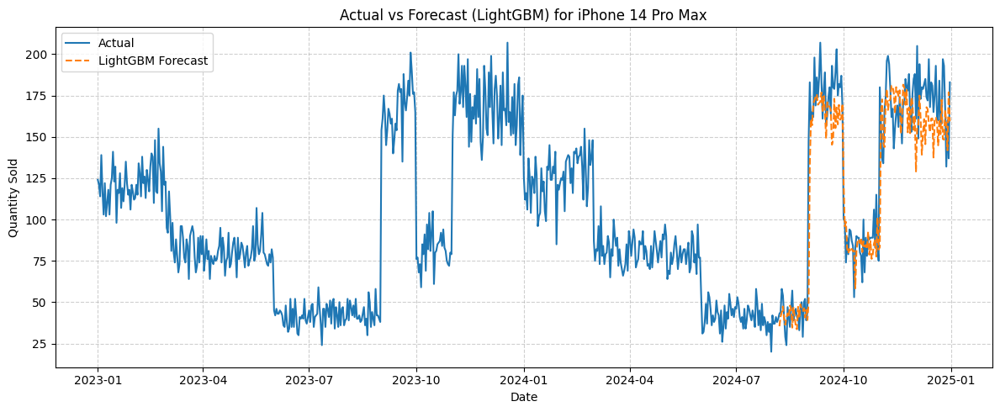

Model Evaluation & Visualization Complete.


In [77]:
# Kiểm tra nếu best model, X_test, y_test có sẵn
if 'best' in locals() and best is not None and \
   'X_test' in locals() and X_test is not None and not X_test.empty and \
   'y_test' in locals() and y_test is not None and not y_test.empty and \
   'daily' in locals() and daily is not None and 'split' in locals() and split is not None:
    print("\n--- 4.5. Model Evaluation & Visualize ---")

    # Dự đoán và đánh giá
    y_pred = best.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred) # Sử dụng hàm MAPE đã định nghĩa
    r2 = r2_score(y_test, y_pred)

    print(f"Test Set Performance for '{product_to_analyze}':\n"
          f"  MAE  = {mae:.2f}\n"
          f"  RMSE = {rmse:.2f}\n"
          f"  MAPE = {mape:.2f}%\n"
          f"  R²   = {r2:.3f}")

    # Tính toán các chỉ số theo tháng (Seasonal Metrics by Month)
    df_test = daily.iloc[split:].copy() # Lấy phần test set từ daily
    df_test['Forecast'] = y_pred
    df_test['month_num'] = df_test.index.month # Lấy số tháng từ index

    # Sử dụng apply với lambda function để tính các chỉ số cho từng nhóm tháng
    seasonal = df_test.groupby('month_num').apply(lambda x: pd.Series({
        'MAE': mean_absolute_error(x['Quantity_Sold'], x['Forecast']),
        'RMSE': np.sqrt(mean_squared_error(x['Quantity_Sold'], x['Forecast'])),
        'MAPE': mean_absolute_percentage_error(x['Quantity_Sold'], x['Forecast'])*100
    })).reset_index()

    print('\nSeasonal Metrics by Month:')
    print(seasonal)

    # Visualize test vs prediction
    plt.figure(figsize=(12,5))
    plt.plot(daily.index, daily['Quantity_Sold'], label='Actual')
    plt.plot(daily.index[split:], y_pred, '--', label='LightGBM Forecast') # index[split:] sẽ tương ứng với X_test
    plt.title(f'Actual vs Forecast (LightGBM) for {product_to_analyze}')
    plt.xlabel('Date')
    plt.ylabel('Quantity Sold')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    print("Model Evaluation & Visualization Complete.")
else:
    print("Skipping 4.5 Model Evaluation & Visualize: Model or test data is not available.")

**DỰ ĐOÁN CHO TỪNG SẢN PHẨM**

Loading final_dataset.csv...

--- Starting LightGBM modeling for 12 products ---

--- Processing Product: 'iPhone 14 Pro Max' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2055
[LightGBM] [Info] Number of data points in the train set: 584, number of used features: 36
[LightGBM] [Info] Start training from score 92.796233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

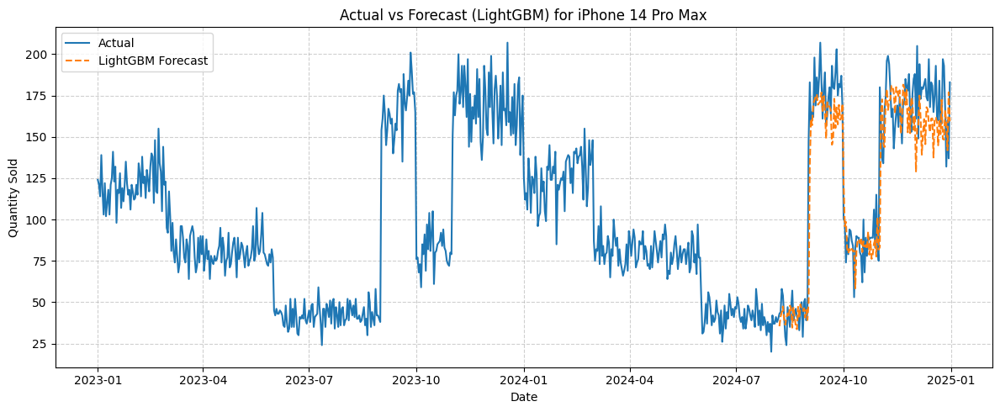


--- Processing Product: 'iPhone 14 Pro' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2073
[LightGBM] [Info] Number of data points in the train set: 584, number of used features: 35
[LightGBM] [Info] Start training from score 92.549658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

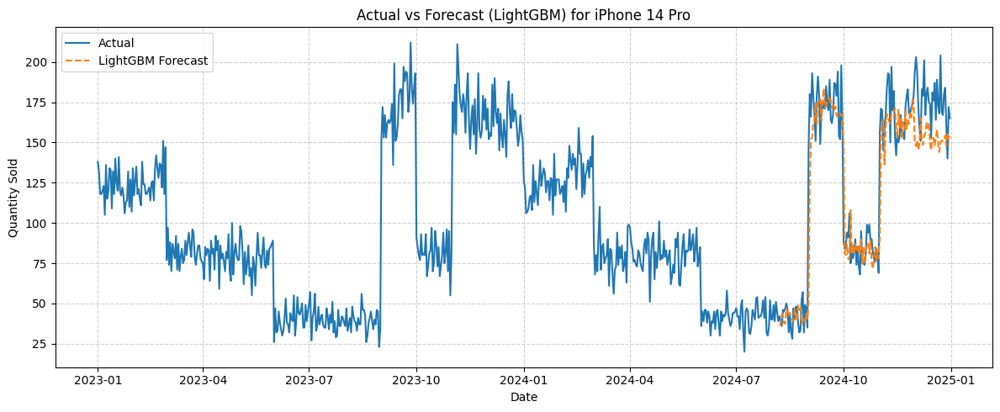


--- Processing Product: 'iPhone 14' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2079
[LightGBM] [Info] Number of data points in the train set: 584, number of used features: 35
[LightGBM] [Info] Start training from score 92.958904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

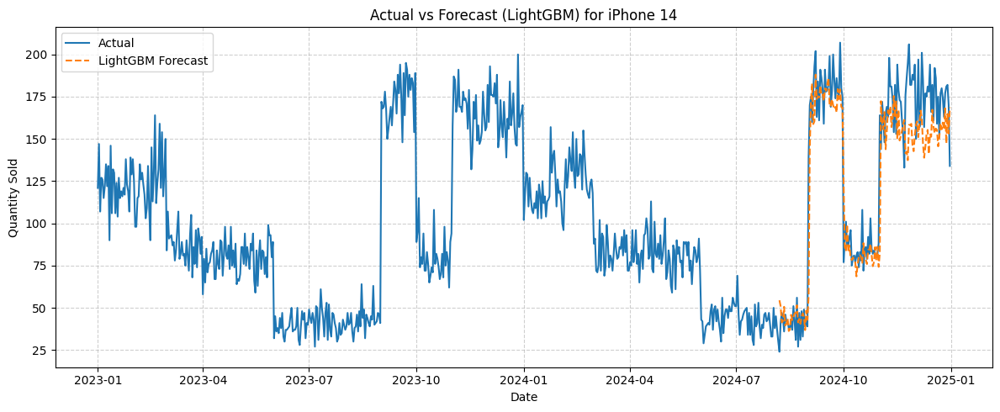


--- Processing Product: 'Samsung S23 Ultra' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1877
[LightGBM] [Info] Number of data points in the train set: 547, number of used features: 35
[LightGBM] [Info] Start training from score 75.047532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

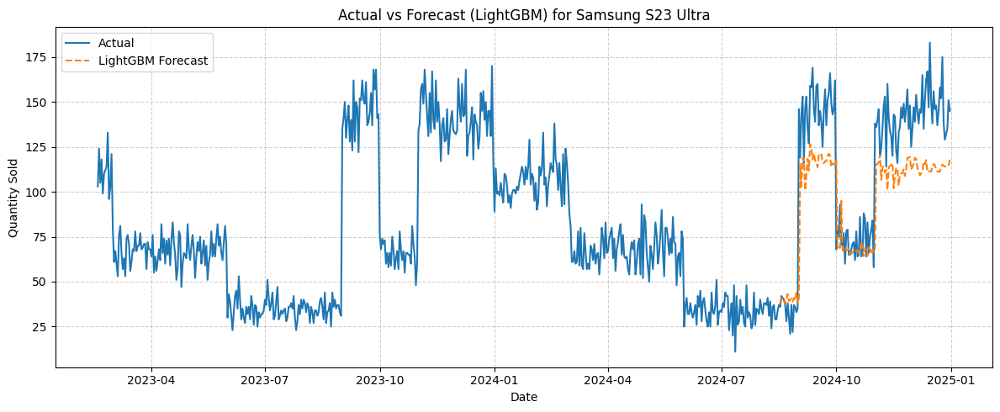


--- Processing Product: 'Samsung S23 Pro' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1873
[LightGBM] [Info] Number of data points in the train set: 547, number of used features: 35
[LightGBM] [Info] Start training from score 75.010969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

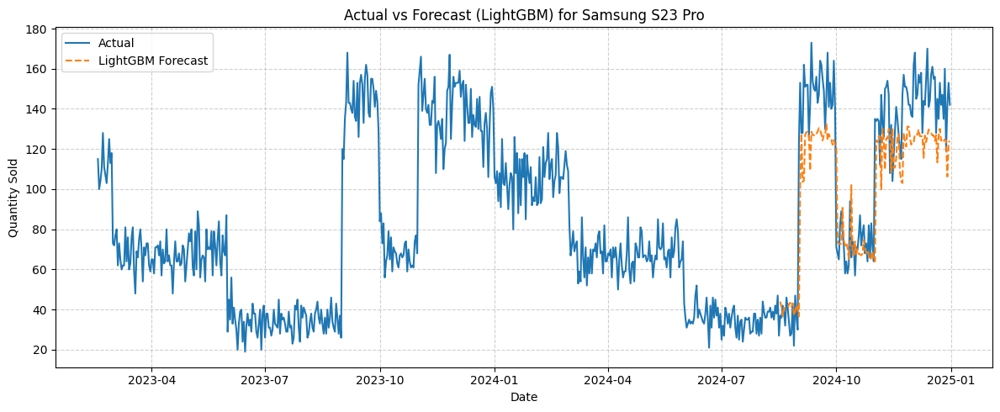


--- Processing Product: 'Samsung S23' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1898
[LightGBM] [Info] Number of data points in the train set: 547, number of used features: 35
[LightGBM] [Info] Start training from score 74.623400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

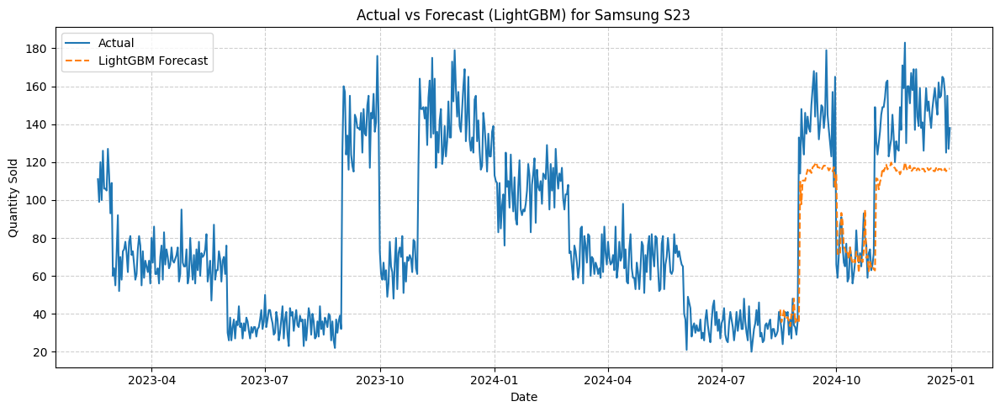


--- Processing Product: 'iPhone 15 Pro Max' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1339
[LightGBM] [Info] Number of data points in the train set: 373, number of used features: 35
[LightGBM] [Info] Start training from score 103.278820
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

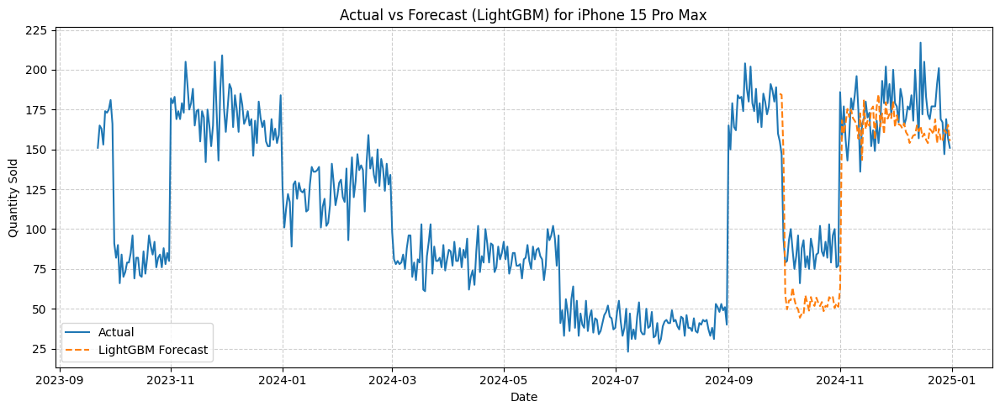


--- Processing Product: 'iPhone 15 Pro' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1341
[LightGBM] [Info] Number of data points in the train set: 373, number of used features: 35
[LightGBM] [Info] Start training from score 102.442359
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

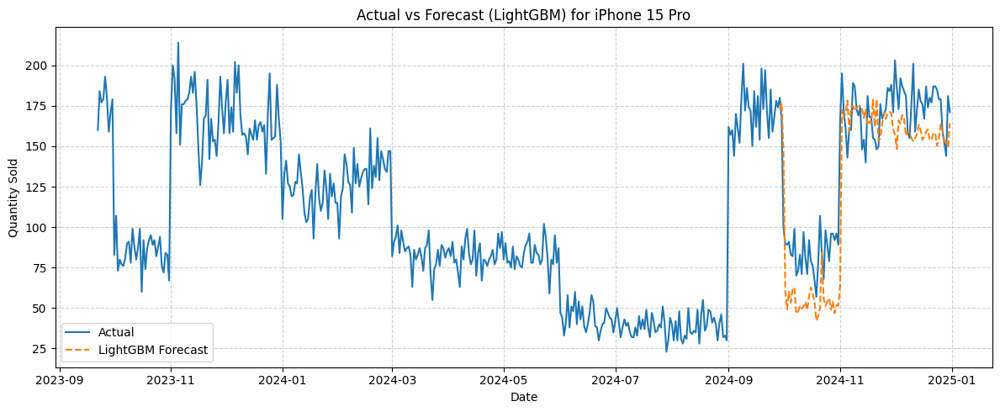


--- Processing Product: 'iPhone 15' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1332
[LightGBM] [Info] Number of data points in the train set: 373, number of used features: 35
[LightGBM] [Info] Start training from score 101.849866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

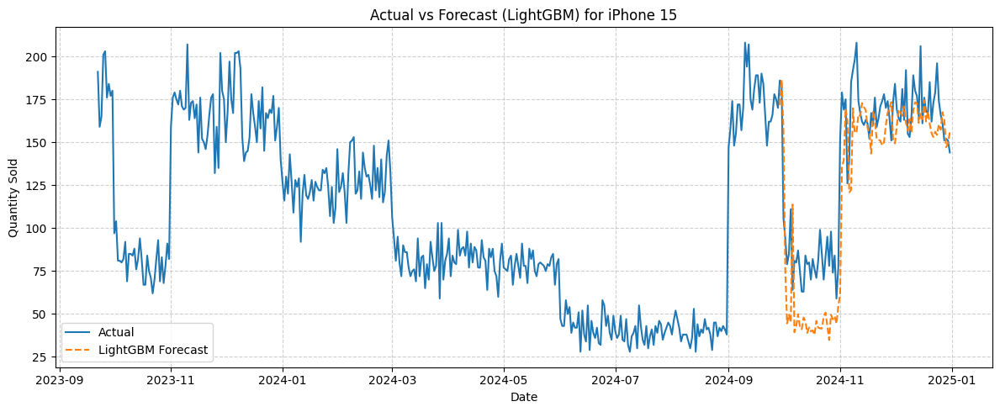


--- Processing Product: 'Samsung S24 Ultra' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 962
[LightGBM] [Info] Number of data points in the train set: 268, number of used features: 33
[LightGBM] [Info] Start training from score 69.716418
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

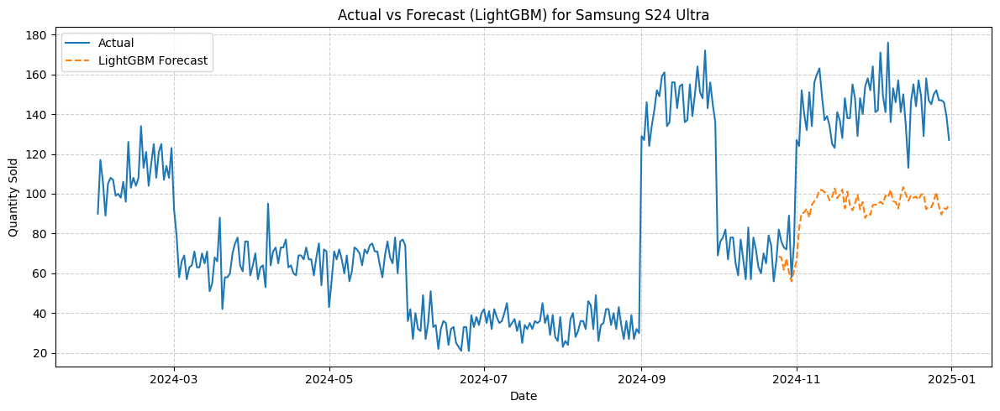


--- Processing Product: 'Samsung S24 Pro' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 268, number of used features: 32
[LightGBM] [Info] Start training from score 70.757463
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

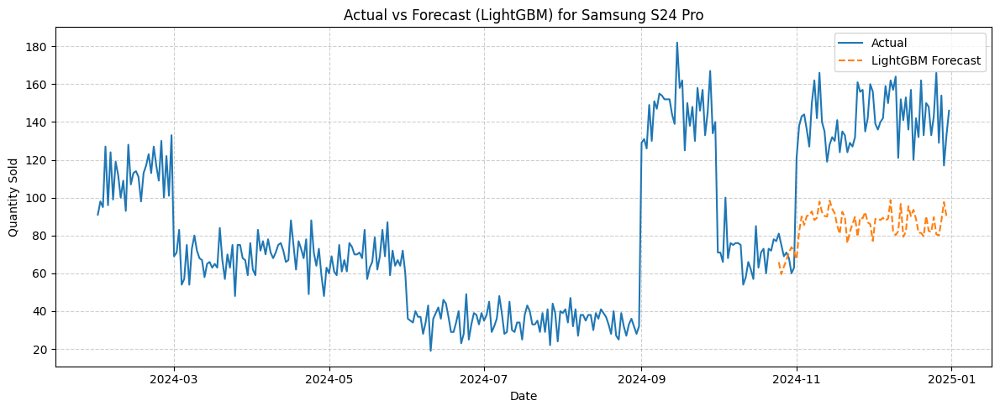


--- Processing Product: 'Samsung S24' with LightGBM ---


/tmp/ipython-input-78-3475009057.py:55: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:55: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily[col].fillna(method='ffill', inplace=True)
/tmp/ipython-input-78-3475009057.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 956
[LightGBM] [Info] Number of data points in the train set: 268, number of used features: 32
[LightGBM] [Info] Start training from score 70.029851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

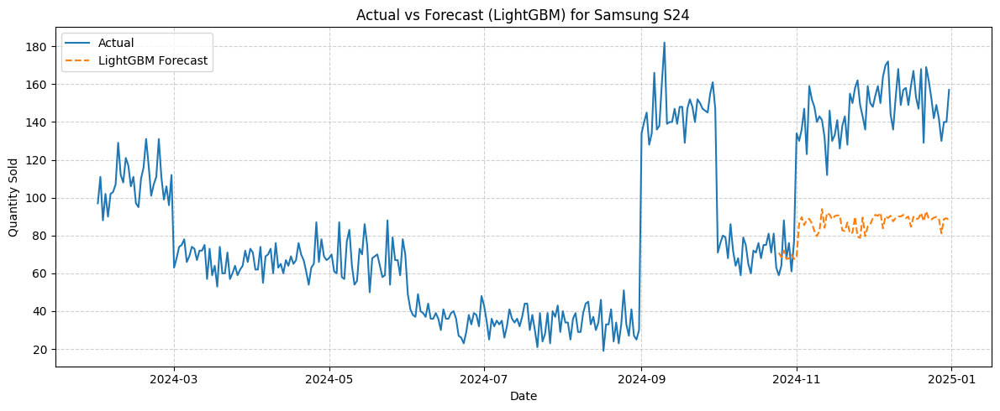


--- Finished LightGBM modeling for all products ---


In [78]:
# Hàm tính MAPE (Mean Absolute Percentage Error)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_true = y_true != 0
    if not np.any(non_zero_true):
        return float('inf') # Tránh chia cho 0 nếu tất cả y_true đều là 0
    return np.mean(np.abs((y_true[non_zero_true] - y_pred[non_zero_true]) / y_true[non_zero_true])) * 100

def run_full_lgbm_pipeline_for_product(df_product_original, product_name):
    """
    Runs the full LightGBM forecasting pipeline for a specific product.
    Includes: Data Preparation, Feature Engineering, Feature Selection & Split,
    Model Training, Performance Evaluation & Visualization.

    Args:
        df_product_original (pd.DataFrame): Raw DataFrame containing data for a specific Product_Name.
        product_name (str): The name of the product being processed (used for plot titles/prints).
    """
    print(f"\n--- Processing Product: '{product_name}' with LightGBM ---")

    # --- 4.1. Data Preparation ---
    df = df_product_original.copy()

    if df.empty:
        print(f"  Warning: Data for '{product_name}' is empty. Skipping.")
        return

    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date').set_index('Date')

    daily = df.resample('D').agg({
        'Quantity_Sold':'sum',
        'Price':'mean',
        'Stock_Level':'sum',
        'Reorder_Threshold':'mean',
        'Promo_Budget':'sum',
        'Store_Size':'mean',
        'Promo_Type_Code':'mean'
    }).rename(columns={
        'Price':'Avg_Price',
        'Stock_Level':'Total_Stock',
        'Reorder_Threshold':'Avg_Reorder_Threshold',
        'Promo_Budget':'Total_Budget',
        'Store_Size':'Avg_Store_Size',
        'Promo_Type_Code':'Avg_Promo_Code'
    }).copy()

    daily.fillna({
        'Quantity_Sold': 0,
        'Total_Stock': 0,
        'Total_Budget': 0
    }, inplace=True)

    for col in ['Avg_Price','Avg_Reorder_Threshold','Avg_Store_Size','Avg_Promo_Code']:
        daily[col].fillna(method='ffill', inplace=True)
        daily[col].fillna(0, inplace=True)

    # --- 4.2. Feature Engineering ---
    daily['t'] = np.arange(len(daily))
    daily['sin7'] = np.sin(2 * np.pi * daily['t'] / 7)
    daily['cos7'] = np.cos(2 * np.pi * daily['t'] / 7)
    daily['sin30'] = np.sin(2 * np.pi * daily['t'] / 30)
    daily['cos30'] = np.cos(2 * np.pi * daily['t'] / 30)

    for lag in [1,7,14,30]:
        daily[f'lag_{lag}'] = daily['Quantity_Sold'].shift(lag).fillna(0)

    for win in [7,14,30]:
        daily[f'roll_{win}'] = daily['Quantity_Sold'].shift(1).rolling(win).mean().fillna(0)

    daily['dow'] = daily.index.dayofweek
    daily['month'] = daily.index.month

    dow_d = pd.get_dummies(daily['dow'], prefix='dow')
    mon_d = pd.get_dummies(daily['month'], prefix='mon')
    daily = daily.join(dow_d).join(mon_d).copy()

    # --- 4.3. Feature Selection & Data Split ---
    features = [
        't','sin7','cos7','sin30','cos30',
        'Avg_Price','Total_Stock','Avg_Reorder_Threshold',
        'Total_Budget','Avg_Store_Size','Avg_Promo_Code'
    ] + [f'lag_{lag}' for lag in [1,7,14,30]] + [f'roll_{win}' for win in [7,14,30]] + \
      [c for c in daily.columns if c.startswith('dow_') or c.startswith('mon_')]

    features = [f for f in features if f in daily.columns]

    daily.dropna(subset=features+['Quantity_Sold'], inplace=True)

    # Check for enough data points after dropna
    if daily.empty or len(daily) < len(features) + 2: # At least len(features) + 2 for basic model and split
        print(f"  Warning: Not enough clean data for '{product_name}' after feature engineering/dropna. Skipping model training.")
        return

    X = daily[features].copy()
    y = daily['Quantity_Sold'].copy()

    split = int(len(daily)*0.8)

    if split == 0 or split == len(X):
        print(f"  Warning: Not enough data ({len(X)} rows) for '{product_name}' to create meaningful train/test sets. Skipping model training.")
        return

    X_train, X_test = X.iloc[:split], X.iloc[split:]
    y_train, y_test = y.iloc[:split], y.iloc[split:]

    # --- 4.4. Model Training ---
    tscv = TimeSeriesSplit(n_splits=5)
    pipeline = Pipeline([
        ('scale', StandardScaler()),
        ('lgbm', LGBMRegressor(random_state=42))
    ])
    param_grid = {
        'lgbm__n_estimators': [100, 200],
        'lgbm__max_depth': [5, 10],
        'lgbm__learning_rate': [0.01, 0.1]
    }

    try:
        search = GridSearchCV(pipeline, param_grid,
                              cv=tscv,
                              scoring='neg_mean_absolute_percentage_error',
                              n_jobs=-1)
        search.fit(X_train, y_train)
        best_model = search.best_estimator_ # Renamed to avoid conflict with 'best' in global scope if any

        print("  Model Training Complete. Best parameters found:")
        print(search.best_params_)

    except Exception as e:
        print(f"  Error during LightGBM model training for '{product_name}': {e}")
        return

    # --- 4.5. Model Evaluation & Visualize ---
    y_pred = best_model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"  Test Set Performance for '{product_name}':\n"
          f"    MAE  = {mae:.2f}\n"
          f"    RMSE = {rmse:.2f}\n"
          f"    MAPE = {mape:.2f}%\n"
          f"    R²   = {r2:.3f}")

    # Monthly seasonal metrics
    df_test = daily.iloc[split:].copy()
    df_test['Forecast'] = y_pred
    df_test['month_num'] = df_test.index.month

    seasonal = df_test.groupby('month_num').apply(lambda x: pd.Series({
        'MAE': mean_absolute_error(x['Quantity_Sold'], x['Forecast']),
        'RMSE': np.sqrt(mean_squared_error(x['Quantity_Sold'], x['Forecast'])),
        'MAPE': mean_absolute_percentage_error(x['Quantity_Sold'], x['Forecast'])*100
    })).reset_index()

    print('\n  Seasonal Metrics by Month:')
    print(seasonal)

    plt.figure(figsize=(12,5))
    plt.plot(daily.index, daily['Quantity_Sold'], label='Actual')
    plt.plot(daily.index[split:], y_pred, '--', label='LightGBM Forecast')
    plt.title(f'Actual vs Forecast (LightGBM) for {product_name}')
    plt.xlabel('Date')
    plt.ylabel('Quantity Sold')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

# --- Main Program: Load data and iterate through products ---

# Load the main dataset (run this only once)
print("Loading final_dataset.csv...")
df_final = pd.read_csv('final_dataset.csv')
df_final['Date'] = pd.to_datetime(df_final['Date'])

# Get list of unique product names
unique_product_names = df_final['Product_Name'].unique()

print(f"\n--- Starting LightGBM modeling for {len(unique_product_names)} products ---")

# Iterate through each unique product and run the pipeline
for p_name in unique_product_names:
    df_product_data = df_final[df_final['Product_Name'] == p_name].copy()
    run_full_lgbm_pipeline_for_product(df_product_data, p_name)

print("\n--- Finished LightGBM modeling for all products ---")